# Neural Network Assignment - forestfires (1).csv

Dataset:- forestfires (1).csv

In [1]:
# Importig Libraries
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split, cross_val_score

In [2]:
# Loading dataset
data = pd.read_csv('/Users/sagar panchal/Downloads/forestfires (1).csv')

# EDA and Preprocessing

In [3]:
data.shape

(517, 31)

In [4]:
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,...,0,0,0,0,1,0,0,0,0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,...,0,0,0,0,0,0,0,1,0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,...,0,0,0,0,0,0,0,1,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,...,0,0,0,0,1,0,0,0,0,small


In [5]:
data.sample(10)

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,...,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep,size_category
203,oct,wed,91.4,37.9,673.8,5.2,20.2,37,2.7,0.0,...,0,0,0,0,0,0,0,1,0,large
62,aug,thu,93.0,75.3,466.6,7.7,18.8,35,4.9,0.0,...,0,0,0,0,0,0,0,0,0,small
46,sep,mon,90.9,126.5,686.5,7.0,14.7,70,3.6,0.0,...,0,0,0,0,0,0,0,0,1,small
42,aug,tue,94.8,108.3,647.1,17.0,16.6,54,5.4,0.0,...,0,0,0,0,0,0,0,0,0,small
143,jul,sat,90.0,51.3,296.3,8.7,16.6,53,5.4,0.0,...,0,0,1,0,0,0,0,0,0,small
163,sep,sat,92.5,121.1,674.4,8.6,17.8,56,1.8,0.0,...,0,0,0,0,0,0,0,0,1,small
481,jul,thu,93.2,114.4,560.0,9.5,30.2,22,4.9,0.0,...,0,0,1,0,0,0,0,0,0,small
296,jun,sun,90.4,89.5,290.8,6.4,14.3,46,1.8,0.0,...,0,0,0,1,0,0,0,0,0,small
452,aug,mon,91.5,238.2,730.6,7.5,17.7,65,4.0,0.0,...,0,0,0,0,0,0,0,0,0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,...,0,0,0,0,1,0,0,0,0,small


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 517 entries, 0 to 516
Data columns (total 31 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   month          517 non-null    object 
 1   day            517 non-null    object 
 2   FFMC           517 non-null    float64
 3   DMC            517 non-null    float64
 4   DC             517 non-null    float64
 5   ISI            517 non-null    float64
 6   temp           517 non-null    float64
 7   RH             517 non-null    int64  
 8   wind           517 non-null    float64
 9   rain           517 non-null    float64
 10  area           517 non-null    float64
 11  dayfri         517 non-null    int64  
 12  daymon         517 non-null    int64  
 13  daysat         517 non-null    int64  
 14  daysun         517 non-null    int64  
 15  daythu         517 non-null    int64  
 16  daytue         517 non-null    int64  
 17  daywed         517 non-null    int64  
 18  monthapr  

In [7]:
data.describe()

,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,dayfri,...,monthdec,monthfeb,monthjan,monthjul,monthjun,monthmar,monthmay,monthnov,monthoct,monthsep
count,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,...,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000,517.000000
mean,90.644681,110.872340,547.940039,9.021663,18.889168,44.288201,4.017602,0.021663,12.847292,0.164410,...,0.017408,0.038685,0.003868,0.061896,0.032882,0.104449,0.003868,0.001934,0.029014,0.332689
std,5.520111,64.046482,248.066192,4.559477,5.806625,16.317469,1.791653,0.295959,63.655818,0.371006,...,0.130913,0.193029,0.062137,0.241199,0.178500,0.306138,0.062137,0.043980,0.168007,0.471632
min,18.700000,1.100000,7.900000,0.000000,2.200000,15.000000,0.400000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,90.200000,68.600000,437.700000,6.500000,15.500000,33.000000,2.700000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,91.600000,108.300000,664.200000,8.400000,19.300000,42.000000,4.000000,0.000000,0.520000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,92.900000,142.400000,713.900000,10.800000,22.800000,53.000000,4.900000,0.000000,6.570000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
max,96.200000,291.300000,860.600000,56.100000,33.300000,100.000000,9.400000,6.400000,1090.840000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [8]:
data.isna().sum()

month            0
day              0
FFMC             0
DMC              0
DC               0
ISI              0
temp             0
RH               0
wind             0
rain             0
area             0
dayfri           0
daymon           0
daysat           0
daysun           0
daythu           0
daytue           0
daywed           0
monthapr         0
monthaug         0
monthdec         0
monthfeb         0
monthjan         0
monthjul         0
monthjun         0
monthmar         0
monthmay         0
monthnov         0
monthoct         0
monthsep         0
size_category    0
dtype: int64

In [9]:
# Dropping columns which are not required
data = data.drop(['dayfri', 'daymon', 'daysat', 'daysun', 'daythu','daytue', 'daywed', 'monthapr', 'monthaug', 'monthdec', 
                  'monthfeb','monthjan', 'monthjul', 'monthjun', 'monthmar', 'monthmay', 'monthnov','monthoct','monthsep'], 
                 axis = 1)
data

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.00,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.00,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.00,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.00,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.00,small
...,...,...,...,...,...,...,...,...,...,...,...,...
512,aug,sun,81.6,56.7,665.6,1.9,27.8,32,2.7,0.0,6.44,large
513,aug,sun,81.6,56.7,665.6,1.9,21.9,71,5.8,0.0,54.29,large
514,aug,sun,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,large
515,aug,sat,94.4,146.0,614.7,11.3,25.6,42,4.0,0.0,0.00,small


In [10]:
# Checking how much datapoints are having small and large area
data.size_category.value_counts()

small    378
large    139
Name: size_category, dtype: int64

<AxesSubplot:xlabel='size_category', ylabel='count'>

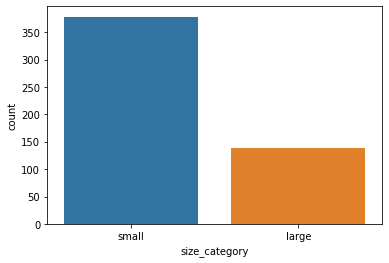

In [11]:
import seaborn as sns
sns.countplot(x = 'size_category', data = data)

In [12]:
# Checking for which value of area is categorised into large and small by creating crosstab between area and size_category
pd.crosstab(data.area, data.size_category)

size_category,large,small
area,,
0.00,0,247
0.09,0,1
0.17,0,1
0.21,0,1
0.24,0,1
...,...,...
200.94,1,0
212.88,1,0
278.53,1,0


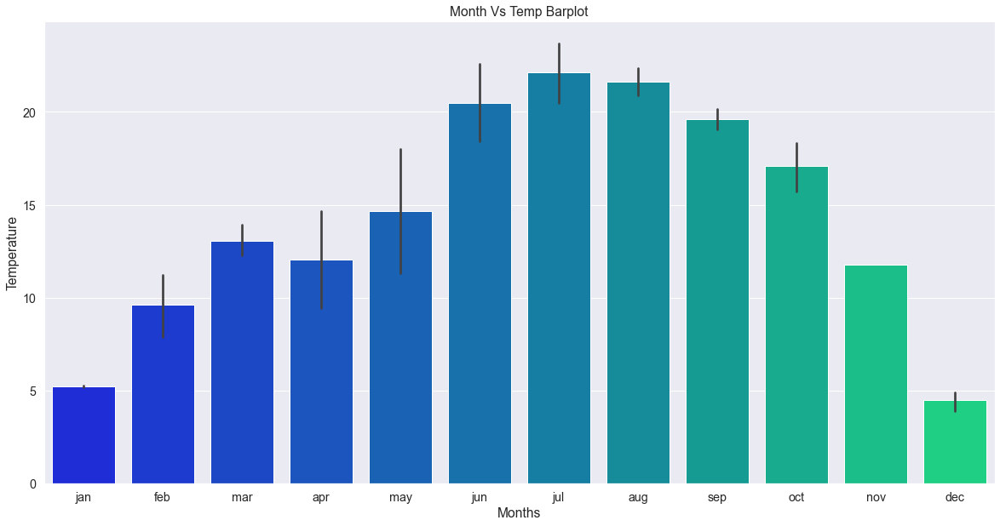

In [13]:
# Plotting Month Vs. temp plot
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [20, 10]
sns.set(style = "darkgrid", font_scale = 1.3)
month_temp = sns.barplot(x = 'month', y = 'temp', data = data,
                         order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun', 'jul', 'aug', 'sep', 'oct', 'nov', 'dec'], palette = 'winter');
month_temp.set(title = "Month Vs Temp Barplot", xlabel = "Months", ylabel = "Temperature");

C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


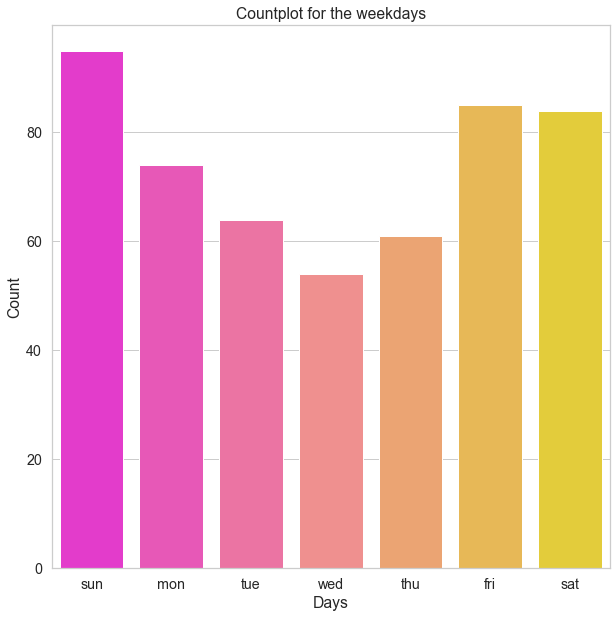

In [14]:
plt.rcParams['figure.figsize'] = [10, 10]
sns.set(style = 'whitegrid', font_scale = 1.3)
day = sns.countplot(data['day'], order = ['sun' ,'mon', 'tue', 'wed', 'thu', 'fri', 'sat'], palette = 'spring')
day.set(title = 'Countplot for the weekdays', xlabel = 'Days', ylabel = 'Count');

Text(0.5, 1.0, 'HeatMap of Features for the Classes')

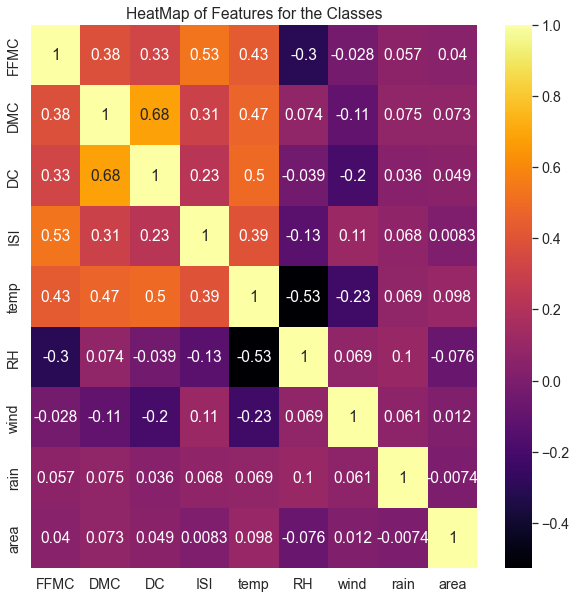

In [15]:
sns.heatmap(data.corr(), annot=True, cmap="inferno")
ax = plt.gca()
ax.set_title("HeatMap of Features for the Classes")

In [16]:
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,mar,fri,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,small
1,oct,tue,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,small
2,oct,sat,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,small
3,mar,fri,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,small
4,mar,sun,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,small


In [17]:
# Encoding month and day features
data.month.replace(('jan','feb','mar','apr','may','jun','jul','aug','sep','oct','nov','dec'),
                           (1,2,3,4,5,6,7,8,9,10,11,12), inplace=True)
data.day.replace(('mon','tue','wed','thu','fri','sat','sun'),(1,2,3,4,5,6,7), inplace=True)
data.head()

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
0,3,5,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0,small
1,10,2,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0,small
2,10,6,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0,small
3,3,5,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0,small
4,3,7,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0,small


In [18]:
# Encoding target variable 'size category'
data.size_category.replace(('small', 'large'), (0, 1), inplace = True)
data.sample(5)

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area,size_category
43,9,6,92.5,88.0,698.6,7.1,19.6,48,2.7,0.0,0.00,0
369,9,7,91.0,276.3,825.1,7.1,13.8,77,7.6,0.0,0.00,0
382,8,3,95.2,217.7,690.0,18.0,28.2,29,1.8,0.0,5.86,0
318,9,4,92.8,119.0,783.5,7.5,21.6,27,2.2,0.0,0.00,0
514,8,7,81.6,56.7,665.6,1.9,21.2,70,6.7,0.0,11.16,1


In [19]:
data.corr()['size_category'].sort_values(ascending=False)

size_category    1.000000
area             0.311322
month            0.080316
wind             0.059113
rain             0.050001
DMC              0.034715
FFMC             0.022063
DC               0.019428
day              0.016796
temp             0.006021
ISI             -0.008726
RH              -0.045243
Name: size_category, dtype: float64

In [20]:
# Standardizing data
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()

In [21]:
scaler.fit(data.drop('size_category',axis=1))

StandardScaler()

In [22]:
scaled_features=scaler.transform(data.drop('size_category',axis=1))
data_head=pd.DataFrame(scaled_features,columns=data.columns[:-1])
data_head

,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,-1.968443,0.357721,-0.805959,-1.323326,-1.830477,-0.860946,-1.842640,0.411724,1.498614,-0.073268,-0.202020
1,1.110120,-1.090909,-0.008102,-1.179541,0.488891,-0.509688,-0.153278,-0.692456,-1.741756,-0.073268,-0.202020
2,1.110120,0.840597,-0.008102,-1.049822,0.560715,-0.509688,-0.739383,-0.692456,-1.518282,-0.073268,-0.202020
3,-1.968443,0.357721,0.191362,-1.212361,-1.898266,-0.004756,-1.825402,3.233519,-0.009834,0.603155,-0.202020
4,-1.968443,1.323474,-0.243833,-0.931043,-1.798600,0.126966,-1.291012,3.356206,-1.238940,-0.073268,-0.202020
...,...,...,...,...,...,...,...,...,...,...,...
512,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,1.536084,-0.753800,-0.736124,-0.073268,-0.100753
513,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,0.519019,1.638592,0.995798,-0.073268,0.651674
514,0.230531,1.323474,-1.640083,-0.846648,0.474768,-1.563460,0.398350,1.577248,1.498614,-0.073268,-0.026532
515,0.230531,0.840597,0.680957,0.549003,0.269382,0.500176,1.156839,-0.140366,-0.009834,-0.073268,-0.202020


In [23]:
# Splitting data into test data and train data
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(data_head,data['size_category'], test_size=0.3, random_state=42)

In [24]:
print('Shape of x_train: ', x_train.shape)
print('Shape of x_test: ', x_test.shape)
print('Shape of y_train: ', y_train.shape)
print('Shape of y_test: ', y_test.shape)

Shape of x_train:  (361, 11)
Shape of x_test:  (156, 11)
Shape of y_train:  (361,)
Shape of y_test:  (156,)


# Artificial Neural Network Model - Backpropagation

In [25]:
from keras.models import Sequential
from keras.layers import Dense

In [26]:
# create model
model = Sequential()
model.add(Dense(12, input_dim=11, kernel_initializer='uniform', activation='relu'))
model.add(Dense(10, kernel_initializer='uniform', activation='relu'))
model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))

In [27]:
# Compile model
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [28]:
# Fit the model
model.fit(x_train,y_train, epochs=100, batch_size=10)

Epoch 1/100
37/37 [==============================] - 1s 2ms/step - loss: 0.6888 - accuracy: 0.7230
Epoch 2/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6735 - accuracy: 0.7285
Epoch 3/100
37/37 [==============================] - 0s 2ms/step - loss: 0.6388 - accuracy: 0.7285
Epoch 4/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5924 - accuracy: 0.7285
Epoch 5/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5566 - accuracy: 0.7285
Epoch 6/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5365 - accuracy: 0.7313
Epoch 7/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5221 - accuracy: 0.7452
Epoch 8/100
37/37 [==============================] - 0s 2ms/step - loss: 0.5085 - accuracy: 0.7562
Epoch 9/100
37/37 [==============================] - 0s 2ms/step - loss: 0.4928 - accuracy: 0.7673
Epoch 10/100
37/37 [==============================] - 0s 2ms/step - loss: 0.4744 - accuracy: 0.7784
Epoch 11/

37/37 [==============================] - 0s 2ms/step - loss: 0.0253 - accuracy: 0.9917
Epoch 83/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0265 - accuracy: 0.9972
Epoch 84/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0364 - accuracy: 0.9889
Epoch 85/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0252 - accuracy: 0.9972
Epoch 86/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0246 - accuracy: 0.9945
Epoch 87/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0236 - accuracy: 0.9945
Epoch 88/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0233 - accuracy: 0.9945
Epoch 89/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0236 - accuracy: 0.9917
Epoch 90/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0227 - accuracy: 0.9972
Epoch 91/100
37/37 [==============================] - 0s 2ms/step - loss: 0.0247 - accuracy: 0.9889
Epoch 92/100


In [29]:
# evaluate the model
scores = model.evaluate(x_test, y_test)
print("%s: %.2f%%" % (model.metrics_names[1], scores[1]*100))

5/5 [==============================] - 0s 2ms/step - loss: 0.0663 - accuracy: 0.9615
accuracy: 96.15%


# Artificial Neural Network Model - Tuning of Hyperparameters batch size and epochs 

In [30]:
# Importing the necessary packages
from sklearn.model_selection import GridSearchCV, KFold
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.optimizers import adam_v2
from keras.layers import Dropout

In [31]:
# create model
def create_model():
    model = Sequential()
    model.add(Dense(12, input_dim=11, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(8, kernel_initializer='uniform', activation='relu'))
    model.add(Dense(1, kernel_initializer='uniform', activation='sigmoid'))
    
    adam=adam_v2.Adam(learning_rate=0.01)
    model.compile(loss='binary_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

In [32]:
# Create the model
model = KerasClassifier(build_fn = create_model,verbose = 0)
# Define the grid search parameters
batch_size = [10,20,40]
epochs = [10,50,100]
# Make a dictionary of the grid search parameters
param_grid = dict(batch_size = batch_size,epochs = epochs)
# Build and fit the GridSearchCV
grid = GridSearchCV(estimator = model,param_grid = param_grid,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

C:\Users\SAGARP~1\AppData\Local\Temp/ipykernel_11628/4006058613.py:2: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn = create_model,verbose = 0)


Fitting 5 folds for each of 9 candidates, totalling 45 fits
[CV 1/5; 1/9] START batch_size=10, epochs=10....................................
[CV 1/5; 1/9] END .....batch_size=10, epochs=10;, score=0.932 total time=   1.8s
[CV 2/5; 1/9] START batch_size=10, epochs=10....................................
[CV 2/5; 1/9] END .....batch_size=10, epochs=10;, score=0.944 total time=   1.6s
[CV 3/5; 1/9] START batch_size=10, epochs=10....................................
[CV 3/5; 1/9] END .....batch_size=10, epochs=10;, score=0.944 total time=   1.6s
[CV 4/5; 1/9] START batch_size=10, epochs=10....................................
[CV 4/5; 1/9] END .....batch_size=10, epochs=10;, score=0.972 total time=   1.6s
[CV 5/5; 1/9] START batch_size=10, epochs=10....................................
[CV 5/5; 1/9] END .....batch_size=10, epochs=10;, score=0.972 total time=   1.7s
[CV 1/5; 2/9] START batch_size=10, epochs=50....................................
[CV 1/5; 2/9] END .....batch_size=10, epochs=50;,

[CV 2/5; 9/9] END ....batch_size=40, epochs=100;, score=0.986 total time=   2.6s
[CV 3/5; 9/9] START batch_size=40, epochs=100...................................
[CV 3/5; 9/9] END ....batch_size=40, epochs=100;, score=0.972 total time=   3.0s
[CV 4/5; 9/9] START batch_size=40, epochs=100...................................
[CV 4/5; 9/9] END ....batch_size=40, epochs=100;, score=1.000 total time=   2.6s
[CV 5/5; 9/9] START batch_size=40, epochs=100...................................
[CV 5/5; 9/9] END ....batch_size=40, epochs=100;, score=0.972 total time=   2.6s


In [33]:
# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

Best : 0.983371376991272, using {'batch_size': 40, 'epochs': 100}
0.9529680252075196,0.016415431982583707 with: {'batch_size': 10, 'epochs': 10}
0.9722983121871949,0.01964245412010319 with: {'batch_size': 10, 'epochs': 50}
0.9584474682807922,0.015216235655616138 with: {'batch_size': 10, 'epochs': 100}
0.9141932964324951,0.025165399721625625 with: {'batch_size': 20, 'epochs': 10}
0.9723363637924194,0.012296434096924151 with: {'batch_size': 20, 'epochs': 50}
0.9612252473831177,0.0055029227261713075 with: {'batch_size': 20, 'epochs': 100}
0.7949010610580445,0.04637397816558034 with: {'batch_size': 40, 'epochs': 10}
0.969558584690094,0.005327248573303223 with: {'batch_size': 40, 'epochs': 50}
0.983371376991272,0.01040394079109783 with: {'batch_size': 40, 'epochs': 100}


# rtificial Neural Network Model - Tuning of All Hyperparameters 

In [34]:
def create_model(learning_rate,dropout_rate,activation_function,init,neuron1,neuron2):
    model = Sequential()
    model.add(Dense(neuron1,input_dim = 11,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(neuron2,input_dim = neuron1,kernel_initializer = init,activation = activation_function))
    model.add(Dropout(dropout_rate))
    model.add(Dense(1,activation = 'sigmoid'))
    
    adam=adam_v2.Adam(learning_rate = learning_rate)
    model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])
    return model

# Create the model

model = KerasClassifier(build_fn = create_model,verbose = 0)

# Define the grid search parameters

batch_size = [10,20,40]
epochs = [10,50,100]
learning_rate = [0.001,0.01,0.1]
dropout_rate = [0.0,0.1,0.2]
activation_function = ['softmax','relu','tanh','linear']
init = ['uniform','normal','zero']
neuron1 = [4,8,16]
neuron2 = [2,4,8]

# Make a dictionary of the grid search parameters

param_grids = dict(batch_size = batch_size,epochs = epochs,learning_rate = learning_rate,dropout_rate = dropout_rate,
                   activation_function = activation_function,init = init,neuron1 = neuron1,neuron2 = neuron2)

# Build and fit the GridSearchCV

grid = GridSearchCV(estimator = model,param_grid = param_grids,cv = KFold(),verbose = 10)
grid_result = grid.fit(x_train, y_train)

# Summarize the results
print('Best : {}, using {}'.format(grid_result.best_score_,grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
  print('{},{} with: {}'.format(mean, stdev, param))

C:\Users\SAGARP~1\AppData\Local\Temp/ipykernel_11628/1736946403.py:15: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn = create_model,verbose = 0)


Fitting 5 folds for each of 8748 candidates, totalling 43740 fits
[CV 1/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   1.7s
[CV 2/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.8s
[CV 3/5; 1/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, lear

[CV 5/5; 5/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.7s
[CV 1/5; 6/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 6/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 6/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 6/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.7s
[CV 3/5; 6/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 10/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.847 total time=   1.6s
[CV 1/5; 11/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 11/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.849 total time=   2.0s
[CV 2/5; 11/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 11/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.889 total time=   1.7s
[CV 3/5; 11/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 5/5; 15/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.847 total time=   1.6s
[CV 1/5; 16/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 16/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.849 total time=   1.7s
[CV 2/5; 16/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 16/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.819 total time=   1.7s
[CV 3/5; 16/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, 

[CV 5/5; 20/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.7s
[CV 1/5; 21/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 21/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   1.7s
[CV 2/5; 21/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 21/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.889 total time=   1.6s
[CV 3/5; 21/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 5/5; 25/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.847 total time=   1.7s
[CV 1/5; 26/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 26/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.877 total time=   1.7s
[CV 2/5; 26/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 26/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   1.8s
[CV 3/5; 26/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 5/5; 30/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   2.0s
[CV 1/5; 31/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 31/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.6s
[CV 2/5; 31/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 31/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.264 total time=   1.7s
[CV 3/5; 31/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 35/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 36/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 36/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.7s
[CV 3/5; 36/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16,

[CV 5/5; 40/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.847 total time=   1.6s
[CV 1/5; 41/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 41/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.849 total time=   1.7s
[CV 2/5; 41/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 41/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.903 total time=   1.7s
[CV 3/5; 41/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 5/5; 45/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.889 total time=   1.7s
[CV 1/5; 46/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 46/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.6s
[CV 2/5; 46/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 46/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.875 total time=   2.0s
[CV 3/5; 46/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 50/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.889 total time=   1.6s
[CV 1/5; 51/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 51/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.904 total time=   1.7s
[CV 2/5; 51/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 51/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   1.7s
[CV 3/5; 51/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 55/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.6s
[CV 1/5; 56/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 56/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   1.7s
[CV 2/5; 56/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 56/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.6s
[CV 3/5; 56/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 60/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 61/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 61/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   1.7s
[CV 2/5; 61/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 61/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.7s
[CV 3/5; 61/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[C

[CV 5/5; 65/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 66/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   2.0s
[CV 2/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 66/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.7s
[CV 3/5; 66/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 66/8

[CV 5/5; 70/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.6s
[CV 1/5; 71/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 71/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.7s
[CV 2/5; 71/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 71/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.6s
[CV 3/5; 71/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 75/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 76/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 76/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   1.6s
[CV 2/5; 76/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 76/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.6s
[CV 3/5; 76/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 76/8748] E

[CV 5/5; 80/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   1.7s
[CV 1/5; 81/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 81/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 81/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 81/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.6s
[CV 3/5; 81/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 81/8

[CV 5/5; 85/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   3.7s
[CV 1/5; 86/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 86/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   4.1s
[CV 2/5; 86/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 86/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   3.7s
[CV 3/5; 86/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8,

[CV 5/5; 90/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   3.8s
[CV 1/5; 91/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 91/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   3.7s
[CV 2/5; 91/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 91/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   3.7s
[CV 3/5; 91/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neu

[CV 5/5; 95/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   4.7s
[CV 1/5; 96/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 96/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.945 total time=   4.7s
[CV 2/5; 96/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 96/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.917 total time=   4.9s
[CV 3/5; 96/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 5/5; 100/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   4.4s
[CV 1/5; 101/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 101/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.959 total time=   4.6s
[CV 2/5; 101/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 101/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   5.2s
[CV 3/5; 101/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 5/5; 105/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   5.3s
[CV 1/5; 106/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 106/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.918 total time=   5.5s
[CV 2/5; 106/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 106/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.833 total time=   5.4s
[CV 3/5; 106/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, 

[CV 5/5; 110/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.778 total time=   3.8s
[CV 1/5; 111/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 111/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   3.7s
[CV 2/5; 111/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 111/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   3.8s
[CV 3/5; 111/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 5/5; 115/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   3.8s
[CV 1/5; 116/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 116/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   3.7s
[CV 2/5; 116/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 116/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   4.2s
[CV 3/5; 116/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 5/5; 120/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   4.1s
[CV 1/5; 121/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 121/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.945 total time=   3.8s
[CV 2/5; 121/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 121/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   3.7s
[CV 3/5; 121/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 5/5; 125/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   3.7s
[CV 1/5; 126/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 126/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.932 total time=   3.8s
[CV 2/5; 126/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 126/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   3.8s
[CV 3/5; 126/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 5/5; 130/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   3.7s
[CV 1/5; 131/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 131/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.959 total time=   3.8s
[CV 2/5; 131/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 131/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   3.8s
[CV 3/5; 131/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 5/5; 135/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   3.7s
[CV 1/5; 136/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 136/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   3.7s
[CV 2/5; 136/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 136/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   3.6s
[CV 3/5; 136/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2


[CV 5/5; 140/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   3.8s
[CV 1/5; 141/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 141/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   3.7s
[CV 2/5; 141/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 141/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   3.7s
[CV 3/5; 141/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 5/5; 145/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   3.8s
[CV 1/5; 146/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 146/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   3.7s
[CV 2/5; 146/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 146/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   3.5s
[CV 3/5; 146/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 150/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   3.7s
[CV 1/5; 151/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 151/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   3.7s
[CV 2/5; 151/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 151/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   4.1s
[CV 3/5; 151/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[C

[CV 5/5; 155/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   4.2s
[CV 1/5; 156/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 156/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   3.9s
[CV 2/5; 156/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 156/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   3.9s
[CV 3/5; 156/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 156/

[CV 5/5; 160/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   3.9s
[CV 1/5; 161/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 161/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   3.9s
[CV 2/5; 161/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 161/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   3.3s
[CV 3/5; 161/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 165/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.861 total time=   6.5s
[CV 1/5; 166/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 166/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.877 total time=   7.0s
[CV 2/5; 166/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 166/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.903 total time=   6.6s
[CV 3/5; 166/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001

[CV 4/5; 170/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   5.6s
[CV 5/5; 170/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 170/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.847 total time=   7.0s
[CV 1/5; 171/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 171/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.863 total time=   7.3s
[CV 2/5; 171/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=

[CV 4/5; 175/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   6.7s
[CV 5/5; 175/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 175/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   6.6s
[CV 1/5; 176/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 176/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.945 total time=   6.6s
[CV 2/5; 176/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 4/5; 180/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   6.7s
[CV 5/5; 180/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 180/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   6.8s
[CV 1/5; 181/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 181/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   6.6s
[CV 2/5; 181/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 4/5; 185/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   6.5s
[CV 5/5; 185/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 185/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   6.5s
[CV 1/5; 186/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 186/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   6.6s
[CV 2/5; 186/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 4/5; 190/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.931 total time=   7.1s
[CV 5/5; 190/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 190/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.847 total time=   8.4s
[CV 1/5; 191/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 191/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.877 total time=   8.2s
[CV 2/5; 191/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 4/5; 195/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   6.6s
[CV 5/5; 195/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 195/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.847 total time=   6.7s
[CV 1/5; 196/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 196/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.863 total time=   6.5s
[CV 2/5; 196/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, ne

[CV 4/5; 200/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   6.6s
[CV 5/5; 200/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 200/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   6.6s
[CV 1/5; 201/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 201/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   6.7s
[CV 2/5; 201/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 4/5; 205/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   6.6s
[CV 5/5; 205/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 205/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   6.5s
[CV 1/5; 206/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 206/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   6.5s
[CV 2/5; 206/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 4/5; 210/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   6.5s
[CV 5/5; 210/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 210/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   6.5s
[CV 1/5; 211/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 211/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.973 total time=   6.5s
[CV 2/5; 211/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 215/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   6.6s
[CV 5/5; 215/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 215/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   6.5s
[CV 1/5; 216/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 216/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.918 total time=   6.6s
[CV 2/5; 216/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 4/5; 220/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   6.5s
[CV 5/5; 220/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 220/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   6.4s
[CV 1/5; 221/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 221/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   6.4s
[CV 2/5; 221/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 4/5; 225/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   6.6s
[CV 5/5; 225/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 225/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   6.5s
[CV 1/5; 226/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 226/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   6.4s
[CV 2/5; 226/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 230/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   6.6s
[CV 5/5; 230/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 230/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   6.5s
[CV 1/5; 231/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 231/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   6.6s
[CV 2/5; 231/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 4/5; 235/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   6.4s
[CV 5/5; 235/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 235/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   6.4s
[CV 1/5; 236/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 236/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   6.4s
[CV 2/5; 236/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5

[CV 4/5; 240/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   6.5s
[CV 5/5; 240/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 240/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   6.5s
[CV 1/5; 241/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 241/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   7.0s
[CV 2/5; 241/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 

[CV 4/5; 245/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   2.3s
[CV 5/5; 245/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 245/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.8s
[CV 1/5; 246/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 246/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.8s
[CV 2/5; 246/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 4/5; 250/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 250/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 250/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 251/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 251/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.8s
[CV 2/5; 251/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001,

[CV 4/5; 255/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.875 total time=   1.9s
[CV 5/5; 255/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 255/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.833 total time=   1.9s
[CV 1/5; 256/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 256/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.808 total time=   1.8s
[CV 2/5; 256/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 4/5; 260/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.903 total time=   1.8s
[CV 5/5; 260/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 260/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.806 total time=   1.8s
[CV 1/5; 261/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 261/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.849 total time=   1.8s
[CV 2/5; 261/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 4/5; 265/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.889 total time=   1.8s
[CV 5/5; 265/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 265/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.9s
[CV 1/5; 266/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 266/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.849 total time=   2.0s
[CV 2/5; 266/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 270/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   1.8s
[CV 5/5; 270/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 270/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.847 total time=   1.8s
[CV 1/5; 271/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 271/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 271/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 4/5; 275/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.8s
[CV 5/5; 275/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 275/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.8s
[CV 1/5; 276/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 276/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   2.3s
[CV 2/5; 276/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 4/5; 280/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   2.2s
[CV 5/5; 280/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 280/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.819 total time=   1.9s
[CV 1/5; 281/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 281/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.849 total time=   1.8s
[CV 2/5; 281/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 285/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.889 total time=   1.9s
[CV 5/5; 285/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 285/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.833 total time=   1.8s
[CV 1/5; 286/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 286/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.836 total time=   1.9s
[CV 2/5; 286/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, ne

[CV 4/5; 290/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.8s
[CV 5/5; 290/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 290/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   1.9s
[CV 1/5; 291/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 291/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   1.8s
[CV 2/5; 291/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 4/5; 295/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   1.8s
[CV 5/5; 295/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 295/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   1.9s
[CV 1/5; 296/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 296/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.877 total time=   1.9s
[CV 2/5; 296/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 4/5; 300/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.7s
[CV 5/5; 300/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 300/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 301/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 301/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 301/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 4/5; 305/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.8s
[CV 5/5; 305/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 305/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.7s
[CV 1/5; 306/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 306/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.8s
[CV 2/5; 306/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 4/5; 310/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 310/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 310/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 311/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 311/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 311/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 315/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.889 total time=   0.6s
[CV 5/5; 315/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 315/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.819 total time=   0.6s
[CV 1/5; 316/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 316/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.863 total time=   0.8s
[CV 2/5; 316/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5

[CV 4/5; 320/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   0.8s
[CV 5/5; 320/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 320/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.847 total time=   0.5s
[CV 1/5; 321/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 321/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.945 total time=   0.6s
[CV 2/5; 321/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 321/

[CV 4/5; 325/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 325/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 325/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 326/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 326/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 326/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 4/5; 330/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.3s
[CV 5/5; 330/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 330/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 331/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 331/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 331/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, ne

[CV 4/5; 335/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 335/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 335/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   1.2s
[CV 1/5; 336/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 336/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   1.2s
[CV 2/5; 336/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 4/5; 340/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.2s
[CV 5/5; 340/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 340/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   1.3s
[CV 1/5; 341/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 341/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 341/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 4/5; 345/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 345/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 345/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.3s
[CV 1/5; 346/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 346/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.918 total time=   1.2s
[CV 2/5; 346/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 350/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   1.3s
[CV 5/5; 350/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 350/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   1.3s
[CV 1/5; 351/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 351/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.945 total time=   1.2s
[CV 2/5; 351/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 4/5; 355/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 355/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 355/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 356/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 356/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 356/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 4/5; 360/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.3s
[CV 5/5; 360/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 360/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 361/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 361/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.5s
[CV 2/5; 361/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4,

[CV 4/5; 365/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 365/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 365/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.6s
[CV 1/5; 366/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 366/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.959 total time=   1.3s
[CV 2/5; 366/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 4/5; 370/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.7s
[CV 5/5; 370/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 370/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.806 total time=   1.3s
[CV 1/5; 371/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 371/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   1.4s
[CV 2/5; 371/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 4/5; 375/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 375/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 375/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.3s
[CV 1/5; 376/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 376/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.849 total time=   1.2s
[CV 2/5; 376/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=

[CV 4/5; 380/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.2s
[CV 5/5; 380/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 380/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 381/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 381/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 381/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 4/5; 385/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 385/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 385/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 386/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 386/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 386/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 4/5; 390/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 390/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 390/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.2s
[CV 1/5; 391/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 391/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.3s
[CV 2/5; 391/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5

[CV 4/5; 395/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   1.3s
[CV 5/5; 395/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 395/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   1.3s
[CV 1/5; 396/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 396/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.945 total time=   1.3s
[CV 2/5; 396/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 4/5; 400/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.2s
[CV 5/5; 400/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 400/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.3s
[CV 1/5; 401/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 401/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.945 total time=   1.2s
[CV 2/5; 401/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 401/

[CV 4/5; 405/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   1.2s
[CV 5/5; 405/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 405/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   1.3s
[CV 1/5; 406/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 406/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.836 total time=   2.1s
[CV 2/5; 406/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV 4/5; 410/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.875 total time=   2.1s
[CV 5/5; 410/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 410/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   2.1s
[CV 1/5; 411/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 411/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.849 total time=   2.2s
[CV 2/5; 411/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001

[CV 3/5; 415/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   2.1s
[CV 4/5; 415/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 415/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   2.1s
[CV 5/5; 415/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 415/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   2.1s
[CV 1/5; 416/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 420/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   2.1s
[CV 4/5; 420/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 420/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   2.1s
[CV 5/5; 420/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 420/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   2.1s
[CV 1/5; 421/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 425/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   2.1s
[CV 4/5; 425/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 425/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   2.1s
[CV 5/5; 425/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 425/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   2.1s
[CV 1/5; 426/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 3/5; 430/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.847 total time=   2.1s
[CV 4/5; 430/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 430/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   2.1s
[CV 5/5; 430/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 430/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   2.4s
[CV 1/5; 431/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuro

[CV 3/5; 435/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   2.1s
[CV 4/5; 435/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 435/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.875 total time=   2.1s
[CV 5/5; 435/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 435/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.833 total time=   2.1s
[CV 1/5; 436/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 440/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   2.1s
[CV 4/5; 440/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 440/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.889 total time=   2.1s
[CV 5/5; 440/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 440/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   2.1s
[CV 1/5; 441/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV 3/5; 445/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   2.1s
[CV 4/5; 445/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 445/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   2.1s
[CV 5/5; 445/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 445/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   2.2s
[CV 1/5; 446/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 3/5; 450/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   2.1s
[CV 4/5; 450/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 450/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   2.1s
[CV 5/5; 450/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 450/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   2.1s
[CV 1/5; 451/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron

[CV 3/5; 455/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   2.1s
[CV 4/5; 455/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 455/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   2.1s
[CV 5/5; 455/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 455/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   2.1s
[CV 1/5; 456/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   2.1s
[CV 4/5; 460/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   2.1s
[CV 5/5; 460/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 460/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.847 total time=   2.1s
[CV 1/5; 461/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 465/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.806 total time=   2.1s
[CV 4/5; 465/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 465/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.861 total time=   2.1s
[CV 5/5; 465/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 465/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   2.2s
[CV 1/5; 466/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neur

[CV 3/5; 470/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   2.1s
[CV 4/5; 470/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 470/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   2.1s
[CV 5/5; 470/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 470/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   2.1s
[CV 1/5; 471/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 3/5; 475/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   2.2s
[CV 4/5; 475/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 475/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   2.1s
[CV 5/5; 475/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 475/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   2.2s
[CV 1/5; 476/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 480/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   2.1s
[CV 4/5; 480/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 480/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   2.1s
[CV 5/5; 480/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 480/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   2.1s
[CV 1/5; 481/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 485/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   2.1s
[CV 4/5; 485/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 485/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   2.2s
[CV 5/5; 485/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 485/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   2.2s
[CV 1/5; 486/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 3/5; 490/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 490/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 490/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.264 total time=   0.6s
[CV 5/5; 490/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 490/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 491/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 495/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 495/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 495/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 496/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, 

[CV 3/5; 500/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 500/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 500/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 500/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 500/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 501/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 3/5; 505/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   0.6s
[CV 4/5; 505/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 505/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 505/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 505/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 506/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 510/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.889 total time=   0.6s
[CV 4/5; 510/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 510/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   0.6s
[CV 5/5; 510/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 510/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.889 total time=   0.6s
[CV 1/5; 511/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neur

[CV 3/5; 515/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 515/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 515/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 515/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 515/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 516/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 3/5; 520/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 520/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 520/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.7s
[CV 5/5; 520/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 520/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 521/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuro

[CV 3/5; 525/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.806 total time=   2.2s
[CV 4/5; 525/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 525/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.9s
[CV 5/5; 525/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 525/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.8s
[CV 1/5; 526/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 530/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 530/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 530/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.819 total time=   1.2s
[CV 5/5; 530/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 530/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.833 total time=   0.8s
[CV 1/5; 531/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16,

[CV 3/5; 535/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.792 total time=   0.8s
[CV 4/5; 535/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 535/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   0.8s
[CV 5/5; 535/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 535/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.847 total time=   1.1s
[CV 1/5; 536/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 3/5; 540/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.750 total time=   0.8s
[CV 4/5; 540/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 540/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   0.8s
[CV 5/5; 540/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 540/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.847 total time=   0.8s
[CV 1/5; 541/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron

[CV 3/5; 545/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.5s
[CV 4/5; 545/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 545/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 545/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 545/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.1s
[CV 1/5; 546/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 3/5; 550/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   1.9s
[CV 4/5; 550/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 550/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   2.0s
[CV 5/5; 550/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 550/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   1.9s
[CV 1/5; 551/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 555/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.9s
[CV 4/5; 555/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 555/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.833 total time=   1.8s
[CV 5/5; 555/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 555/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.833 total time=   2.0s
[CV 1/5; 556/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.875 total time=   1.8s
[CV 4/5; 560/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.903 total time=   1.8s
[CV 5/5; 560/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 560/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.875 total time=   1.8s
[CV 1/5; 561/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 561/

[CV 3/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.778 total time=   1.7s
[CV 4/5; 565/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.847 total time=   1.9s
[CV 5/5; 565/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 565/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.778 total time=   1.8s
[CV 1/5; 566/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 570/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   4.0s
[CV 4/5; 570/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 570/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   4.2s
[CV 5/5; 570/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 570/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   4.0s
[CV 1/5; 571/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 3/5; 575/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 575/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 575/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   4.1s
[CV 5/5; 575/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 575/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   4.4s
[CV 1/5; 576/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001,

[CV 3/5; 580/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   4.6s
[CV 4/5; 580/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 580/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   4.1s
[CV 5/5; 580/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 580/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   4.1s
[CV 1/5; 581/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 3/5; 585/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   4.0s
[CV 4/5; 585/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 585/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   4.5s
[CV 5/5; 585/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 585/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   4.1s
[CV 1/5; 586/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV 3/5; 590/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.875 total time=   4.2s
[CV 4/5; 590/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 590/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   4.0s
[CV 5/5; 590/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 590/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   4.6s
[CV 1/5; 591/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 595/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   3.8s
[CV 4/5; 595/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 595/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   3.8s
[CV 5/5; 595/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 595/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   3.8s
[CV 1/5; 596/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 3/5; 600/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   3.8s
[CV 4/5; 600/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 600/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   3.8s
[CV 5/5; 600/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 600/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   3.9s
[CV 1/5; 601/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16

[CV 3/5; 605/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   3.9s
[CV 4/5; 605/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 605/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   3.8s
[CV 5/5; 605/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 605/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   3.7s
[CV 1/5; 606/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 3/5; 610/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   3.8s
[CV 4/5; 610/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 610/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   3.8s
[CV 5/5; 610/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 610/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   3.8s
[CV 1/5; 611/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 3/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   3.8s
[CV 4/5; 615/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   3.8s
[CV 5/5; 615/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 615/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   3.8s
[CV 1/5; 616/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 3/5; 620/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.875 total time=   3.8s
[CV 4/5; 620/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 620/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   3.8s
[CV 5/5; 620/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 620/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   3.7s
[CV 1/5; 621/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 3/5; 625/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   3.8s
[CV 4/5; 625/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 625/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   3.8s
[CV 5/5; 625/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 625/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   3.8s
[CV 1/5; 626/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 3/5; 630/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   4.4s
[CV 4/5; 630/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 630/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   3.8s
[CV 5/5; 630/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 630/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   3.8s
[CV 1/5; 631/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV 3/5; 635/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   4.0s
[CV 4/5; 635/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 635/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   4.1s
[CV 5/5; 635/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 635/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   4.6s
[CV 1/5; 636/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 640/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   4.1s
[CV 4/5; 640/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 640/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.847 total time=   4.1s
[CV 5/5; 640/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 640/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   4.0s
[CV 1/5; 641/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 641/

[CV 3/5; 645/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   3.9s
[CV 4/5; 645/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 645/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   3.8s
[CV 5/5; 645/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 645/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   3.8s
[CV 1/5; 646/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 646

[CV 3/5; 650/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.778 total time=   6.5s
[CV 4/5; 650/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 650/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.833 total time=   6.9s
[CV 5/5; 650/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 650/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.806 total time=   6.9s
[CV 1/5; 651/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001

[CV 3/5; 655/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   6.9s
[CV 4/5; 655/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 655/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   7.0s
[CV 5/5; 655/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 655/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   6.8s
[CV 1/5; 656/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=

[CV 3/5; 660/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   7.0s
[CV 4/5; 660/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 660/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   7.3s
[CV 5/5; 660/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 660/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   6.7s
[CV 1/5; 661/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 665/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   7.0s
[CV 4/5; 665/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 665/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   6.7s
[CV 5/5; 665/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 665/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   7.0s
[CV 1/5; 666/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01,

[CV 3/5; 670/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   7.1s
[CV 4/5; 670/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 670/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   7.2s
[CV 5/5; 670/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 670/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   6.9s
[CV 1/5; 671/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 3/5; 675/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.875 total time=   6.8s
[CV 4/5; 675/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 675/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   6.9s
[CV 5/5; 675/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 675/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   6.8s
[CV 1/5; 676/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 680/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.722 total time=   6.8s
[CV 4/5; 680/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 680/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.861 total time=   7.4s
[CV 5/5; 680/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 680/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   6.9s
[CV 1/5; 681/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 685/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   6.4s
[CV 4/5; 685/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 685/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   6.7s
[CV 5/5; 685/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 685/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   6.9s
[CV 1/5; 686/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 3/5; 690/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   6.9s
[CV 4/5; 690/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 690/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   6.9s
[CV 5/5; 690/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 690/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   8.3s
[CV 1/5; 691/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16

[CV 3/5; 695/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   6.9s
[CV 4/5; 695/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 695/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   6.9s
[CV 5/5; 695/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 695/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   6.8s
[CV 1/5; 696/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 700/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   6.9s
[CV 4/5; 700/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 700/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   7.1s
[CV 5/5; 700/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 700/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.861 total time=   6.9s
[CV 1/5; 701/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 3/5; 705/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.722 total time=   6.9s
[CV 4/5; 705/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 705/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   6.8s
[CV 5/5; 705/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 705/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.833 total time=   6.8s
[CV 1/5; 706/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   6.8s
[CV 4/5; 710/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   6.5s
[CV 5/5; 710/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 710/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   6.8s
[CV 1/5; 711/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 3/5; 715/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   7.0s
[CV 4/5; 715/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 715/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   7.6s
[CV 5/5; 715/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 715/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   6.6s
[CV 1/5; 716/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 3/5; 720/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   6.3s
[CV 4/5; 720/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 720/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   6.8s
[CV 5/5; 720/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 720/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   6.9s
[CV 1/5; 721/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2

[CV 3/5; 725/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   6.9s
[CV 4/5; 725/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 725/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   6.8s
[CV 5/5; 725/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 725/8748] END activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   7.1s
[CV 1/5; 726/8748] START activation_function=softmax, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 730/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.5s
[CV 4/5; 730/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 730/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 730/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 730/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.5s
[CV 1/5; 731/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 735/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.4s
[CV 4/5; 735/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 735/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   2.0s
[CV 5/5; 735/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 735/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 736/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 740/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 740/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 740/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 5/5; 740/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 740/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.4s
[CV 1/5; 741/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4,

[CV 3/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 745/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 745/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 745/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 746/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 3/5; 750/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.5s
[CV 4/5; 750/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 750/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.3s
[CV 5/5; 750/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 750/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.7s
[CV 1/5; 751/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 755/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   1.4s
[CV 4/5; 755/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 755/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   1.4s
[CV 5/5; 755/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 755/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   1.4s
[CV 1/5; 756/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16,

[CV 3/5; 760/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.319 total time=   1.5s
[CV 4/5; 760/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 760/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.264 total time=   1.4s
[CV 5/5; 760/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 760/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.236 total time=   1.4s
[CV 1/5; 761/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 3/5; 765/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   1.6s
[CV 4/5; 765/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 765/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.4s
[CV 5/5; 765/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 765/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 766/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron

[CV 3/5; 770/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 770/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 770/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.5s
[CV 5/5; 770/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 770/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   1.4s
[CV 1/5; 771/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 775/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.903 total time=   2.0s
[CV 4/5; 775/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 775/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   1.4s
[CV 5/5; 775/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 775/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   1.4s
[CV 1/5; 776/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 3/5; 780/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   1.5s
[CV 4/5; 780/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 780/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   1.4s
[CV 5/5; 780/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 780/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.6s
[CV 1/5; 781/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2


[CV 3/5; 785/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 785/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 785/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 5/5; 785/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 785/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.236 total time=   1.4s
[CV 1/5; 786/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 3/5; 790/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.319 total time=   1.4s
[CV 4/5; 790/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 790/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.264 total time=   1.4s
[CV 5/5; 790/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 790/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   2.0s
[CV 1/5; 791/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 795/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 795/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 795/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 795/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 795/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 796/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 800/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   1.5s
[CV 4/5; 800/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 800/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.5s
[CV 5/5; 800/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 800/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 801/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 3/5; 805/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   1.5s
[CV 4/5; 805/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 805/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 805/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 805/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.5s
[CV 1/5; 806/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 806/

[CV 3/5; 810/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   1.4s
[CV 4/5; 810/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 810/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 810/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 810/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 811/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV

[CV 3/5; 815/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   3.1s
[CV 4/5; 815/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 815/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   2.6s
[CV 5/5; 815/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 815/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   2.5s
[CV 1/5; 816/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 3/5; 820/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   2.6s
[CV 4/5; 820/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 820/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   2.6s
[CV 5/5; 820/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 820/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   2.6s
[CV 1/5; 821/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 3/5; 825/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   2.7s
[CV 4/5; 825/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 825/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   2.7s
[CV 5/5; 825/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 825/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   2.6s
[CV 1/5; 826/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16

[CV 3/5; 830/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   2.5s
[CV 4/5; 830/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 830/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   2.6s
[CV 5/5; 830/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 830/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   3.1s
[CV 1/5; 831/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.861 total time=   2.2s
[CV 4/5; 835/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.7s
[CV 5/5; 835/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 835/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   2.2s
[CV 1/5; 836/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 3/5; 840/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   2.6s
[CV 4/5; 840/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 840/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   2.6s
[CV 5/5; 840/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 840/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   2.6s
[CV 1/5; 841/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 3/5; 845/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   2.5s
[CV 4/5; 845/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 845/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   2.6s
[CV 5/5; 845/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 845/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   2.7s
[CV 1/5; 846/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 3/5; 850/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   2.4s
[CV 4/5; 850/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 850/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   2.0s
[CV 5/5; 850/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 850/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   2.4s
[CV 1/5; 851/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 855/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   3.2s
[CV 4/5; 855/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 855/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   2.6s
[CV 5/5; 855/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 855/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   2.6s
[CV 1/5; 856/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, n

[CV 3/5; 860/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   2.6s
[CV 4/5; 860/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 860/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   2.6s
[CV 5/5; 860/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 860/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   2.5s
[CV 1/5; 861/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 3/5; 865/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   2.6s
[CV 4/5; 865/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 865/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   2.6s
[CV 5/5; 865/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 865/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   2.6s
[CV 1/5; 866/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 3/5; 870/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   2.8s
[CV 4/5; 870/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 870/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   2.8s
[CV 5/5; 870/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 870/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   3.1s
[CV 1/5; 871/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2


[CV 3/5; 875/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   2.6s
[CV 4/5; 875/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 875/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   2.5s
[CV 5/5; 875/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 875/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   2.8s
[CV 1/5; 876/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 880/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   2.6s
[CV 4/5; 880/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 880/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   2.5s
[CV 5/5; 880/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 880/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   2.8s
[CV 1/5; 881/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 3/5; 885/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   2.6s
[CV 4/5; 885/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 885/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   2.7s
[CV 5/5; 885/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 885/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   2.5s
[CV 1/5; 886/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 886/

[CV 3/5; 890/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   2.6s
[CV 4/5; 890/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 890/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   2.6s
[CV 5/5; 890/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 890/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   3.3s
[CV 1/5; 891/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   4.0s
[CV 4/5; 895/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   4.0s
[CV 5/5; 895/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 895/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   4.0s
[CV 1/5; 896/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001

[CV 2/5; 900/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   5.0s
[CV 3/5; 900/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 900/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.694 total time=   4.1s
[CV 4/5; 900/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 900/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.792 total time=   4.3s
[CV 5/5; 900/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=

[CV 2/5; 905/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.931 total time=   4.0s
[CV 3/5; 905/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 905/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   4.0s
[CV 4/5; 905/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 905/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   4.3s
[CV 5/5; 905/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 2/5; 910/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   3.8s
[CV 3/5; 910/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 910/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   4.0s
[CV 4/5; 910/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 910/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   4.0s
[CV 5/5; 910/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 2/5; 915/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   4.0s
[CV 3/5; 915/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 915/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   4.3s
[CV 4/5; 915/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 915/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   4.1s
[CV 5/5; 915/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 2/5; 920/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   4.0s
[CV 3/5; 920/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 920/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.722 total time=   4.0s
[CV 4/5; 920/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 920/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   4.2s
[CV 5/5; 920/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 2/5; 925/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.778 total time=   3.8s
[CV 3/5; 925/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 925/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   4.2s
[CV 4/5; 925/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 925/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   4.1s
[CV 5/5; 925/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001,

[CV 2/5; 930/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   4.0s
[CV 3/5; 930/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 930/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   4.0s
[CV 4/5; 930/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 930/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   4.0s
[CV 5/5; 930/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 935/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.903 total time=   4.2s
[CV 3/5; 935/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 935/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.903 total time=   4.1s
[CV 4/5; 935/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 935/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   4.7s
[CV 5/5; 935/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 2/5; 940/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   4.2s
[CV 3/5; 940/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 940/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   4.1s
[CV 4/5; 940/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 940/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   4.0s
[CV 5/5; 940/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 945/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   4.8s
[CV 3/5; 945/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 945/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   4.2s
[CV 4/5; 945/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 945/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   4.2s
[CV 5/5; 945/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 950/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   4.1s
[CV 3/5; 950/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 950/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   4.2s
[CV 4/5; 950/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 950/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   4.1s
[CV 5/5; 950/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 955/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   4.4s
[CV 3/5; 955/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 955/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   4.1s
[CV 4/5; 955/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 955/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   4.8s
[CV 5/5; 955/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 960/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.4s
[CV 3/5; 960/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 960/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.6s
[CV 4/5; 960/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 960/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.8s
[CV 5/5; 960/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 965/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.8s
[CV 3/5; 965/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 965/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 965/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 965/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.6s
[CV 5/5; 965/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 970/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.4s
[CV 3/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 970/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   1.6s
[CV 4/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 970/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.4s
[CV 5/5; 970/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 975/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 975/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 975/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 975/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 975/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 975/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 2/5; 980/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 980/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 980/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 980/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 980/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 980/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001,

[CV 2/5; 985/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 985/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 985/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 985/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 985/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 985/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 2/5; 990/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 990/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 990/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 990/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 990/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 990/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 2/5; 995/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   0.5s
[CV 3/5; 995/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 995/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.806 total time=   0.5s
[CV 4/5; 995/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 995/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.847 total time=   0.9s
[CV 5/5; 995/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 1000/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1000/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1000/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1000/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1000/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 1000/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neur

[CV 2/5; 1005/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1005/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1005/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 1005/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 1005/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1005/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neur

[CV 2/5; 1010/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 1010/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 1010/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1010/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 1010/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 1010/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 1015/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1015/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 1015/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1015/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 1015/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1015/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuro

[CV 2/5; 1020/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.5s
[CV 3/5; 1020/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 1020/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.861 total time=   1.1s
[CV 4/5; 1020/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 1020/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.6s
[CV 5/5; 1020/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 2/5; 1025/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 1025/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 1025/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.778 total time=   0.5s
[CV 4/5; 1025/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 1025/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.5s
[CV 5/5; 1025/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 1030/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1030/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 1030/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1030/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 1030/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1030/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 1035/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1035/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1035/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 1035/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 1035/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1035/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16,

[CV 2/5; 1040/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 1040/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1040/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 1040/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 1040/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 1040/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.778 total time=   0.6s
[CV 4/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 1045/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1045/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 1050/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.889 total time=   0.5s
[CV 3/5; 1050/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1050/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   0.5s
[CV 4/5; 1050/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 1050/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.5s
[CV 5/5; 1050/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 1055/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 1055/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1055/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.2s
[CV 4/5; 1055/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 1055/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 1055/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001

[CV 2/5; 1060/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 1060/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 1060/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 1060/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 1060/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 1060/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=

[CV 2/5; 1065/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   1.4s
[CV 3/5; 1065/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 1065/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.3s
[CV 4/5; 1065/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 1065/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 1065/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neur

[CV 2/5; 1070/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   1.1s
[CV 3/5; 1070/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 1070/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.903 total time=   1.2s
[CV 4/5; 1070/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 1070/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   1.0s
[CV 5/5; 1070/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01,

[CV 2/5; 1075/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.0s
[CV 3/5; 1075/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 1075/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.9s
[CV 4/5; 1075/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 1075/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   1.0s
[CV 5/5; 1075/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8,

[CV 2/5; 1080/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   1.6s
[CV 3/5; 1080/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 1080/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   1.7s
[CV 4/5; 1080/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 1080/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   2.0s
[CV 5/5; 1080/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuro

[CV 2/5; 1085/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 1085/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 1085/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 1085/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 1085/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.2s
[CV 5/5; 1085/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neur

[CV 2/5; 1090/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.2s
[CV 3/5; 1090/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 1090/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 1090/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 1090/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 1090/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 3/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 4/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 1095/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 1095/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8,

[CV 2/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.9s
[CV 3/5; 1100/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.9s
[CV 4/5; 1100/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 1100/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 1100/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 2/5; 1105/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   1.0s
[CV 3/5; 1105/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 1105/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.9s
[CV 4/5; 1105/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 1105/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.9s
[CV 5/5; 1105/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 1110/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 1110/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 1110/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1110/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 1110/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 1110/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 1115/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 1115/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 1115/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 1115/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 1115/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.2s
[CV 5/5; 1115/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16,

[CV 2/5; 1120/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.0s
[CV 3/5; 1120/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 1120/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   1.0s
[CV 4/5; 1120/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 1120/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 1120/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 2/5; 1125/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.0s
[CV 3/5; 1125/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 1125/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.0s
[CV 4/5; 1125/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 1125/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.0s
[CV 5/5; 1125/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 1130/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.0s
[CV 3/5; 1130/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 1130/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 4/5; 1130/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 1130/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   1.0s
[CV 5/5; 1130/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.6s
[CV 3/5; 1135/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.5s
[CV 4/5; 1135/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1135/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 1135/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV 1/5; 1140/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 1140/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 1140/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.5s
[CV 3/5; 1140/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1140/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 1140/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV 5/5; 1144/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.5s
[CV 1/5; 1145/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 1145/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.973 total time=   1.6s
[CV 2/5; 1145/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 1145/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.5s
[CV 3/5; 1145/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01

[CV 5/5; 1149/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.5s
[CV 1/5; 1150/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 1150/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.959 total time=   1.5s
[CV 2/5; 1150/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 1150/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   1.6s
[CV 3/5; 1150/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=

[CV 4/5; 1154/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.6s
[CV 5/5; 1154/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 1154/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   1.9s
[CV 1/5; 1155/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 1155/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   1.7s
[CV 2/5; 1155/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 4/5; 1159/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   1.7s
[CV 5/5; 1159/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 1159/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   1.5s
[CV 1/5; 1160/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 1160/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.918 total time=   1.5s
[CV 2/5; 1160/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1,

[CV 4/5; 1164/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 1164/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 1164/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 1165/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 1165/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 1165/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001

[CV 3/5; 1169/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   1.5s
[CV 4/5; 1169/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 1169/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.5s
[CV 5/5; 1169/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 1169/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 1170/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=

[CV 3/5; 1174/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.5s
[CV 4/5; 1174/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 1174/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.5s
[CV 5/5; 1174/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 1174/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   1.6s
[CV 1/5; 1175/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neur

[CV 3/5; 1179/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   1.5s
[CV 4/5; 1179/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 1179/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.5s
[CV 5/5; 1179/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 1179/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.4s
[CV 1/5; 1180/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, 

[CV 3/5; 1184/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.6s
[CV 4/5; 1184/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 1184/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.6s
[CV 5/5; 1184/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 1184/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.6s
[CV 1/5; 1185/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8,

[CV 3/5; 1189/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.4s
[CV 4/5; 1189/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1189/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 1189/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 1189/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.6s
[CV 1/5; 1190/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4,

[CV 3/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 1194/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 1194/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 1194/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 1195/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16

[CV 3/5; 1199/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.4s
[CV 4/5; 1199/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 1199/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.4s
[CV 5/5; 1199/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 1199/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.4s
[CV 1/5; 1200/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuro

[CV 3/5; 1204/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   1.6s
[CV 4/5; 1204/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 1204/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.5s
[CV 5/5; 1204/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 1204/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   1.5s
[CV 1/5; 1205/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16,

[CV 3/5; 1209/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.4s
[CV 4/5; 1209/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 1209/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   1.4s
[CV 5/5; 1209/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 1209/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.4s
[CV 1/5; 1210/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 3/5; 1214/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   1.4s
[CV 4/5; 1214/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 1214/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   1.5s
[CV 5/5; 1214/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 1214/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   1.5s
[CV 1/5; 1215/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuro

[CV 3/5; 1219/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1219/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 1219/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1219/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 1219/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 1220/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001

[CV 2/5; 1224/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1224/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1224/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1224/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 1224/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1224/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV 2/5; 1229/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1229/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1229/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1229/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 1229/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 1229/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neur

[CV 2/5; 1234/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   0.5s
[CV 3/5; 1234/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1234/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1234/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 1234/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1234/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4,

[CV 2/5; 1239/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   1.6s
[CV 3/5; 1239/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1239/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.819 total time=   1.0s
[CV 4/5; 1239/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 1239/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   1.0s
[CV 5/5; 1239/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8,

[CV 2/5; 1244/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 1244/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1244/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 1244/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 1244/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 1244/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neur

[CV 2/5; 1249/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1249/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 1249/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1249/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 1249/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 1249/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001,

[CV 2/5; 1254/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1254/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 1254/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1254/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 1254/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1254/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 1259/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 1259/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 1259/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 1259/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuro

[CV 2/5; 1264/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.875 total time=   0.5s
[CV 3/5; 1264/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 1264/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1264/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 1264/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1264/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 1269/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.875 total time=   0.5s
[CV 3/5; 1269/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 1269/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.792 total time=   0.5s
[CV 4/5; 1269/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 1269/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   0.5s
[CV 5/5; 1269/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 1274/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1274/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 1274/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1274/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 1274/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.264 total time=   0.5s
[CV 5/5; 1274/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 1279/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1279/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 1279/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1279/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 1279/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 1279/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 1284/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1284/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 1284/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1284/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 1284/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1284/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 1289/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.903 total time=   0.5s
[CV 3/5; 1289/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 1289/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.778 total time=   0.5s
[CV 4/5; 1289/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 1289/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.5s
[CV 5/5; 1289/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 1294/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.5s
[CV 3/5; 1294/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 1294/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.792 total time=   0.5s
[CV 4/5; 1294/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 1294/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 5/5; 1294/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 1299/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 1299/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 1299/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1299/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 1299/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 1299/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001

[CV 1/5; 1304/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 1304/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 1304/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 1304/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 1304/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 1304/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=

[CV 1/5; 1309/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.932 total time=   0.9s
[CV 2/5; 1309/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 1309/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   0.9s
[CV 3/5; 1309/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 1309/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   0.9s
[CV 4/5; 1309/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neur

[CV 1/5; 1314/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.932 total time=   0.9s
[CV 2/5; 1314/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 1314/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   1.3s
[CV 3/5; 1314/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 1314/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.9s
[CV 4/5; 1314/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01,

[CV 1/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.959 total time=   0.9s
[CV 2/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   0.9s
[CV 3/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 1319/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   1.0s
[CV 4/5; 1319/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8,

[CV 1/5; 1324/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 1324/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 1324/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 1324/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1324/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 1324/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neur

[CV 1/5; 1329/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.0s
[CV 2/5; 1329/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 1329/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 1329/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1329/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1329/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neur

[CV 1/5; 1334/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.945 total time=   0.9s
[CV 2/5; 1334/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 1334/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.917 total time=   0.9s
[CV 3/5; 1334/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 1334/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.9s
[CV 4/5; 1334/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4,

[CV 1/5; 1339/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.932 total time=   0.9s
[CV 2/5; 1339/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 1339/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.903 total time=   0.9s
[CV 3/5; 1339/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 1339/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.875 total time=   0.9s
[CV 4/5; 1339/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuro

[CV 1/5; 1344/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   0.9s
[CV 2/5; 1344/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 1344/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.9s
[CV 3/5; 1344/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 1344/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.9s
[CV 4/5; 1344/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 1/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.836 total time=   0.9s
[CV 2/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.875 total time=   0.9s
[CV 3/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 1349/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.9s
[CV 4/5; 1349/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16,

[CV 1/5; 1354/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 1354/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 1354/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 1354/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 1354/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 1354/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 1/5; 1359/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 1359/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 1359/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 1359/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1359/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1359/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16,

[CV 1/5; 1364/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.932 total time=   0.9s
[CV 2/5; 1364/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 1364/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.931 total time=   0.9s
[CV 3/5; 1364/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1364/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   0.9s
[CV 4/5; 1364/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 1/5; 1369/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.918 total time=   0.9s
[CV 2/5; 1369/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 1369/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.9s
[CV 3/5; 1369/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1369/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.3s
[CV 4/5; 1369/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5

[CV 1/5; 1374/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   1.0s
[CV 2/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 1374/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   0.9s
[CV 3/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1374/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.9s
[CV 4/5; 1374/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5

[CV 1/5; 1379/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 1379/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 1379/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 1379/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1379/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 1379/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV 5/5; 1383/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.4s
[CV 1/5; 1384/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 1384/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   1.5s
[CV 2/5; 1384/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 1384/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.5s
[CV 3/5; 1384/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_

[CV 4/5; 1388/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.4s
[CV 5/5; 1388/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 1388/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.4s
[CV 1/5; 1389/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 1389/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   1.5s
[CV 2/5; 1389/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01

[CV 4/5; 1393/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.5s
[CV 5/5; 1393/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 1393/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   1.8s
[CV 1/5; 1394/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 1394/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.932 total time=   1.5s
[CV 2/5; 1394/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV 4/5; 1398/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.4s
[CV 5/5; 1398/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 1398/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.4s
[CV 1/5; 1399/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 1399/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.945 total time=   1.4s
[CV 2/5; 1399/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 4/5; 1403/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   1.5s
[CV 5/5; 1403/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 1403/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   1.5s
[CV 1/5; 1404/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 1404/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.945 total time=   1.5s
[CV 2/5; 1404/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1,

[CV 4/5; 1408/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.4s
[CV 5/5; 1408/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 1408/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   1.5s
[CV 1/5; 1409/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 1409/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 1409/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001

[CV 3/5; 1413/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   1.4s
[CV 4/5; 1413/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 1413/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 1413/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 1413/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.4s
[CV 1/5; 1414/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV 3/5; 1418/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   2.1s
[CV 4/5; 1418/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 1418/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.6s
[CV 5/5; 1418/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 1418/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   1.5s
[CV 1/5; 1419/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neur

[CV 3/5; 1423/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   1.4s
[CV 4/5; 1423/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 1423/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   1.4s
[CV 5/5; 1423/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 1423/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   1.4s
[CV 1/5; 1424/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4,

[CV 3/5; 1428/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.5s
[CV 4/5; 1428/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 1428/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.5s
[CV 5/5; 1428/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 1428/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   1.5s
[CV 1/5; 1429/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16

[CV 3/5; 1433/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 1433/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 1433/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.5s
[CV 5/5; 1433/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 1433/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 1434/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4,

[CV 3/5; 1438/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.4s
[CV 4/5; 1438/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 1438/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 1438/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 1438/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.5s
[CV 1/5; 1439/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuro

[CV 3/5; 1443/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.5s
[CV 4/5; 1443/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 1443/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.5s
[CV 5/5; 1443/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 1443/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.5s
[CV 1/5; 1444/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 1448/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   1.6s
[CV 4/5; 1448/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 1448/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.6s
[CV 5/5; 1448/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 1448/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   1.6s
[CV 1/5; 1449/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16,

[CV 3/5; 1453/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.5s
[CV 4/5; 1453/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 1453/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   1.7s
[CV 5/5; 1453/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 1453/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   1.7s
[CV 1/5; 1454/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 3/5; 1458/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   1.5s
[CV 4/5; 1458/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 1458/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.4s
[CV 5/5; 1458/8748] START activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 1458/8748] END activation_function=softmax, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.5s
[CV 1/5; 1459/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV 3/5; 1463/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1463/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 1463/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 1463/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 1463/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 1464/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001

[CV 2/5; 1468/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1468/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 1468/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1468/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 1468/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 1468/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neur

[CV 2/5; 1473/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1473/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 1473/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 1473/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 1473/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 1473/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neur

[CV 2/5; 1478/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.4s
[CV 3/5; 1478/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 1478/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.4s
[CV 4/5; 1478/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 1478/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.4s
[CV 5/5; 1478/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4,

[CV 2/5; 1483/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.861 total time=   0.4s
[CV 3/5; 1483/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 1483/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.4s
[CV 4/5; 1483/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 1483/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 5/5; 1483/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV 2/5; 1488/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1488/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 1488/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 1488/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 1488/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 1488/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neur

[CV 2/5; 1493/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 1493/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 1493/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.319 total time=   0.4s
[CV 4/5; 1493/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 1493/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.264 total time=   0.4s
[CV 5/5; 1493/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001,

[CV 2/5; 1498/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 1498/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 1498/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 1498/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 1498/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 1498/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8,

[CV 2/5; 1503/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1503/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 1503/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 1503/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 1503/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 1503/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuro

[CV 2/5; 1508/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.861 total time=   0.4s
[CV 3/5; 1508/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 1508/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   0.4s
[CV 4/5; 1508/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 1508/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.4s
[CV 5/5; 1508/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 1513/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 1513/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1513/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.319 total time=   0.4s
[CV 4/5; 1513/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1513/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.264 total time=   0.4s
[CV 5/5; 1513/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 1518/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1518/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1518/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 1518/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 1518/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 1518/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 1523/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 1523/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 1523/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 1523/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 1523/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 1523/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 2/5; 1528/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 1528/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 1528/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 1528/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 1528/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 1528/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 1533/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1533/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 1533/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 1533/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 1533/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 1533/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 1538/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 1538/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 1538/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 1538/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 1538/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 1538/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 2/5; 1543/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.264 total time=   0.6s
[CV 3/5; 1543/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 1543/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1543/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 1543/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 1543/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001

[CV 1/5; 1548/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 1548/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 1548/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.7s
[CV 3/5; 1548/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1548/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 1548/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=

[CV 1/5; 1553/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.904 total time=   0.7s
[CV 2/5; 1553/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 1553/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   0.8s
[CV 3/5; 1553/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1553/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   0.7s
[CV 4/5; 1553/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neur

[CV 1/5; 1558/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   0.7s
[CV 2/5; 1558/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 1558/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 3/5; 1558/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1558/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   0.8s
[CV 4/5; 1558/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4,

[CV 1/5; 1563/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.918 total time=   0.7s
[CV 2/5; 1563/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 1563/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   0.7s
[CV 3/5; 1563/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1563/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.917 total time=   0.7s
[CV 4/5; 1563/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8,

[CV 1/5; 1568/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.7s
[CV 2/5; 1568/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 1568/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 1568/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1568/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 1568/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neur

[CV 1/5; 1573/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 1573/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 1573/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.7s
[CV 3/5; 1573/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 1573/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1573/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001,

[CV 1/5; 1578/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.945 total time=   0.8s
[CV 2/5; 1578/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 1578/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   0.8s
[CV 3/5; 1578/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 1578/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   1.3s
[CV 4/5; 1578/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4,

[CV 1/5; 1583/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.945 total time=   0.6s
[CV 2/5; 1583/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 1583/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.875 total time=   0.6s
[CV 3/5; 1583/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 1583/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   0.6s
[CV 4/5; 1583/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuro

[CV 1/5; 1588/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.959 total time=   0.7s
[CV 2/5; 1588/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 1588/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   0.8s
[CV 3/5; 1588/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 1588/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.7s
[CV 4/5; 1588/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 1593/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.932 total time=   0.7s
[CV 2/5; 1593/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 1593/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   0.6s
[CV 3/5; 1593/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 1593/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.7s
[CV 4/5; 1593/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16,

[CV 1/5; 1598/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 1598/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 1598/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 1598/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 1598/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 1598/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 1/5; 1603/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 1603/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 1603/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 1603/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 1603/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1603/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 1/5; 1608/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 1608/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 1608/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 1608/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 1608/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 1608/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 1/5; 1613/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   0.7s
[CV 2/5; 1613/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 1613/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 1613/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 1613/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 1613/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5

[CV 1/5; 1618/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.1s
[CV 2/5; 1618/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 1618/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 1618/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 1618/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 1618/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 1/5; 1623/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.0s
[CV 2/5; 1623/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 1623/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 1623/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 1623/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1623/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV 5/5; 1627/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.0s
[CV 1/5; 1628/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 1628/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.9s
[CV 2/5; 1628/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 1628/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 1628/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning

[CV 4/5; 1632/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 1632/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 1632/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.0s
[CV 1/5; 1633/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 1633/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.959 total time=   0.9s
[CV 2/5; 1633/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01

[CV 3/5; 1637/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   1.2s
[CV 4/5; 1637/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 1637/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 1637/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 1637/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.4s
[CV 1/5; 1638/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate

[CV 3/5; 1642/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.9s
[CV 4/5; 1642/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 1642/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 1642/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 1642/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   0.9s
[CV 1/5; 1643/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 3/5; 1647/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.861 total time=   1.0s
[CV 4/5; 1647/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 1647/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.0s
[CV 5/5; 1647/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 1647/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   1.0s
[CV 1/5; 1648/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001

[CV 3/5; 1652/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 1652/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 1652/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 1652/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 1652/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.0s
[CV 1/5; 1653/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001

[CV 2/5; 1657/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.917 total time=   0.9s
[CV 3/5; 1657/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 1657/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.0s
[CV 4/5; 1657/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 1657/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 1657/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neur

[CV 2/5; 1662/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   1.5s
[CV 3/5; 1662/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 1662/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 4/5; 1662/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 1662/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.9s
[CV 5/5; 1662/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neur

[CV 2/5; 1667/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.9s
[CV 3/5; 1667/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 1667/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.9s
[CV 4/5; 1667/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 1667/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   1.0s
[CV 5/5; 1667/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4,

[CV 2/5; 1672/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   1.0s
[CV 3/5; 1672/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 1672/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   0.9s
[CV 4/5; 1672/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 1672/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.0s
[CV 5/5; 1672/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuro

[CV 2/5; 1677/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 1677/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 1677/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 1677/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 1677/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 1677/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4,

[CV 2/5; 1682/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 1682/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 1682/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 1682/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 1682/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.4s
[CV 5/5; 1682/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuro

[CV 2/5; 1687/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 1687/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 1687/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   1.1s
[CV 4/5; 1687/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 1687/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.5s
[CV 5/5; 1687/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 1692/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 1692/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 1692/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 1692/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 1692/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 1692/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16,

[CV 2/5; 1697/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 1697/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 1697/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 1697/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 1697/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 1697/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 2/5; 1702/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1702/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1702/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.319 total time=   0.5s
[CV 4/5; 1702/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1702/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.264 total time=   0.5s
[CV 5/5; 1702/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001

[CV 2/5; 1707/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1707/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1707/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1707/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 1707/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 1707/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001

[CV 1/5; 1712/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 1712/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 1712/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1712/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 1712/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 1712/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neur

[CV 1/5; 1717/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 1717/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 1717/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1717/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 1717/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1717/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01,

[CV 1/5; 1722/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   0.6s
[CV 2/5; 1722/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 1722/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.903 total time=   0.5s
[CV 3/5; 1722/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 1722/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.861 total time=   1.0s
[CV 4/5; 1722/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4,

[CV 1/5; 1727/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.863 total time=   0.6s
[CV 2/5; 1727/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 1727/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   0.6s
[CV 3/5; 1727/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 1727/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   0.6s
[CV 4/5; 1727/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV 1/5; 1732/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 1732/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 1732/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.264 total time=   0.4s
[CV 3/5; 1732/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 1732/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 1732/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neur

[CV 1/5; 1737/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 1737/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 1737/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1737/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1737/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1737/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001,

[CV 1/5; 1742/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 1742/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 1742/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 1742/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1742/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 1742/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8,

[CV 1/5; 1747/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 1747/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 1747/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.833 total time=   0.4s
[CV 3/5; 1747/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1747/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.903 total time=   0.4s
[CV 4/5; 1747/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 1/5; 1752/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.877 total time=   0.5s
[CV 2/5; 1752/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 1752/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.5s
[CV 3/5; 1752/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1752/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   0.5s
[CV 4/5; 1752/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 1757/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 1757/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 1757/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 1757/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1757/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 1757/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 1762/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 1762/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 1762/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.264 total time=   0.5s
[CV 3/5; 1762/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 1762/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.319 total time=   0.5s
[CV 4/5; 1762/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16,

[CV 1/5; 1767/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 1767/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 1767/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 1767/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 1767/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 1767/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 1/5; 1772/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 1772/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 1772/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1772/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 1772/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 1772/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 1777/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.795 total time=   0.4s
[CV 2/5; 1777/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 1777/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.819 total time=   0.4s
[CV 3/5; 1777/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 1777/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.861 total time=   0.5s
[CV 4/5; 1777/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 1782/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.932 total time=   0.5s
[CV 2/5; 1782/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 1782/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 3/5; 1782/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 1782/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.819 total time=   0.5s
[CV 4/5; 1782/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 1/5; 1787/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 1787/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 1787/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 1787/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 1787/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 1787/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001

[CV 5/5; 1791/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.7s
[CV 1/5; 1792/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 1792/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 1792/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 1792/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.917 total time=   0.7s
[CV 3/5; 1792/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, ne

[CV 5/5; 1796/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.889 total time=   0.7s
[CV 1/5; 1797/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 1797/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.932 total time=   0.7s
[CV 2/5; 1797/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 1797/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.903 total time=   0.7s
[CV 3/5; 1797/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neur

[CV 5/5; 1801/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.7s
[CV 1/5; 1802/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 1802/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.7s
[CV 2/5; 1802/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 1802/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.7s
[CV 3/5; 1802/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4,

[CV 5/5; 1806/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.7s
[CV 1/5; 1807/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 1807/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.918 total time=   0.7s
[CV 2/5; 1807/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 1807/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   0.7s
[CV 3/5; 1807/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV 5/5; 1811/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 1812/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 1812/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 1812/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 1812/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.7s
[CV 3/5; 1812/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neur

[CV 5/5; 1816/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 1817/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 1817/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.7s
[CV 2/5; 1817/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 1817/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 1817/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001,

[CV 5/5; 1821/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.889 total time=   0.7s
[CV 1/5; 1822/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 1822/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.945 total time=   0.7s
[CV 2/5; 1822/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 1822/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   0.7s
[CV 3/5; 1822/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8,

[CV 5/5; 1826/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.889 total time=   0.7s
[CV 1/5; 1827/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 1827/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.904 total time=   0.7s
[CV 2/5; 1827/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 1827/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.875 total time=   0.7s
[CV 3/5; 1827/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuro

[CV 5/5; 1831/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.7s
[CV 1/5; 1832/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 1832/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.973 total time=   0.7s
[CV 2/5; 1832/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 1832/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.7s
[CV 3/5; 1832/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 5/5; 1836/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   0.7s
[CV 1/5; 1837/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 1837/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 1837/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 1837/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.264 total time=   0.7s
[CV 3/5; 1837/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neur

[CV 5/5; 1841/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 1842/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 1842/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 1842/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 1842/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.7s
[CV 3/5; 1842/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 1846/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.847 total time=   0.7s
[CV 1/5; 1847/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 1847/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.945 total time=   0.7s
[CV 2/5; 1847/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 1847/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.917 total time=   0.7s
[CV 3/5; 1847/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 5/5; 1851/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.875 total time=   0.7s
[CV 1/5; 1852/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 1852/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.890 total time=   0.7s
[CV 2/5; 1852/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 1852/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.903 total time=   0.7s
[CV 3/5; 1852/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron

[CV 5/5; 1856/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.7s
[CV 1/5; 1857/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 1857/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.945 total time=   0.7s
[CV 2/5; 1857/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 1857/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   0.7s
[CV 3/5; 1857/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 1861/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.7s
[CV 1/5; 1862/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 1862/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.918 total time=   0.7s
[CV 2/5; 1862/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 1862/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   0.7s
[CV 3/5; 1862/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 5/5; 1866/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.0s
[CV 1/5; 1867/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 1867/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.0s
[CV 2/5; 1867/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 1867/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 1867/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV 4/5; 1871/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 1871/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 1871/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.0s
[CV 1/5; 1872/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 1872/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.0s
[CV 2/5; 1872/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning

[CV 3/5; 1876/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   1.1s
[CV 4/5; 1876/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 1876/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.5s
[CV 5/5; 1876/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 1876/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   1.1s
[CV 1/5; 1877/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01

[CV 2/5; 1881/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   1.0s
[CV 3/5; 1881/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 1881/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   1.1s
[CV 4/5; 1881/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 1881/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 1881/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate

[CV 2/5; 1886/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   1.0s
[CV 3/5; 1886/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 1886/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   1.1s
[CV 4/5; 1886/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 1886/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 1886/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 2/5; 1891/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 1891/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 1891/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 1891/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 1891/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 1891/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001

[CV 2/5; 1896/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 1896/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 1896/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.1s
[CV 4/5; 1896/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 1896/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.5s
[CV 5/5; 1896/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001

[CV 1/5; 1901/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 1901/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 1901/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   1.0s
[CV 3/5; 1901/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 1901/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.0s
[CV 4/5; 1901/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neur

[CV 1/5; 1906/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.945 total time=   1.0s
[CV 2/5; 1906/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 1906/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   1.0s
[CV 3/5; 1906/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 1906/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   1.0s
[CV 4/5; 1906/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01,

[CV 1/5; 1911/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   1.0s
[CV 2/5; 1911/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 1911/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   1.0s
[CV 3/5; 1911/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 1911/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   1.0s
[CV 4/5; 1911/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4,

[CV 1/5; 1916/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.973 total time=   1.0s
[CV 2/5; 1916/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 1916/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   1.1s
[CV 3/5; 1916/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 1916/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   1.0s
[CV 4/5; 1916/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuro

[CV 1/5; 1921/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.6s
[CV 2/5; 1921/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 1921/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 1921/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 1921/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 1921/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8,

[CV 1/5; 1926/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.0s
[CV 2/5; 1926/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 1926/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 1926/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 1926/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   1.1s
[CV 4/5; 1926/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuro

[CV 1/5; 1931/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.973 total time=   1.0s
[CV 2/5; 1931/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 1931/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   1.0s
[CV 3/5; 1931/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 1931/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.0s
[CV 4/5; 1931/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuro

[CV 1/5; 1936/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   1.1s
[CV 2/5; 1936/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 1936/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.0s
[CV 3/5; 1936/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 1936/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.0s
[CV 4/5; 1936/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 1/5; 1941/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.2s
[CV 2/5; 1941/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 1941/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   1.1s
[CV 3/5; 1941/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 1941/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.0s
[CV 4/5; 1941/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 1/5; 1946/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 1946/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 1946/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.264 total time=   0.4s
[CV 3/5; 1946/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 1946/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.319 total time=   0.4s
[CV 4/5; 1946/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001

[CV 1/5; 1951/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.274 total time=   0.4s
[CV 2/5; 1951/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 1951/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 1951/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 1951/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 1951/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=

[CV 5/5; 1955/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 1956/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 1956/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 1956/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 1956/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1956/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neur

[CV 5/5; 1960/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 1961/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 1961/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 1961/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 1961/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 1961/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01,

[CV 5/5; 1965/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.847 total time=   0.5s
[CV 1/5; 1966/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 1966/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.863 total time=   1.0s
[CV 2/5; 1966/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 1966/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.875 total time=   0.4s
[CV 3/5; 1966/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8,

[CV 5/5; 1970/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.833 total time=   0.5s
[CV 1/5; 1971/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 1971/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.877 total time=   0.5s
[CV 2/5; 1971/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 1971/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.861 total time=   0.5s
[CV 3/5; 1971/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuro

[CV 5/5; 1975/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.236 total time=   0.5s
[CV 1/5; 1976/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 1976/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 1976/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 1976/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 1976/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neur

[CV 5/5; 1980/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 1981/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 1981/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 1981/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 1981/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 1981/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=

[CV 5/5; 1985/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 1986/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 1986/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 1986/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 1986/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 1986/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8,

[CV 5/5; 1990/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.9s
[CV 1/5; 1991/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 1991/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.890 total time=   0.5s
[CV 2/5; 1991/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 1991/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.903 total time=   0.5s
[CV 3/5; 1991/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 5/5; 1995/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   0.5s
[CV 1/5; 1996/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 1996/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.849 total time=   0.5s
[CV 2/5; 1996/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 1996/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.4s
[CV 3/5; 1996/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, 

[CV 5/5; 2000/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 2001/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 2001/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 2001/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 2001/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 2001/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 2005/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 2006/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 2006/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 2006/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 2006/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.264 total time=   0.5s
[CV 3/5; 2006/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16,

[CV 5/5; 2010/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 2011/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2011/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 2011/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 2011/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 2011/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 5/5; 2015/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.0s
[CV 1/5; 2016/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 2016/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 2016/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 2016/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 2016/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 2020/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.861 total time=   0.4s
[CV 1/5; 2021/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 2021/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.795 total time=   0.5s
[CV 2/5; 2021/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 2021/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.847 total time=   0.5s
[CV 3/5; 2021/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5

[CV 5/5; 2025/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.847 total time=   0.5s
[CV 1/5; 2026/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 2026/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 2026/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 2026/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.7s
[CV 3/5; 2026/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, ne

[CV 5/5; 2030/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 2031/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 2031/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 2031/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 2031/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.7s
[CV 3/5; 2031/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001

[CV 4/5; 2035/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.7s
[CV 5/5; 2035/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 2035/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.861 total time=   0.7s
[CV 1/5; 2036/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 2036/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.904 total time=   0.7s
[CV 2/5; 2036/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neur

[CV 4/5; 2040/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.3s
[CV 5/5; 2040/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 2040/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.917 total time=   0.7s
[CV 1/5; 2041/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 2041/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.849 total time=   0.7s
[CV 2/5; 2041/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, ne

[CV 4/5; 2045/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 2045/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 2045/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.7s
[CV 1/5; 2046/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 2046/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.945 total time=   0.7s
[CV 2/5; 2046/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4,

[CV 4/5; 2050/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   0.7s
[CV 5/5; 2050/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 2050/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.7s
[CV 1/5; 2051/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 2051/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.890 total time=   0.7s
[CV 2/5; 2051/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuro

[CV 4/5; 2055/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.7s
[CV 5/5; 2055/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 2055/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.7s
[CV 1/5; 2056/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 2056/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 2056/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neur

[CV 4/5; 2060/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 2060/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 2060/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 2061/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 2061/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 2061/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001,

[CV 4/5; 2065/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   0.7s
[CV 5/5; 2065/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 2065/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.861 total time=   1.2s
[CV 1/5; 2066/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 2066/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.904 total time=   0.7s
[CV 2/5; 2066/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8,

[CV 4/5; 2070/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.7s
[CV 5/5; 2070/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 2070/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.861 total time=   0.7s
[CV 1/5; 2071/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 2071/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.904 total time=   0.7s
[CV 2/5; 2071/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4,

[CV 4/5; 2075/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   2.0s
[CV 5/5; 2075/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 2075/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   2.0s
[CV 1/5; 2076/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 2076/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.904 total time=   1.9s
[CV 2/5; 2076/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 2080/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   2.0s
[CV 5/5; 2080/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 2080/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.9s
[CV 1/5; 2081/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 2081/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   2.4s
[CV 2/5; 2081/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 4/5; 2085/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   2.1s
[CV 5/5; 2085/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 2085/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   2.1s
[CV 1/5; 2086/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 2086/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   2.1s
[CV 2/5; 2086/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, ne

[CV 4/5; 2090/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   2.1s
[CV 5/5; 2090/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 2090/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.861 total time=   2.1s
[CV 1/5; 2091/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 2091/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.904 total time=   1.9s
[CV 2/5; 2091/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 4/5; 2095/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   2.3s
[CV 5/5; 2095/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 2095/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.847 total time=   2.3s
[CV 1/5; 2096/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 2096/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.890 total time=   2.3s
[CV 2/5; 2096/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 4/5; 2100/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   2.1s
[CV 5/5; 2100/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 2100/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   2.1s
[CV 1/5; 2101/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2101/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.904 total time=   2.2s
[CV 2/5; 2101/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5

[CV 4/5; 2105/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   2.2s
[CV 5/5; 2105/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 2105/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   2.2s
[CV 1/5; 2106/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 2106/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.904 total time=   2.2s
[CV 2/5; 2106/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 4/5; 2110/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   3.1s
[CV 5/5; 2110/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 2110/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   3.0s
[CV 1/5; 2111/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 2111/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   3.2s
[CV 2/5; 2111/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate

[CV 3/5; 2115/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   3.3s
[CV 4/5; 2115/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 2115/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   3.3s
[CV 5/5; 2115/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 2115/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   3.2s
[CV 1/5; 2116/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning

[CV 2/5; 2120/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   2.9s
[CV 3/5; 2120/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 2120/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   3.0s
[CV 4/5; 2120/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 2120/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   2.7s
[CV 5/5; 2120/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01

[CV 1/5; 2125/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   3.1s
[CV 2/5; 2125/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 2125/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   3.3s
[CV 3/5; 2125/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 2125/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   3.8s
[CV 4/5; 2125/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 1/5; 2130/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   3.0s
[CV 2/5; 2130/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 2130/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   3.0s
[CV 3/5; 2130/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 2130/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   3.0s
[CV 4/5; 2130/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 1/5; 2135/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   2.9s
[CV 2/5; 2135/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 2135/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   2.9s
[CV 3/5; 2135/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 2135/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   3.0s
[CV 4/5; 2135/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001

[CV 1/5; 2140/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   2.9s
[CV 2/5; 2140/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 2140/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   3.1s
[CV 3/5; 2140/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 2140/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   2.8s
[CV 4/5; 2140/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=

[CV 5/5; 2144/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.903 total time=   2.9s
[CV 1/5; 2145/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 2145/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   3.1s
[CV 2/5; 2145/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 2145/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   3.0s
[CV 3/5; 2145/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neur

[CV 5/5; 2149/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   2.9s
[CV 1/5; 2150/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 2150/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.945 total time=   2.9s
[CV 2/5; 2150/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 2150/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   2.9s
[CV 3/5; 2150/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01,

[CV 5/5; 2154/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.875 total time=   3.0s
[CV 1/5; 2155/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2155/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.932 total time=   3.0s
[CV 2/5; 2155/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 2155/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   3.0s
[CV 3/5; 2155/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8,

[CV 5/5; 2159/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   3.9s
[CV 1/5; 2160/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 2160/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.932 total time=   3.0s
[CV 2/5; 2160/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2160/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   3.0s
[CV 3/5; 2160/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuro

[CV 5/5; 2164/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   3.0s
[CV 1/5; 2165/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 2165/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   3.0s
[CV 2/5; 2165/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 2165/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   3.0s
[CV 3/5; 2165/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8,

[CV 5/5; 2169/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   3.0s
[CV 1/5; 2170/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 2170/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.945 total time=   2.9s
[CV 2/5; 2170/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 2170/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.944 total time=   3.0s
[CV 3/5; 2170/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neu

[CV 5/5; 2174/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.931 total time=   3.0s
[CV 1/5; 2175/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 2175/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.932 total time=   3.0s
[CV 2/5; 2175/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 2175/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   2.9s
[CV 3/5; 2175/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuro

[CV 5/5; 2179/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   2.9s
[CV 1/5; 2180/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 2180/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.973 total time=   3.2s
[CV 2/5; 2180/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 2180/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   2.9s
[CV 3/5; 2180/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 5/5; 2184/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   2.9s
[CV 1/5; 2185/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 2185/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.877 total time=   2.9s
[CV 2/5; 2185/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 2185/8748] END activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   3.0s
[CV 3/5; 2185/8748] START activation_function=softmax, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron

[CV 5/5; 2189/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 2190/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 2190/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.6s
[CV 2/5; 2190/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 2190/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.6s
[CV 3/5; 2190/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 2194/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 2195/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 2195/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.808 total time=   1.6s
[CV 2/5; 2195/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 2195/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   2.6s
[CV 3/5; 2195/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 5/5; 2199/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.889 total time=   1.6s
[CV 1/5; 2200/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2200/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.932 total time=   2.7s
[CV 2/5; 2200/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 2200/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.6s
[CV 3/5; 2200/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 5/5; 2204/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   2.6s
[CV 1/5; 2205/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 2205/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.932 total time=   1.8s
[CV 2/5; 2205/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 2205/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   1.7s
[CV 3/5; 2205/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 2209/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.6s
[CV 1/5; 2210/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 2210/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.918 total time=   1.6s
[CV 2/5; 2210/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 2210/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   1.7s
[CV 3/5; 2210/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5

[CV 5/5; 2214/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 2215/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   1.7s
[CV 2/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 2215/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.7s
[CV 3/5; 2215/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 5/5; 2219/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 2220/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 2220/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.781 total time=   1.6s
[CV 2/5; 2220/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 2220/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.7s
[CV 3/5; 2220/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 5/5; 2224/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.861 total time=   1.6s
[CV 1/5; 2225/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 2225/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.890 total time=   1.7s
[CV 2/5; 2225/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 2225/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.917 total time=   1.7s
[CV 3/5; 2225/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 2229/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.6s
[CV 1/5; 2230/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 2230/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.945 total time=   1.7s
[CV 2/5; 2230/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 2230/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   1.7s
[CV 3/5; 2230/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[C

[CV 5/5; 2234/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   2.0s
[CV 1/5; 2235/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 2235/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   2.1s
[CV 2/5; 2235/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 2235/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.903 total time=   1.7s
[CV 3/5; 2235/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 2235

[CV 5/5; 2239/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   1.6s
[CV 1/5; 2240/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 2240/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   1.6s
[CV 2/5; 2240/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 2240/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   1.6s
[CV 3/5; 2240/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 2244/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.8s
[CV 1/5; 2245/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 2245/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.7s
[CV 2/5; 2245/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 2245/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.7s
[CV 3/5; 2245/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 2245

[CV 5/5; 2249/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 2250/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 2250/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 2250/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 2250/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.6s
[CV 3/5; 2250/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 2254/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   1.1s
[CV 1/5; 2255/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 2255/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 2255/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 2255/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.9s
[CV 3/5; 2255/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 2255/8748]

[CV 5/5; 2259/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   1.8s
[CV 1/5; 2260/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 2260/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 2260/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 2260/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.8s
[CV 3/5; 2260/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 2260/8748] END

[CV 1/5; 2265/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   1.6s
[CV 2/5; 2265/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 2265/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   1.6s
[CV 3/5; 2265/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 2265/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   1.7s
[CV 4/5; 2265/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 2265/8748] END a

[CV 1/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.945 total time=   3.2s
[CV 2/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.889 total time=   3.2s
[CV 3/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 2270/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.903 total time=   3.7s
[CV 4/5; 2270/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.932 total time=   3.6s
[CV 2/5; 2275/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.944 total time=   3.7s
[CV 3/5; 2275/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 2275/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.889 total time=   3.6s
[CV 4/5; 2275/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 1/5; 2280/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.945 total time=   3.6s
[CV 2/5; 2280/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 2280/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   3.6s
[CV 3/5; 2280/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 2280/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   3.6s
[CV 4/5; 2280/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 1/5; 2285/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   3.3s
[CV 2/5; 2285/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 2285/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   3.4s
[CV 3/5; 2285/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 2285/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   3.5s
[CV 4/5; 2285/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 2290/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.959 total time=   3.4s
[CV 2/5; 2290/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 2290/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.889 total time=   3.4s
[CV 3/5; 2290/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 2290/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   3.4s
[CV 4/5; 2290/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 2295/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.849 total time=   3.5s
[CV 2/5; 2295/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2295/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   3.4s
[CV 3/5; 2295/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 2295/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   3.4s
[CV 4/5; 2295/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 1/5; 2300/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.986 total time=   3.5s
[CV 2/5; 2300/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 2300/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.917 total time=   3.4s
[CV 3/5; 2300/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 2300/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.875 total time=   3.4s
[CV 4/5; 2300/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 1/5; 2305/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   3.7s
[CV 2/5; 2305/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 2305/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   3.6s
[CV 3/5; 2305/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 2305/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   3.6s
[CV 4/5; 2305/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5

[CV 1/5; 2310/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   3.6s
[CV 2/5; 2310/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 2310/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   3.7s
[CV 3/5; 2310/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 2310/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   3.6s
[CV 4/5; 2310/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5

[CV 1/5; 2315/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.959 total time=   3.6s
[CV 2/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 2315/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   3.6s
[CV 3/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 2315/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   4.5s
[CV 4/5; 2315/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 2315

[CV 1/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.863 total time=   3.6s
[CV 2/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   3.7s
[CV 3/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 2320/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   4.6s
[CV 4/5; 2320/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5

[CV 1/5; 2325/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   3.6s
[CV 2/5; 2325/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 2325/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   4.6s
[CV 3/5; 2325/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 2325/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   3.7s
[CV 4/5; 2325/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 2325

[CV 1/5; 2330/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   3.7s
[CV 2/5; 2330/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 2330/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   3.6s
[CV 3/5; 2330/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 2330/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   4.6s
[CV 4/5; 2330/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5

[CV 1/5; 2335/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   3.6s
[CV 2/5; 2335/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 2335/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   3.6s
[CV 3/5; 2335/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 2335/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   4.6s
[CV 4/5; 2335/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 2335/8748]

[CV 1/5; 2340/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   3.6s
[CV 2/5; 2340/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 2340/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   4.6s
[CV 3/5; 2340/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 2340/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   3.7s
[CV 4/5; 2340/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 2340

[CV 2/5; 2345/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   3.8s
[CV 3/5; 2345/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 2345/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   4.8s
[CV 4/5; 2345/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 2345/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   3.6s
[CV 5/5; 2345/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 2345/8748] END a

[CV 3/5; 2350/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.958 total time=   5.8s
[CV 4/5; 2350/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 2350/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=1.000 total time=   5.9s
[CV 5/5; 2350/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 2350/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.917 total time=   6.3s
[CV 1/5; 2351/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 3/5; 2355/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   6.0s
[CV 4/5; 2355/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 2355/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   5.8s
[CV 5/5; 2355/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 2355/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   5.7s
[CV 1/5; 2356/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16

[CV 3/5; 2360/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   6.0s
[CV 4/5; 2360/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 2360/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   6.0s
[CV 5/5; 2360/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 2360/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   5.9s
[CV 1/5; 2361/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 3/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   6.0s
[CV 4/5; 2365/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   6.1s
[CV 5/5; 2365/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 2365/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   6.1s
[CV 1/5; 2366/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 3/5; 2370/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   6.3s
[CV 4/5; 2370/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 2370/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   6.2s
[CV 5/5; 2370/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 2370/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   6.0s
[CV 1/5; 2371/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 3/5; 2375/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   6.0s
[CV 4/5; 2375/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 2375/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   6.2s
[CV 5/5; 2375/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 2375/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.833 total time=   6.3s
[CV 1/5; 2376/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 3/5; 2380/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.986 total time=   6.2s
[CV 4/5; 2380/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 2380/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   6.0s
[CV 5/5; 2380/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 2380/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.972 total time=   6.0s
[CV 1/5; 2381/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 2385/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   6.3s
[CV 4/5; 2385/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 2385/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   6.3s
[CV 5/5; 2385/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 2385/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   6.1s
[CV 1/5; 2386/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, n

[CV 3/5; 2390/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   6.0s
[CV 4/5; 2390/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 2390/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   6.1s
[CV 5/5; 2390/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 2390/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   6.0s
[CV 1/5; 2391/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 3/5; 2395/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   3.3s
[CV 4/5; 2395/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 2395/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   3.2s
[CV 5/5; 2395/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 2395/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   3.4s
[CV 1/5; 2396/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 2400/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   6.0s
[CV 4/5; 2400/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 2400/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   6.1s
[CV 5/5; 2400/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 2400/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   6.0s
[CV 1/5; 2401/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 2405/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   6.1s
[CV 4/5; 2405/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 2405/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   5.9s
[CV 5/5; 2405/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 2405/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   6.1s
[CV 1/5; 2406/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 2410/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   6.0s
[CV 4/5; 2410/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 2410/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   5.9s
[CV 5/5; 2410/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 2410/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   6.1s
[CV 1/5; 2411/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[

[CV 3/5; 2415/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   3.3s
[CV 4/5; 2415/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 2415/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   3.8s
[CV 5/5; 2415/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 2415/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   4.1s
[CV 1/5; 2416/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2416

[CV 3/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   5.8s
[CV 4/5; 2420/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   5.9s
[CV 5/5; 2420/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 2420/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   5.8s
[CV 1/5; 2421/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 2425/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   6.2s
[CV 4/5; 2425/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 2425/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   5.9s
[CV 5/5; 2425/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 2425/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   6.1s
[CV 1/5; 2426/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 2426/8748]

[CV 3/5; 2430/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   6.0s
[CV 4/5; 2430/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 2430/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   6.0s
[CV 5/5; 2430/8748] START activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 2430/8748] END activation_function=relu, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   6.0s
[CV 1/5; 2431/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 2

[CV 3/5; 2435/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.708 total time=   1.8s
[CV 4/5; 2435/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 2435/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.7s
[CV 5/5; 2435/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 2435/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.806 total time=   1.7s
[CV 1/5; 2436/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 2440/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.847 total time=   1.7s
[CV 4/5; 2440/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 2440/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.7s
[CV 5/5; 2440/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 2440/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 2441/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 3/5; 2445/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.7s
[CV 4/5; 2445/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 2445/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.8s
[CV 5/5; 2445/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 2445/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.917 total time=   1.7s
[CV 1/5; 2446/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2


[CV 3/5; 2450/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.7s
[CV 4/5; 2450/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 2450/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   1.7s
[CV 5/5; 2450/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 2450/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.8s
[CV 1/5; 2451/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 2455/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 2455/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 2455/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.8s
[CV 5/5; 2455/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 2455/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.583 total time=   0.9s
[CV 1/5; 2456/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 3/5; 2460/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 2460/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 2460/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.7s
[CV 5/5; 2460/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 2460/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.7s
[CV 1/5; 2461/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 3/5; 2465/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 2465/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 2465/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.861 total time=   0.7s
[CV 5/5; 2465/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 2465/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.778 total time=   0.7s
[CV 1/5; 2466/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 2470/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.7s
[CV 4/5; 2470/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 2470/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.7s
[CV 5/5; 2470/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 2470/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 2471/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 2475/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   1.8s
[CV 4/5; 2475/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 2475/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   1.8s
[CV 5/5; 2475/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 2475/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   1.8s
[CV 1/5; 2476/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV

[CV 3/5; 2480/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.861 total time=   1.8s
[CV 4/5; 2480/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 2480/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.847 total time=   1.8s
[CV 5/5; 2480/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 2480/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   1.7s
[CV 1/5; 2481/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 2481

[CV 3/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.8s
[CV 4/5; 2485/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 2485/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 2485/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 2486/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 2486

[CV 3/5; 2490/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   2.1s
[CV 4/5; 2490/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 2490/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   2.0s
[CV 5/5; 2490/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 2490/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   2.1s
[CV 1/5; 2491/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 249

[CV 3/5; 2495/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   1.8s
[CV 4/5; 2495/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 2495/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.8s
[CV 5/5; 2495/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 2495/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.8s
[CV 1/5; 2496/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 2496/8748]

[CV 4/5; 2500/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 2500/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 2500/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 2501/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 2501/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.8s
[CV 2/5; 2501/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 2501

[CV 5/5; 2505/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   2.7s
[CV 1/5; 2506/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2506/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 2506/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 2506/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.8s
[CV 3/5; 2506/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 2506/8748] END a

[CV 1/5; 2511/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   1.8s
[CV 2/5; 2511/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2511/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.8s
[CV 3/5; 2511/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 2511/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   1.8s
[CV 4/5; 2511/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 2511/8748]

[CV 1/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.945 total time=   3.8s
[CV 2/5; 2516/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.931 total time=   3.9s
[CV 3/5; 2516/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 2516/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.917 total time=   3.9s
[CV 4/5; 2516/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 1/5; 2521/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   2.1s
[CV 2/5; 2521/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 2521/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=121.0min
[CV 3/5; 2521/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 2521/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   3.8s
[CV 4/5; 2521/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2


[CV 1/5; 2526/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   2.0s
[CV 2/5; 2526/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 2526/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   1.9s
[CV 3/5; 2526/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 2526/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   2.0s
[CV 4/5; 2526/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 1/5; 2531/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   3.9s
[CV 2/5; 2531/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 2531/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   3.9s
[CV 3/5; 2531/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 2531/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 2531/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5

[CV 1/5; 2536/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.945 total time=   4.1s
[CV 2/5; 2536/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 2536/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   4.1s
[CV 3/5; 2536/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 2536/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   4.0s
[CV 4/5; 2536/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 1/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.932 total time=   4.0s
[CV 2/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.931 total time=   3.9s
[CV 3/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 2541/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.903 total time=   3.9s
[CV 4/5; 2541/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 1/5; 2546/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.959 total time=   3.9s
[CV 2/5; 2546/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 2546/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.931 total time=   3.9s
[CV 3/5; 2546/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 2546/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   3.9s
[CV 4/5; 2546/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 1/5; 2551/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   3.9s
[CV 2/5; 2551/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 2551/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   3.9s
[CV 3/5; 2551/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 2551/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   3.8s
[CV 4/5; 2551/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 2556/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   2.4s
[CV 2/5; 2556/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 2556/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   2.1s
[CV 3/5; 2556/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 2556/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.9s
[CV 4/5; 2556/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 1/5; 2561/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.9s
[CV 2/5; 2561/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 2561/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   1.9s
[CV 3/5; 2561/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 2561/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.778 total time=   2.1s
[CV 4/5; 2561/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 2561

[CV 1/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   3.9s
[CV 2/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   4.0s
[CV 3/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 2566/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   3.8s
[CV 4/5; 2566/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 2566

[CV 1/5; 2571/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   4.0s
[CV 2/5; 2571/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 2571/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   4.0s
[CV 3/5; 2571/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 2571/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   3.9s
[CV 4/5; 2571/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 2571

[CV 1/5; 2576/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   3.9s
[CV 2/5; 2576/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 2576/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   3.9s
[CV 3/5; 2576/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 2576/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   3.9s
[CV 4/5; 2576/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 2576/8748]

[CV 2/5; 2581/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   3.9s
[CV 3/5; 2581/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 2581/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   3.9s
[CV 4/5; 2581/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 2581/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   3.9s
[CV 5/5; 2581/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 2581

[CV 3/5; 2586/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   3.8s
[CV 4/5; 2586/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 2586/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   3.9s
[CV 5/5; 2586/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 2586/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   3.8s
[CV 1/5; 2587/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2587/8748] END a

[CV 4/5; 2591/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   2.8s
[CV 5/5; 2591/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 2591/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   2.0s
[CV 1/5; 2592/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 2592/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   2.6s
[CV 2/5; 2592/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2592/8748]

[CV 4/5; 2596/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   3.4s
[CV 5/5; 2596/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 2596/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.972 total time=   3.4s
[CV 1/5; 2597/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 2597/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   3.9s
[CV 2/5; 2597/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 4/5; 2601/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   3.9s
[CV 5/5; 2601/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 2601/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   5.4s
[CV 1/5; 2602/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 2602/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   5.9s
[CV 2/5; 2602/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4,

[CV 4/5; 2606/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   6.6s
[CV 5/5; 2606/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 2606/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   7.8s
[CV 1/5; 2607/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 2607/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.959 total time=   6.7s
[CV 2/5; 2607/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 4/5; 2611/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   6.4s
[CV 5/5; 2611/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 2611/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   7.5s
[CV 1/5; 2612/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 2612/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.973 total time=   6.4s
[CV 2/5; 2612/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 4/5; 2616/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.750 total time=   4.1s
[CV 5/5; 2616/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 2616/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   3.4s
[CV 1/5; 2617/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 2617/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   3.5s
[CV 2/5; 2617/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=

[CV 4/5; 2621/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=1.000 total time=   7.5s
[CV 5/5; 2621/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 2621/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.972 total time=   6.7s
[CV 1/5; 2622/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 2622/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.945 total time=   6.5s
[CV 2/5; 2622/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 4/5; 2626/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   6.4s
[CV 5/5; 2626/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 2626/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.944 total time=   6.6s
[CV 1/5; 2627/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 2627/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.973 total time=   6.5s
[CV 2/5; 2627/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 4/5; 2631/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   6.5s
[CV 5/5; 2631/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 2631/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   6.6s
[CV 1/5; 2632/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2632/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   6.5s
[CV 2/5; 2632/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 4/5; 2636/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   3.4s
[CV 5/5; 2636/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 2636/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   3.6s
[CV 1/5; 2637/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 2637/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.904 total time=   3.4s
[CV 2/5; 2637/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 4/5; 2641/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   6.2s
[CV 5/5; 2641/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 2641/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   6.3s
[CV 1/5; 2642/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 2642/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   6.4s
[CV 2/5; 2642/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 2646/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.875 total time=   6.3s
[CV 5/5; 2646/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 2646/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   6.3s
[CV 1/5; 2647/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 2647/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   6.3s
[CV 2/5; 2647/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 

[CV 4/5; 2651/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   6.3s
[CV 5/5; 2651/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 2651/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   6.5s
[CV 1/5; 2652/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 2652/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   6.3s
[CV 2/5; 2652/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5

[CV 4/5; 2656/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   6.1s
[CV 5/5; 2656/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 2656/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   6.5s
[CV 1/5; 2657/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 2657/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   6.3s
[CV 2/5; 2657/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 2657

[CV 4/5; 2661/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   3.2s
[CV 5/5; 2661/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 2661/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   3.2s
[CV 1/5; 2662/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 2662/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   3.3s
[CV 2/5; 2662/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 2

[CV 4/5; 2666/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   6.2s
[CV 5/5; 2666/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 2666/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   6.2s
[CV 1/5; 2667/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 2667/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   6.3s
[CV 2/5; 2667/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 2667/8748]

[CV 5/5; 2671/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   6.4s
[CV 1/5; 2672/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 2672/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   6.4s
[CV 2/5; 2672/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 2672/8748] END activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   5.4s
[CV 3/5; 2672/8748] START activation_function=relu, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 2672

[CV 5/5; 2676/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 2677/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 2677/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 2677/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 2681/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.806 total time=   0.5s
[CV 1/5; 2682/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 2682/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.808 total time=   0.5s
[CV 2/5; 2682/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 2682/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 3/5; 2682/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 5/5; 2686/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.861 total time=   0.5s
[CV 1/5; 2687/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 2687/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.945 total time=   0.5s
[CV 2/5; 2687/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 2687/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.5s
[CV 3/5; 2687/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 5/5; 2691/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.5s
[CV 1/5; 2692/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 2692/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.863 total time=   0.5s
[CV 2/5; 2692/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 2692/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 2692/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 2696/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 2697/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 2697/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 2697/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 2697/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.819 total time=   0.5s
[CV 3/5; 2697/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 2701/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 2702/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 2702/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 2702/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 2702/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.750 total time=   0.5s
[CV 3/5; 2702/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 5/5; 2706/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.778 total time=   0.7s
[CV 1/5; 2707/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 2707/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.740 total time=   0.7s
[CV 2/5; 2707/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 2707/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.750 total time=   0.7s
[CV 3/5; 2707/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron

[CV 5/5; 2711/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.861 total time=   0.6s
[CV 1/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 2712/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.918 total time=   0.5s
[CV 2/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 2712/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   0.6s
[CV 3/5; 2712/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 2716/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.889 total time=   0.5s
[CV 1/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 2717/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.918 total time=   0.5s
[CV 2/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 2717/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 2717/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 5/5; 2721/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 2722/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2722/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.808 total time=   0.5s
[CV 2/5; 2722/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 2722/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 2722/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 2722

[CV 5/5; 2726/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 2727/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 2727/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.863 total time=   0.6s
[CV 2/5; 2727/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2727/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 2727/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 2731/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 2732/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 2732/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 2732/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 2732/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 2732/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 2732

[CV 5/5; 2736/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 2737/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 2737/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 2737/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 2737/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 2737/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 2737/874

[CV 1/5; 2742/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 2742/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 2742/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 2742/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 2742/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 2742/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 2742/8748]

[CV 1/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 2747/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 2747/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 2747/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 2747/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 2747/8748] END a

[CV 2/5; 2752/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 2752/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 2752/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 2752/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 2752/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 2752/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 2752/8748]

[CV 2/5; 2757/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.944 total time=   1.3s
[CV 3/5; 2757/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 2757/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.931 total time=   1.2s
[CV 4/5; 2757/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 2757/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 2757/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 2762/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   1.2s
[CV 3/5; 2762/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 2762/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   1.2s
[CV 4/5; 2762/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 2762/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   1.2s
[CV 5/5; 2762/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 2/5; 2767/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.2s
[CV 3/5; 2767/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 2767/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.2s
[CV 4/5; 2767/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 2767/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   1.2s
[CV 5/5; 2767/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 2/5; 2772/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 3/5; 2772/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 2772/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   1.4s
[CV 4/5; 2772/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 2772/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 2772/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 2777/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   1.2s
[CV 3/5; 2777/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 2777/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   1.2s
[CV 4/5; 2777/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 2777/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 2777/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   1.2s
[CV 3/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.2s
[CV 4/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 2782/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 2782/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 2/5; 2787/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.931 total time=   1.2s
[CV 3/5; 2787/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 2787/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.931 total time=   1.2s
[CV 4/5; 2787/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 2787/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   1.2s
[CV 5/5; 2787/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 2/5; 2792/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.2s
[CV 3/5; 2792/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 2792/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   1.2s
[CV 4/5; 2792/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 2792/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 2792/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 2797/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   1.2s
[CV 3/5; 2797/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 2797/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   1.2s
[CV 4/5; 2797/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 2797/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.2s
[CV 5/5; 2797/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[

[CV 2/5; 2802/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 2802/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 2802/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.2s
[CV 4/5; 2802/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 2802/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.2s
[CV 5/5; 2802/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 2802

[CV 2/5; 2807/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.819 total time=   1.2s
[CV 3/5; 2807/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 2807/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.778 total time=   1.2s
[CV 4/5; 2807/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 2807/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.875 total time=   1.2s
[CV 5/5; 2807/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5

[CV 2/5; 2812/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.2s
[CV 3/5; 2812/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 2812/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   1.2s
[CV 4/5; 2812/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 2812/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 2812/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 2812

[CV 2/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   1.2s
[CV 4/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 2817/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 5/5; 2817/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5

[CV 3/5; 2822/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   1.2s
[CV 4/5; 2822/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 2822/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.2s
[CV 5/5; 2822/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 2822/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 2823/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 2823/8748]

[CV 3/5; 2827/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   1.2s
[CV 4/5; 2827/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 2827/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 2827/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 2827/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 2828/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 2828/8748] END a

[CV 4/5; 2832/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   1.2s
[CV 5/5; 2832/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 2832/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 2833/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 2833/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 2833/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 2833/8748] EN

[CV 4/5; 2837/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   2.0s
[CV 5/5; 2837/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 2837/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   2.0s
[CV 1/5; 2838/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 2838/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   2.0s
[CV 2/5; 2838/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 4/5; 2842/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   2.0s
[CV 5/5; 2842/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 2842/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   2.0s
[CV 1/5; 2843/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 2843/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   2.0s
[CV 2/5; 2843/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 4/5; 2847/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   2.0s
[CV 5/5; 2847/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 2847/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   2.0s
[CV 1/5; 2848/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2848/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   2.0s
[CV 2/5; 2848/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 4/5; 2852/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   2.1s
[CV 5/5; 2852/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 2852/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   2.0s
[CV 1/5; 2853/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 2853/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   2.0s
[CV 2/5; 2853/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 4/5; 2857/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   2.6s
[CV 5/5; 2857/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 2857/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   2.0s
[CV 1/5; 2858/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 2858/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.932 total time=   2.0s
[CV 2/5; 2858/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 4/5; 2862/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.819 total time=   2.0s
[CV 5/5; 2862/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 2862/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.861 total time=   2.7s
[CV 1/5; 2863/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 2863/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.932 total time=   2.0s
[CV 2/5; 2863/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 4/5; 2867/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   2.0s
[CV 5/5; 2867/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 2867/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.958 total time=   2.0s
[CV 1/5; 2868/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 2868/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   2.7s
[CV 2/5; 2868/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 4/5; 2872/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   2.0s
[CV 5/5; 2872/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 2872/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.944 total time=   2.0s
[CV 1/5; 2873/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 2873/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   2.0s
[CV 2/5; 2873/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 4/5; 2877/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   2.0s
[CV 5/5; 2877/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 2877/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   2.0s
[CV 1/5; 2878/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 2878/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.0s
[CV 2/5; 2878/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=

[CV 4/5; 2882/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   2.0s
[CV 5/5; 2882/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 2882/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   2.0s
[CV 1/5; 2883/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 2883/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   2.0s
[CV 2/5; 2883/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5

[CV 4/5; 2887/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   2.0s
[CV 5/5; 2887/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 2887/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   2.0s
[CV 1/5; 2888/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 2888/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   2.0s
[CV 2/5; 2888/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 4/5; 2892/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   2.0s
[CV 5/5; 2892/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 2892/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   2.0s
[CV 1/5; 2893/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 2893/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   2.0s
[CV 2/5; 2893/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5

[CV 4/5; 2897/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   2.0s
[CV 5/5; 2897/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 2897/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   2.0s
[CV 1/5; 2898/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 2898/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   2.1s
[CV 2/5; 2898/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[

[CV 4/5; 2902/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   2.0s
[CV 5/5; 2902/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 2902/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   2.0s
[CV 1/5; 2903/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 2903/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   2.0s
[CV 2/5; 2903/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 2903

[CV 4/5; 2907/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   2.0s
[CV 5/5; 2907/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 2907/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   2.0s
[CV 1/5; 2908/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 2908/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   2.0s
[CV 2/5; 2908/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 2908

[CV 5/5; 2912/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   2.4s
[CV 1/5; 2913/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 2913/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   2.0s
[CV 2/5; 2913/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 2913/8748] END activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   2.0s
[CV 3/5; 2913/8748] START activation_function=relu, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 2913/8748]

[CV 5/5; 2917/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.778 total time=   0.4s
[CV 1/5; 2918/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 2918/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 2918/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 2918/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 2918/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 2922/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 2923/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 2923/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.740 total time=   0.4s
[CV 2/5; 2923/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 2923/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 2923/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, 

[CV 5/5; 2927/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.833 total time=   0.4s
[CV 1/5; 2928/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 2928/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.945 total time=   0.4s
[CV 2/5; 2928/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 2928/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.889 total time=   0.4s
[CV 3/5; 2928/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 5/5; 2932/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   0.4s
[CV 1/5; 2933/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 2933/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.932 total time=   0.4s
[CV 2/5; 2933/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 2933/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.889 total time=   0.4s
[CV 3/5; 2933/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 2937/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.903 total time=   0.4s
[CV 1/5; 2938/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 2938/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.904 total time=   0.4s
[CV 2/5; 2938/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 2938/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   0.4s
[CV 3/5; 2938/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 2942/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   1.1s
[CV 1/5; 2943/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 2943/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.918 total time=   0.4s
[CV 2/5; 2943/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 2943/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.4s
[CV 3/5; 2943/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 5/5; 2947/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 2948/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 2948/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.767 total time=   0.4s
[CV 2/5; 2948/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 2948/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 2948/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 5/5; 2952/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.778 total time=   0.4s
[CV 1/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 2953/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.863 total time=   0.4s
[CV 2/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 2953/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.903 total time=   0.4s
[CV 3/5; 2953/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 2957/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.847 total time=   0.4s
[CV 1/5; 2958/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 2958/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.932 total time=   0.4s
[CV 2/5; 2958/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 2958/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.917 total time=   0.4s
[CV 3/5; 2958/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 2962/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.903 total time=   0.4s
[CV 1/5; 2963/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 2963/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.945 total time=   0.4s
[CV 2/5; 2963/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 2963/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 2963/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 2963

[CV 5/5; 2967/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   0.4s
[CV 1/5; 2968/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 2968/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.945 total time=   0.4s
[CV 2/5; 2968/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 2968/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.4s
[CV 3/5; 2968/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5;

[CV 5/5; 2972/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 2973/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 2973/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 2973/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 2973/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 2973/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 2973

[CV 5/5; 2977/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 2978/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 2978/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 2978/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 2978/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 2978/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 2982/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 2983/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 2983/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 2983/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 2983/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 2983/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 2983/8748]

[CV 5/5; 2987/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 2988/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 2988/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 2988/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 2988

[CV 1/5; 2993/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   1.1s
[CV 2/5; 2993/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 2993/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 2993/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 2993/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 2993/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 2993/8748] END a

[CV 2/5; 2998/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.8s
[CV 3/5; 2998/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 2998/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 2998/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 2998/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.958 total time=   0.8s
[CV 5/5; 2998/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 3003/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.903 total time=   0.8s
[CV 3/5; 3003/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 3003/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.847 total time=   0.8s
[CV 4/5; 3003/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 3003/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   0.8s
[CV 5/5; 3003/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 3008/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   0.8s
[CV 3/5; 3008/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 3008/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   0.8s
[CV 4/5; 3008/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 3008/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 3008/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 2/5; 3013/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   0.9s
[CV 3/5; 3013/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 3013/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   0.8s
[CV 4/5; 3013/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 3013/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 3013/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 3018/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.8s
[CV 3/5; 3018/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 3018/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.8s
[CV 4/5; 3018/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 3018/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 3018/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 3023/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   0.8s
[CV 3/5; 3023/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 3023/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   0.8s
[CV 4/5; 3023/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 3023/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   0.8s
[CV 5/5; 3023/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 2/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.875 total time=   0.8s
[CV 3/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.833 total time=   0.8s
[CV 4/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 3028/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 3028/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 2/5; 3033/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.917 total time=   0.8s
[CV 3/5; 3033/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 3033/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.889 total time=   0.8s
[CV 4/5; 3033/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 3033/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   0.8s
[CV 5/5; 3033/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 3038/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.8s
[CV 3/5; 3038/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 3038/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.8s
[CV 4/5; 3038/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 3038/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.4s
[CV 5/5; 3038/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 3043/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 3/5; 3043/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 3043/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 4/5; 3043/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 3043/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 5/5; 3043/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 3043

[CV 2/5; 3048/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 3/5; 3048/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 3048/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 4/5; 3048/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 3048/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   0.8s
[CV 5/5; 3048/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 3048

[CV 2/5; 3053/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 3053/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 3053/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 3053/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 3053/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3053/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 3053

[CV 2/5; 3058/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.8s
[CV 3/5; 3058/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 3058/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 3058/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 3058/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3058/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5

[CV 2/5; 3063/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 3063/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 3063/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.8s
[CV 4/5; 3063/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 3063/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 3063/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 3063/8748]

[CV 3/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 3068/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3068/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 3068/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 3069/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 3069

[CV 4/5; 3073/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3073/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 3073/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 3074/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 3074/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 3074/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 3074/8748] END a

[CV 5/5; 3078/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 3079/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.849 total time=   1.8s
[CV 2/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 3079/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.931 total time=   1.2s
[CV 3/5; 3079/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neur

[CV 5/5; 3083/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.944 total time=   1.3s
[CV 1/5; 3084/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 3084/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.973 total time=   1.2s
[CV 2/5; 3084/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 3084/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 3084/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 5/5; 3088/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.2s
[CV 1/5; 3089/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 3089/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 3089/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 3089/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   1.2s
[CV 3/5; 3089/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 5/5; 3093/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   1.2s
[CV 1/5; 3094/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 3094/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.945 total time=   1.2s
[CV 2/5; 3094/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 3094/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   1.2s
[CV 3/5; 3094/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, 

[CV 5/5; 3098/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   1.2s
[CV 1/5; 3099/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 3099/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.918 total time=   1.2s
[CV 2/5; 3099/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3099/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 3099/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 5/5; 3103/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.2s
[CV 1/5; 3104/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 3104/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 3104/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 3104/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   1.2s
[CV 3/5; 3104/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 5/5; 3108/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.861 total time=   1.2s
[CV 1/5; 3109/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 3109/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.904 total time=   1.2s
[CV 2/5; 3109/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 3109/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.972 total time=   1.2s
[CV 3/5; 3109/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 3113/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.903 total time=   1.2s
[CV 1/5; 3114/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 3114/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.945 total time=   1.2s
[CV 2/5; 3114/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 3114/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 3114/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 5/5; 3118/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.2s
[CV 1/5; 3119/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 3119/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.2s
[CV 2/5; 3119/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 3119/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.2s
[CV 3/5; 3119/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 5/5; 3123/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   1.2s
[CV 1/5; 3124/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 3124/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 3124/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 3124/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.2s
[CV 3/5; 3124/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 3128/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.8s
[CV 1/5; 3129/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 3129/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   1.7s
[CV 2/5; 3129/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 3129/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.7s
[CV 3/5; 3129/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 3133/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 3134/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 3134/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.2s
[CV 3/5; 3134/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 3138/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 3139/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 3139/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 3139/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 3139/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.2s
[CV 3/5; 3139/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[C

[CV 5/5; 3143/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 3144/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 3144/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 3144/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 3144/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 3144/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 3144

[CV 5/5; 3148/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 3149/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 3149/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 3149/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 3149/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.9s
[CV 3/5; 3149/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 3153/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 3154/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 3154/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 3154/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 3154/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.2s
[CV 3/5; 3154/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 3154/8748]

[CV 5/5; 3158/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 3159/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 3159/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 3159/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 3159/8748] END activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 3159/8748] START activation_function=relu, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 3159

[CV 5/5; 3163/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 3164/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 3164/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.767 total time=   0.5s
[CV 2/5; 3164/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 3164/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 3164/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 3168/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 3169/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.877 total time=   0.5s
[CV 2/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 3169/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.861 total time=   0.5s
[CV 3/5; 3169/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 3173/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 1/5; 3174/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 3174/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.932 total time=   0.5s
[CV 2/5; 3174/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 3174/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.903 total time=   0.5s
[CV 3/5; 3174/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 3178/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.5s
[CV 1/5; 3179/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 3179/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.877 total time=   0.5s
[CV 2/5; 3179/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 3179/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.889 total time=   0.5s
[CV 3/5; 3179/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 3183/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.819 total time=   0.5s
[CV 1/5; 3184/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 3184/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.918 total time=   0.5s
[CV 2/5; 3184/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 3184/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 3/5; 3184/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 3188/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 3189/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 3189/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 3189/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 3189/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.750 total time=   0.5s
[CV 3/5; 3189/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 5/5; 3193/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.1s
[CV 1/5; 3194/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 3194/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 3194/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 3194/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 3194/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 3198/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.847 total time=   0.5s
[CV 1/5; 3199/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 3199/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 3199/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 3199/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   0.5s
[CV 3/5; 3199/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 3203/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.875 total time=   0.5s
[CV 1/5; 3204/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 3204/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.932 total time=   0.5s
[CV 2/5; 3204/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 3204/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.889 total time=   0.5s
[CV 3/5; 3204/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 5/5; 3208/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.889 total time=   0.5s
[CV 1/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 3209/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 3209/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.889 total time=   0.5s
[CV 3/5; 3209/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 3209

[CV 5/5; 3213/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.875 total time=   0.5s
[CV 1/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 3214/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 3214/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3214/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 321

[CV 5/5; 3218/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 3219/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 3219/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 3219/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 3219/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 3219/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 3219

[CV 5/5; 3223/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 3224/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 3224/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 3224/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 3224/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 3224/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 3224/8748]

[CV 1/5; 3229/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 3229/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 3229/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 3229/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 3229/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 3229/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 3229

[CV 2/5; 3234/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 3234/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 3234/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 3234/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 3234/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 3234/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 3234/8748] END a

[CV 3/5; 3239/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 3239/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 3239/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 3239/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 3239/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 3240/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 3240/8748]

[CV 3/5; 3244/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.819 total time=   0.8s
[CV 4/5; 3244/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 3244/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3244/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 3244/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.847 total time=   0.8s
[CV 1/5; 3245/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 3249/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.903 total time=   1.5s
[CV 4/5; 3249/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 3249/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   0.8s
[CV 5/5; 3249/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 3249/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.889 total time=   0.8s
[CV 1/5; 3250/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, n

[CV 3/5; 3254/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   0.8s
[CV 4/5; 3254/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 3254/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 3254/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 3254/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.8s
[CV 1/5; 3255/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 3/5; 3259/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.8s
[CV 4/5; 3259/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 3259/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 5/5; 3259/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 3259/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 1/5; 3260/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 3264/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   0.8s
[CV 4/5; 3264/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 3264/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 3264/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 3264/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.8s
[CV 1/5; 3265/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 3269/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 3269/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 3269/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3269/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 3269/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   0.8s
[CV 1/5; 3270/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 3/5; 3274/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.806 total time=   0.8s
[CV 4/5; 3274/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 3274/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.944 total time=   0.8s
[CV 5/5; 3274/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 3274/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.861 total time=   0.8s
[CV 1/5; 3275/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 3279/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.8s
[CV 4/5; 3279/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 3279/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 3279/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 3279/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 1/5; 3280/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 3284/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   0.8s
[CV 4/5; 3284/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 3284/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 3284/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 3284/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   0.8s
[CV 1/5; 3285/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 3/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   0.8s
[CV 4/5; 3289/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.8s
[CV 5/5; 3289/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 3289/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.8s
[CV 1/5; 3290/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 3290

[CV 3/5; 3294/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.6s
[CV 4/5; 3294/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 3294/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.8s
[CV 5/5; 3294/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 3294/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   0.8s
[CV 1/5; 3295/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5;

[CV 3/5; 3299/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 3299/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 3299/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3299/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 3299/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 3300/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 3300

[CV 3/5; 3304/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 3304/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 3304/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3304/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 3304/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 3305/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 3305/8748]

[CV 4/5; 3309/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 3309/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 3309/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 3310/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 3310/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 3310/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 3310/87

[CV 5/5; 3314/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 3315/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 3315/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 3315/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3315/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 3315/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 3315/8748] END a

[CV 1/5; 3320/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 3320/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 3320/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 3320/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 3320/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 3320/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 3320/8748]

[CV 1/5; 3325/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.877 total time=   1.3s
[CV 2/5; 3325/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 3325/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.958 total time=   1.2s
[CV 3/5; 3325/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 3325/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.889 total time=   1.3s
[CV 4/5; 3325/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 1/5; 3330/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 3330/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 3330/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.3s
[CV 3/5; 3330/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 3330/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   1.3s
[CV 4/5; 3330/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 1/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.3s
[CV 3/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 3335/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   1.2s
[CV 4/5; 3335/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 1/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   1.3s
[CV 3/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 3340/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.2s
[CV 4/5; 3340/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 1/5; 3345/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   2.0s
[CV 2/5; 3345/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 3345/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   1.3s
[CV 3/5; 3345/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 3345/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   1.3s
[CV 4/5; 3345/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 1/5; 3350/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.890 total time=   1.3s
[CV 2/5; 3350/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 3350/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   1.3s
[CV 3/5; 3350/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 3350/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.819 total time=   1.3s
[CV 4/5; 3350/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 3355/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.959 total time=   1.3s
[CV 2/5; 3355/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 3355/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.3s
[CV 3/5; 3355/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 3355/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.944 total time=   1.3s
[CV 4/5; 3355/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 1/5; 3360/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   1.2s
[CV 2/5; 3360/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 3360/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.3s
[CV 3/5; 3360/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 3360/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.2s
[CV 4/5; 3360/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 1/5; 3365/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 3365/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 3365/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.3s
[CV 3/5; 3365/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 3365/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.3s
[CV 4/5; 3365/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 3370/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.973 total time=   1.3s
[CV 2/5; 3370/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 3370/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   1.3s
[CV 3/5; 3370/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 3370/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.3s
[CV 4/5; 3370/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.877 total time=   1.3s
[CV 2/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.3s
[CV 3/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 3375/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 4/5; 3375/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 1/5; 3380/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 3380/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 3380/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 3380/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 3380/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.3s
[CV 4/5; 3380/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 3385/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 3385/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 3385/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.3s
[CV 3/5; 3385/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 3385/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 3385/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 3385

[CV 1/5; 3390/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 3390/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 3390/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   2.0s
[CV 3/5; 3390/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 3390/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.3s
[CV 4/5; 3390/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 3390

[CV 1/5; 3395/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 3395/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 3395/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 3395/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 3395/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   1.3s
[CV 4/5; 3395/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 3395/8748]

[CV 2/5; 3400/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 3/5; 3400/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 3400/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 3400/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 3400/8748] END activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 3400/8748] START activation_function=relu, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 3400

[CV 2/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 3405/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 3405/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 3410/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.750 total time=   0.5s
[CV 3/5; 3410/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 3410/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 3410/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 3410/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 3410/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 2/5; 3415/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 3415/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 3415/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 3415/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 3415/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 3415/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 2/5; 3420/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.5s
[CV 3/5; 3420/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 3420/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   0.5s
[CV 4/5; 3420/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 3420/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.5s
[CV 5/5; 3420/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 3425/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   0.5s
[CV 3/5; 3425/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 3425/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.5s
[CV 4/5; 3425/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 3425/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 3425/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 3430/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 3430/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 3430/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 3430/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 3430/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 3430/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 2/5; 3435/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 3435/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 3435/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 3435/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 3435/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.750 total time=   0.5s
[CV 5/5; 3435/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 2/5; 3440/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 3440/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 3440/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 3440/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 3440/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 3440/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 3445/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.889 total time=   0.5s
[CV 3/5; 3445/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 3445/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.833 total time=   0.5s
[CV 4/5; 3445/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 3445/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.903 total time=   0.5s
[CV 5/5; 3445/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[

[CV 2/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.847 total time=   0.5s
[CV 3/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.5s
[CV 4/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 3450/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.5s
[CV 5/5; 3450/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 3450

[CV 2/5; 3455/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.861 total time=   0.5s
[CV 3/5; 3455/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 3455/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 3455/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 3455/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   0.5s
[CV 5/5; 3455/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5

[CV 2/5; 3460/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 3460/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 3460/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 3460/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 3460/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 3460/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 3460

[CV 2/5; 3465/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 3465/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 3465/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 3465/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 3465/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 3465/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5

[CV 3/5; 3470/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 3470/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 3470/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 3470/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 3470/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 3471/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 3471/8748]

[CV 3/5; 3475/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 3475/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 3475/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 3475/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 3475/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 3476/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 3476/8748] END a

[CV 4/5; 3480/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 3480/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 3480/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 3481/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 3481/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 3481/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 3481/8748] EN

[CV 4/5; 3485/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3485/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 3485/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.861 total time=   0.8s
[CV 1/5; 3486/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 3486/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 3486/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 4/5; 3490/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3490/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 3490/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.861 total time=   0.8s
[CV 1/5; 3491/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 3491/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.890 total time=   0.8s
[CV 2/5; 3491/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 4/5; 3495/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 3495/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 3495/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.8s
[CV 1/5; 3496/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 3496/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.945 total time=   0.8s
[CV 2/5; 3496/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 4/5; 3500/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 3500/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 3500/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   0.8s
[CV 1/5; 3501/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 3501/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.932 total time=   0.8s
[CV 2/5; 3501/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 4/5; 3505/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3505/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 3505/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.5s
[CV 1/5; 3506/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 3506/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.959 total time=   0.8s
[CV 2/5; 3506/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 3510/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.8s
[CV 5/5; 3510/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 3510/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.8s
[CV 1/5; 3511/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 3511/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.781 total time=   0.8s
[CV 2/5; 3511/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 4/5; 3515/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.903 total time=   0.8s
[CV 5/5; 3515/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 3515/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   0.8s
[CV 1/5; 3516/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 3516/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.836 total time=   0.8s
[CV 2/5; 3516/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 4/5; 3520/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 3520/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 3520/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.8s
[CV 1/5; 3521/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 3521/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 3521/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5

[CV 4/5; 3525/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 3525/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 3525/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.8s
[CV 1/5; 3526/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 3526/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.973 total time=   0.8s
[CV 2/5; 3526/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 

[CV 4/5; 3530/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3530/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 3530/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.8s
[CV 1/5; 3531/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 3531/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 2/5; 3531/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3531

[CV 4/5; 3535/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   0.8s
[CV 5/5; 3535/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 3535/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 3536/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 3536/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.918 total time=   0.8s
[CV 2/5; 3536/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5

[CV 4/5; 3540/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 3540/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 3540/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.5s
[CV 1/5; 3541/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 3541/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 3541/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 3541

[CV 4/5; 3545/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 3545/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 3545/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 3546/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 3546/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 3546/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5

[CV 4/5; 3550/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 3550/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 3550/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 3551/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 3551/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 3551/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 3551/8748]

[CV 4/5; 3555/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 3555/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 3555/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 3556/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 3556/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 3556/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 3556/8748]

[CV 5/5; 3560/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 3561/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 3561/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 3561/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 3561/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 3561/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 3561/8748] END a

[CV 5/5; 3565/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 3566/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.904 total time=   1.3s
[CV 2/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 3566/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.889 total time=   1.2s
[CV 3/5; 3566/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 5/5; 3570/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   1.3s
[CV 1/5; 3571/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 3571/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.959 total time=   1.3s
[CV 2/5; 3571/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 3571/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.3s
[CV 3/5; 3571/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV 5/5; 3575/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.3s
[CV 1/5; 3576/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 3576/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 3576/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 3576/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   2.0s
[CV 3/5; 3576/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 5/5; 3580/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   1.3s
[CV 1/5; 3581/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 3581/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 3581/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 3581/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.3s
[CV 3/5; 3581/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 5/5; 3585/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.3s
[CV 1/5; 3586/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 3586/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   1.2s
[CV 2/5; 3586/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 3586/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.3s
[CV 3/5; 3586/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 5/5; 3590/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   1.6s
[CV 1/5; 3591/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 3591/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.3s
[CV 2/5; 3591/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 3591/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   1.2s
[CV 3/5; 3591/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 5/5; 3595/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.889 total time=   1.3s
[CV 1/5; 3596/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 3596/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.973 total time=   1.2s
[CV 2/5; 3596/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 3596/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.931 total time=   1.2s
[CV 3/5; 3596/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 3600/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 1/5; 3601/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 3601/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   1.3s
[CV 2/5; 3601/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 3601/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.3s
[CV 3/5; 3601/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 3605/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   2.0s
[CV 1/5; 3606/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 3606/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   1.7s
[CV 2/5; 3606/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 3606/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.7s
[CV 3/5; 3606/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 3610/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.7s
[CV 1/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 3611/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   1.7s
[CV 2/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 3611/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.7s
[CV 3/5; 3611/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 3615/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.3s
[CV 1/5; 3616/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 3616/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 3616/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 3616/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.2s
[CV 3/5; 3616/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 3620/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 3621/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 3621/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 3621/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 3621/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.3s
[CV 3/5; 3621/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 3625/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 3626/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 3626/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 3626/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 3626/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.2s
[CV 3/5; 3626/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[

[CV 5/5; 3630/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 3631/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 3631/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 3631/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 3631/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.3s
[CV 3/5; 3631/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 3631

[CV 5/5; 3635/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 3636/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 3636/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 3636/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 3636/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.3s
[CV 3/5; 3636/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 3640/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 3641/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 3641/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 3641/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 3641/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 3641/8748] START activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 3641/8748]

[CV 5/5; 3645/8748] END activation_function=relu, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 3646/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 3646/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 3646/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 3646/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3646/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=

[CV 5/5; 3650/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 3651/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 3651/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 3651/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 3651/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 3651/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 3655/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 3656/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 3656/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.822 total time=   0.4s
[CV 2/5; 3656/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 3656/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.903 total time=   0.4s
[CV 3/5; 3656/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 5/5; 3660/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.806 total time=   0.4s
[CV 1/5; 3661/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 3661/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.849 total time=   0.4s
[CV 2/5; 3661/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 3661/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3661/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron

[CV 5/5; 3665/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.667 total time=   0.4s
[CV 1/5; 3666/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 3666/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.877 total time=   0.4s
[CV 2/5; 3666/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3666/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.4s
[CV 3/5; 3666/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 3670/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   0.4s
[CV 1/5; 3671/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 3671/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.890 total time=   0.4s
[CV 2/5; 3671/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 3671/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.4s
[CV 3/5; 3671/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 5/5; 3675/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 3676/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 3676/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 3676/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 3676/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3676/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 5/5; 3680/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 3681/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 3681/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 3681/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 3681/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 3681/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 3685/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 3686/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 3686/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 3686/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 3686/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.792 total time=   1.2s
[CV 3/5; 3686/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5

[CV 5/5; 3690/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.861 total time=   0.4s
[CV 1/5; 3691/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 3691/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.918 total time=   0.4s
[CV 2/5; 3691/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 3691/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.889 total time=   0.4s
[CV 3/5; 3691/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 36

[CV 5/5; 3695/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.4s
[CV 1/5; 3696/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 3696/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.849 total time=   0.4s
[CV 2/5; 3696/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 3696/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.917 total time=   0.4s
[CV 3/5; 3696/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 3696

[CV 5/5; 3700/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 3701/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 3701/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 3701/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 3701/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 3701/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 3701

[CV 5/5; 3705/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 3706/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 3706/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 3706/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 3706/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3706/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5;

[CV 5/5; 3710/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 3711/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 3711/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 3711/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 3711/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 3711/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 3711/8748]

[CV 1/5; 3716/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 3716/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 3716/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 3716/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 3716/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 3716/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 3716

[CV 2/5; 3721/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3721/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 3721/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 3721/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 3721/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 3721/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 3721/8748] END a

[CV 3/5; 3726/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 3726/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 3726/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 3726/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 3726/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 3727/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 3727/8

[CV 3/5; 3731/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.778 total time=   1.4s
[CV 4/5; 3731/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 3731/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 3731/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 3731/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   0.6s
[CV 1/5; 3732/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 3736/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.6s
[CV 4/5; 3736/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 3736/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.6s
[CV 5/5; 3736/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 3736/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 3737/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 3/5; 3741/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.6s
[CV 4/5; 3741/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 3741/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.6s
[CV 5/5; 3741/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 3741/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.6s
[CV 1/5; 3742/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2


[CV 3/5; 3746/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.6s
[CV 4/5; 3746/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 3746/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 3746/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 3746/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.6s
[CV 1/5; 3747/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 3751/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.6s
[CV 4/5; 3751/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 3751/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=1.000 total time=   0.6s
[CV 5/5; 3751/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 3751/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.6s
[CV 1/5; 3752/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 3/5; 3756/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.6s
[CV 4/5; 3756/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 3756/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 3756/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 3756/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   0.6s
[CV 1/5; 3757/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 3/5; 3761/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.792 total time=   0.6s
[CV 4/5; 3761/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 3761/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.875 total time=   0.6s
[CV 5/5; 3761/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 3761/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   0.6s
[CV 1/5; 3762/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 3766/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.6s
[CV 4/5; 3766/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 3766/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.6s
[CV 5/5; 3766/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 3766/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.6s
[CV 1/5; 3767/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 3771/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.6s
[CV 4/5; 3771/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 3771/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.6s
[CV 5/5; 3771/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 3771/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.6s
[CV 1/5; 3772/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV

[CV 3/5; 3776/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.6s
[CV 4/5; 3776/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 3776/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.6s
[CV 5/5; 3776/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 3776/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.6s
[CV 1/5; 3777/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 3777

[CV 3/5; 3781/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 3781/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 3781/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 3781/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 3781/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 3782/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 3782

[CV 3/5; 3786/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 3786/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 3786/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 3786/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 3786/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 3787/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 378

[CV 3/5; 3791/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 3791/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 3791/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 3791/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 3791/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 3792/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 3792/8748]

[CV 4/5; 3796/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 3796/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 3796/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 3797/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 3797/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 3797/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 3797

[CV 5/5; 3801/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 3802/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 3802/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 3802/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 3802/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 3802/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 3802/8748] END a

[CV 1/5; 3807/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 3807/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 3807/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 3807/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 3807/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 3807/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 3807/8748]

[CV 1/5; 3812/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.836 total time=   0.9s
[CV 2/5; 3812/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 3812/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.861 total time=   0.8s
[CV 3/5; 3812/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 3812/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   0.9s
[CV 4/5; 3812/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 1/5; 3817/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 3817/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 3817/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 3/5; 3817/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 3817/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.6s
[CV 4/5; 3817/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 1/5; 3822/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.959 total time=   0.8s
[CV 2/5; 3822/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 3822/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.9s
[CV 3/5; 3822/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 3822/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   1.0s
[CV 4/5; 3822/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 1/5; 3827/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.8s
[CV 2/5; 3827/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 3827/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.8s
[CV 3/5; 3827/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 3827/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.8s
[CV 4/5; 3827/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 1/5; 3832/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.959 total time=   0.8s
[CV 2/5; 3832/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 3832/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   0.8s
[CV 3/5; 3832/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 3832/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.8s
[CV 4/5; 3832/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 1/5; 3837/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.863 total time=   0.8s
[CV 2/5; 3837/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 3837/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.875 total time=   1.6s
[CV 3/5; 3837/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 3837/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.861 total time=   0.8s
[CV 4/5; 3837/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 3842/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.890 total time=   0.8s
[CV 2/5; 3842/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 3842/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.903 total time=   0.8s
[CV 3/5; 3842/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 3842/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.917 total time=   0.8s
[CV 4/5; 3842/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 1/5; 3847/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.945 total time=   0.9s
[CV 2/5; 3847/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 3847/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.9s
[CV 3/5; 3847/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 3847/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 3847/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 1/5; 3852/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.945 total time=   0.8s
[CV 2/5; 3852/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 3852/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.8s
[CV 3/5; 3852/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 3852/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.903 total time=   0.8s
[CV 4/5; 3852/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 3857/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.945 total time=   1.0s
[CV 2/5; 3857/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 3857/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.7s
[CV 3/5; 3857/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 3857/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   0.9s
[CV 4/5; 3857/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 3862/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 3862/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 3862/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.8s
[CV 3/5; 3862/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 3862/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 3862/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5

[CV 1/5; 3867/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.1s
[CV 2/5; 3867/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 3867/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 3867/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 3867/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 3867/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5

[CV 1/5; 3872/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   1.0s
[CV 2/5; 3872/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 3872/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 3872/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 3872/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 3872/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 3872

[CV 1/5; 3877/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 3877/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 3877/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 3877/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 3877/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 3877/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5

[CV 1/5; 3882/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 3882/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3882/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 3882/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 3882/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 3882/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 3882/8748]

[CV 2/5; 3887/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 3887/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 3887/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 3887/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 3887/8748] END activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 3887/8748] START activation_function=relu, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 3887

[CV 2/5; 3892/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3892/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 3892/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 3892/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 3892/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 3892/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 3897/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 3897/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 3897/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 3897/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 3897/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 3897/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 2/5; 3902/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.847 total time=   0.4s
[CV 3/5; 3902/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 3902/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 3902/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 3902/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.861 total time=   0.4s
[CV 5/5; 3902/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 3907/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   0.4s
[CV 3/5; 3907/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 3907/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   0.4s
[CV 4/5; 3907/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 3907/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 3907/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 3912/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.4s
[CV 3/5; 3912/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 3912/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.4s
[CV 4/5; 3912/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 3912/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.819 total time=   0.4s
[CV 5/5; 3912/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 3917/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 3917/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 3917/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 3917/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 3917/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 3917/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 2/5; 3922/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=27.0min
[CV 3/5; 3922/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 3922/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 3922/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 3922/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   2.9s
[CV 5/5; 3922/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 3927/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.792 total time=   0.5s
[CV 3/5; 3927/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 3927/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 3927/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 3927/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 3927/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 3932/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.875 total time=   0.4s
[CV 3/5; 3932/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 3932/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 3932/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 3932/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   0.4s
[CV 5/5; 3932/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 2/5; 3937/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   0.4s
[CV 3/5; 3937/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 3937/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.819 total time=   0.4s
[CV 4/5; 3937/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 3937/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   0.4s
[CV 5/5; 3937/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 3937

[CV 2/5; 3942/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.5s
[CV 3/5; 3942/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 3942/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.847 total time=   0.5s
[CV 4/5; 3942/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 3942/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.5s
[CV 5/5; 3942/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5

[CV 2/5; 3947/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 3947/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 3947/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 3947/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 3947/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 3947/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 3947

[CV 2/5; 3952/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 3952/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 3952/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 3952/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 3952/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 3952/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 3952/8748]

[CV 3/5; 3957/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 3957/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 3957/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 3957/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 3957/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 3958/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 3958/8748

[CV 4/5; 3962/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 3962/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 3962/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 3963/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 3963/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 3963/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 3963/8748] END a

[CV 5/5; 3967/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 3968/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 3968/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 3968/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 3968/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 3968/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 3968/8748]

[CV 5/5; 3972/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 3973/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 3973/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 3973/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 3973/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   1.4s
[CV 3/5; 3973/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 3977/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   0.6s
[CV 1/5; 3978/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 3978/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.849 total time=   0.6s
[CV 2/5; 3978/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 3978/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.889 total time=   0.6s
[CV 3/5; 3978/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 5/5; 3982/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.6s
[CV 1/5; 3983/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 3983/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.6s
[CV 2/5; 3983/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 3983/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 3983/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 5/5; 3987/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.6s
[CV 1/5; 3988/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 3988/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.959 total time=   0.6s
[CV 2/5; 3988/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 3988/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 3988/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 3992/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.6s
[CV 1/5; 3993/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 3993/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   0.6s
[CV 2/5; 3993/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 3993/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.6s
[CV 3/5; 3993/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 3997/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.778 total time=   0.6s
[CV 1/5; 3998/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 3998/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 3998/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 3998/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 3998/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 5/5; 4002/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   0.6s
[CV 1/5; 4003/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 4003/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.808 total time=   0.6s
[CV 2/5; 4003/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 4003/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.917 total time=   0.6s
[CV 3/5; 4003/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron

[CV 5/5; 4007/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   0.6s
[CV 1/5; 4008/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 4008/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.6s
[CV 2/5; 4008/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 4008/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.6s
[CV 3/5; 4008/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 4012/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.6s
[CV 1/5; 4013/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 4013/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.6s
[CV 2/5; 4013/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 4013/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   0.6s
[CV 3/5; 4013/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 5/5; 4017/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.6s
[CV 1/5; 4018/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 4018/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 4018/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 4018/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.6s
[CV 3/5; 4018/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 4018

[CV 5/5; 4022/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   0.6s
[CV 1/5; 4023/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 4023/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.959 total time=   0.6s
[CV 2/5; 4023/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 4023/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.6s
[CV 3/5; 4023/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 4027/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 4028/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 4028/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 4028/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 4028/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 4028/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 4028

[CV 5/5; 4032/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 4033/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 4033/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 4033/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 4033/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 4033/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 4033/874

[CV 1/5; 4038/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 4038/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 4038/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 4038/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 4038/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 4038/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 4038/8748]

[CV 1/5; 4043/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 4043/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 4043/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 4043/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 4043/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 4043/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 4043/8748] END a

[CV 2/5; 4048/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 4048/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 4048/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 4048/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 4048/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 4048/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 4048/8748]

[CV 2/5; 4053/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.917 total time=   0.9s
[CV 3/5; 4053/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 4053/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.847 total time=   0.9s
[CV 4/5; 4053/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 4053/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   0.9s
[CV 5/5; 4053/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 2/5; 4058/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.917 total time=   0.9s
[CV 3/5; 4058/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 4058/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.875 total time=   0.9s
[CV 4/5; 4058/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 4058/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.958 total time=   0.9s
[CV 5/5; 4058/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 2/5; 4063/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.9s
[CV 3/5; 4063/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 4063/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4063/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 4063/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 4063/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 4068/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.9s
[CV 3/5; 4068/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 4068/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.9s
[CV 4/5; 4068/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 4068/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 4068/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 2/5; 4073/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 3/5; 4073/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4073/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 4/5; 4073/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 4073/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 5/5; 4073/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 2/5; 4078/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   0.9s
[CV 3/5; 4078/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 4078/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   0.9s
[CV 4/5; 4078/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 4078/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4078/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 4083/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.889 total time=   1.0s
[CV 3/5; 4083/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4083/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.875 total time=   1.0s
[CV 4/5; 4083/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 4083/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 5/5; 4083/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 4088/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   0.9s
[CV 3/5; 4088/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4088/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   0.9s
[CV 4/5; 4088/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 4088/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.7s
[CV 5/5; 4088/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 2/5; 4093/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   0.9s
[CV 3/5; 4093/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 4093/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 4093/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 4093/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4093/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 4098/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   0.9s
[CV 3/5; 4098/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 4098/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 4/5; 4098/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 4098/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 4098/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 4103/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   0.9s
[CV 3/5; 4103/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 4103/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.9s
[CV 4/5; 4103/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 4103/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.9s
[CV 5/5; 4103/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 2/5; 4108/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4108/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 4108/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4108/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 4108/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4108/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 4113/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 4113/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 4113/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 4113/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 4113/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 4113/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[

[CV 2/5; 4118/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 4118/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 4118/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 4118/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 4118/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 4118/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 4118

[CV 2/5; 4123/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4123/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 4123/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4123/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4123/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4123/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 4123/8748]

[CV 3/5; 4128/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 4128/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4128/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 4128/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 4128/8748] END activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 4129/8748] START activation_function=relu, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 4129/8748

[CV 3/5; 4133/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 4133/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4133/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4133/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 4133/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 4134/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 4138/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 4138/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 4138/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 4138/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 4138/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 4139/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 3/5; 4143/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.833 total time=   0.4s
[CV 4/5; 4143/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 4143/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.833 total time=   0.4s
[CV 5/5; 4143/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 4143/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.819 total time=   0.4s
[CV 1/5; 4144/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 3/5; 4148/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.778 total time=   0.4s
[CV 4/5; 4148/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 4148/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4148/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 4148/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.833 total time=   0.4s
[CV 1/5; 4149/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 4153/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 4153/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 4153/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 4153/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 4153/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.861 total time=   0.4s
[CV 1/5; 4154/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 4158/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.819 total time=   0.4s
[CV 4/5; 4158/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 4158/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.4s
[CV 5/5; 4158/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 4158/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.833 total time=   0.4s
[CV 1/5; 4159/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 3/5; 4163/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 4163/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 4163/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4163/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 4163/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 4164/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 3/5; 4168/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 4168/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 4168/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.750 total time=   0.4s
[CV 5/5; 4168/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 4168/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 4169/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 4173/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.3s
[CV 4/5; 4173/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 4173/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 4173/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 4173/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.861 total time=   0.4s
[CV 1/5; 4174/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 4178/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 4178/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 4178/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4178/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 4178/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.847 total time=   0.4s
[CV 1/5; 4179/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 4179

[CV 3/5; 4183/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   0.4s
[CV 4/5; 4183/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 4183/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 4183/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 4183/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 4184/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 4188/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 4188/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 4188/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 4188/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 4188/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 4189/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 4189

[CV 3/5; 4193/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 4193/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 4193/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4193/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 4193/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 4194/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 4198/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 4198/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 4198/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 4198/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 4198/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 4199/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 4199/8748]

[CV 3/5; 4203/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 4203/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 4203/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 4203/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 4203/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 4204/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 4204/8

[CV 4/5; 4208/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 4208/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 4208/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 4209/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 4209/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 4209/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 4209/8748] END a

[CV 5/5; 4213/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.819 total time=   0.6s
[CV 1/5; 4214/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 4214/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 4214/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 4214/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 4214/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 4218/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   0.6s
[CV 1/5; 4219/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 4219/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.836 total time=   0.6s
[CV 2/5; 4219/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 4219/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.931 total time=   0.6s
[CV 3/5; 4219/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, 

[CV 5/5; 4223/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   0.6s
[CV 1/5; 4224/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 4224/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   0.6s
[CV 2/5; 4224/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 4224/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   0.6s
[CV 3/5; 4224/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 5/5; 4228/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.6s
[CV 1/5; 4229/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 4229/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.973 total time=   0.6s
[CV 2/5; 4229/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 4229/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   0.6s
[CV 3/5; 4229/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 4233/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.6s
[CV 1/5; 4234/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 4234/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 4234/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 4234/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   0.6s
[CV 3/5; 4234/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 4238/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.6s
[CV 1/5; 4239/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 4239/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 4239/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 4239/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   1.5s
[CV 3/5; 4239/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 5/5; 4243/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.819 total time=   0.7s
[CV 1/5; 4244/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 4244/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.808 total time=   0.6s
[CV 2/5; 4244/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 4244/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   0.6s
[CV 3/5; 4244/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 5/5; 4248/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.833 total time=   0.7s
[CV 1/5; 4249/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 4249/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.6s
[CV 2/5; 4249/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 4249/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.6s
[CV 3/5; 4249/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 4253/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.875 total time=   0.6s
[CV 1/5; 4254/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 4254/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   0.6s
[CV 2/5; 4254/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 4254/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.6s
[CV 3/5; 4254/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 4258/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.6s
[CV 1/5; 4259/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 4259/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.945 total time=   1.5s
[CV 2/5; 4259/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 4259/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.6s
[CV 3/5; 4259/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 4259

[CV 5/5; 4263/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   0.7s
[CV 1/5; 4264/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 4264/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 4264/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 4264/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   0.6s
[CV 3/5; 4264/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5;

[CV 5/5; 4268/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 4269/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 4269/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 4269/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 4269/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 4269/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 4269

[CV 5/5; 4273/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 4274/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 4274/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 4274/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 4274/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 4274/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 4278/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 4279/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 4279/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   1.5s
[CV 2/5; 4279/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 4279/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 3/5; 4279/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 4279/8748]

[CV 5/5; 4283/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 4284/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 4284/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 4284/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 4284/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 4284/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 4284

[CV 1/5; 4289/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   0.6s
[CV 2/5; 4289/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 4289/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 3/5; 4289/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4289/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 4289/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 4289/8748] END a

[CV 2/5; 4294/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   0.9s
[CV 3/5; 4294/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 4294/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4294/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 4294/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4294/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 2/5; 4299/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.917 total time=   1.8s
[CV 3/5; 4299/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4299/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.889 total time=   0.9s
[CV 4/5; 4299/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 4299/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 5/5; 4299/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 2/5; 4304/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.9s
[CV 3/5; 4304/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4304/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.9s
[CV 4/5; 4304/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 4304/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 4304/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 4309/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.9s
[CV 3/5; 4309/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 4309/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.9s
[CV 4/5; 4309/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 4309/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   0.9s
[CV 5/5; 4309/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 2/5; 4314/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.9s
[CV 3/5; 4314/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 4314/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   0.9s
[CV 4/5; 4314/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 4314/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 4314/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 2/5; 4319/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.9s
[CV 3/5; 4319/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 4319/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   1.7s
[CV 4/5; 4319/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 4319/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   0.9s
[CV 5/5; 4319/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 4324/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4324/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 4324/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.792 total time=   0.9s
[CV 4/5; 4324/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 4324/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.903 total time=   0.9s
[CV 5/5; 4324/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 4329/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.931 total time=   0.9s
[CV 3/5; 4329/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 4329/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.917 total time=   0.9s
[CV 4/5; 4329/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 4329/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   0.9s
[CV 5/5; 4329/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 2/5; 4334/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   0.9s
[CV 3/5; 4334/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 4334/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   0.9s
[CV 4/5; 4334/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 4334/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 4334/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 4339/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4339/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 4339/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4339/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4339/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 4339/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 4344/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   0.9s
[CV 3/5; 4344/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 4344/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.9s
[CV 4/5; 4344/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4344/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 4344/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 4349/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 4349/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 4349/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 4349/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4349/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 4349/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 4354/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4354/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 4354/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4354/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 4354/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4354/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[

[CV 2/5; 4359/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 4359/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 4359/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 4359/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 4359/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 4359/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 4359

[CV 2/5; 4364/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 4364/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 4364/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 4364/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 4364/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 4364/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5

[CV 2/5; 4369/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 4369/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 4369/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 4369/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 4369/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 4369/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 4369/8748]

[CV 2/5; 4374/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 4374/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 4374/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 4374/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 4374/8748] END activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 4374/8748] START activation_function=relu, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 4374

[CV 2/5; 4379/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.792 total time=   0.5s
[CV 3/5; 4379/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 4379/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.708 total time=   0.5s
[CV 4/5; 4379/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 4379/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.806 total time=   0.5s
[CV 5/5; 4379/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 4384/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.5s
[CV 3/5; 4384/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 4384/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.5s
[CV 4/5; 4384/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 4384/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.5s
[CV 5/5; 4384/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 4389/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   0.5s
[CV 3/5; 4389/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 4389/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.5s
[CV 4/5; 4389/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 4389/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.5s
[CV 5/5; 4389/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 4394/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 4394/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 4394/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.5s
[CV 4/5; 4394/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 4394/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   0.5s
[CV 5/5; 4394/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 4399/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.5s
[CV 3/5; 4399/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 4399/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.5s
[CV 4/5; 4399/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 4399/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.5s
[CV 5/5; 4399/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 4404/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.778 total time=   0.5s
[CV 3/5; 4404/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 4404/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.722 total time=   0.5s
[CV 4/5; 4404/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 4404/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.792 total time=   0.5s
[CV 5/5; 4404/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 2/5; 4409/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   1.3s
[CV 3/5; 4409/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 4409/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.778 total time=   0.5s
[CV 4/5; 4409/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 4409/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   0.5s
[CV 5/5; 4409/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 4414/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   0.5s
[CV 3/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 4414/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.5s
[CV 4/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 4414/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.5s
[CV 5/5; 4414/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.5s
[CV 3/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.5s
[CV 4/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 4419/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.5s
[CV 5/5; 4419/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 2/5; 4424/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.5s
[CV 3/5; 4424/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4424/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.875 total time=   0.5s
[CV 4/5; 4424/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 4424/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 5/5; 4424/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 4424

[CV 2/5; 4429/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 4429/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 4429/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 4429/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 4429/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 4429/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 4429

[CV 2/5; 4434/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 4434/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4434/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 4434/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 4434/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 4434/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 4434

[CV 2/5; 4439/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 4439/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4439/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 4439/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 4439/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 4439/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 4439/8748]

[CV 3/5; 4444/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 4444/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 4444/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 4444/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 4444/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 4445/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 4445

[CV 4/5; 4449/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 4449/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 4449/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 4450/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 4450/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 4450/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 4450/8748] END a

[CV 5/5; 4454/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 4455/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 4455/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 4455/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 4455/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 4455/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 4455/8748]

[CV 5/5; 4459/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.917 total time=   1.1s
[CV 1/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 4460/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.973 total time=   1.2s
[CV 2/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 4460/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   1.1s
[CV 3/5; 4460/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 4464/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.2s
[CV 1/5; 4465/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 4465/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.1s
[CV 2/5; 4465/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 4465/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.2s
[CV 3/5; 4465/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 4469/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.1s
[CV 1/5; 4470/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 4470/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   1.1s
[CV 2/5; 4470/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 4470/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 4470/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 4474/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.1s
[CV 1/5; 4475/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 4475/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.945 total time=   1.1s
[CV 2/5; 4475/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 4475/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   1.1s
[CV 3/5; 4475/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 4479/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   1.1s
[CV 1/5; 4480/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 4480/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.973 total time=   1.1s
[CV 2/5; 4480/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 4480/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   1.1s
[CV 3/5; 4480/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 4484/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.889 total time=   1.1s
[CV 1/5; 4485/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 4485/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   1.1s
[CV 2/5; 4485/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 4485/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.972 total time=   1.1s
[CV 3/5; 4485/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 5/5; 4489/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.2s
[CV 1/5; 4490/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 4490/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.1s
[CV 2/5; 4490/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 4490/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.958 total time=   1.1s
[CV 3/5; 4490/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 4494/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.1s
[CV 1/5; 4495/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 4495/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.1s
[CV 2/5; 4495/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 4495/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   1.1s
[CV 3/5; 4495/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 4499/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.1s
[CV 1/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 4500/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.1s
[CV 2/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 4500/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   1.1s
[CV 3/5; 4500/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 5/5; 4504/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   1.1s
[CV 1/5; 4505/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 4505/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.945 total time=   1.1s
[CV 2/5; 4505/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 4505/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   1.1s
[CV 3/5; 4505/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4505

[CV 5/5; 4509/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.819 total time=   1.1s
[CV 1/5; 4510/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 4510/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   1.1s
[CV 2/5; 4510/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 4510/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 4510/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 451

[CV 5/5; 4514/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.1s
[CV 1/5; 4515/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 4515/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.1s
[CV 2/5; 4515/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 4515/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 4515/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4515

[CV 5/5; 4519/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   1.1s
[CV 1/5; 4520/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 4520/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   1.1s
[CV 2/5; 4520/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 4520/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   2.1s
[CV 3/5; 4520/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4520/8748]

[CV 1/5; 4525/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   3.6s
[CV 2/5; 4525/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 4525/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   3.6s
[CV 3/5; 4525/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 4525/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   3.6s
[CV 4/5; 4525/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 4525

[CV 2/5; 4530/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   3.6s
[CV 3/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 4530/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   3.6s
[CV 4/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 4530/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   3.5s
[CV 5/5; 4530/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 4530/8748] END a

[CV 3/5; 4535/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   3.5s
[CV 4/5; 4535/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 4535/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   3.6s
[CV 5/5; 4535/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 4535/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   3.8s
[CV 1/5; 4536/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 4536/8748]

[CV 3/5; 4540/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.986 total time=   5.9s
[CV 4/5; 4540/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 4540/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   6.0s
[CV 5/5; 4540/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 4540/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.986 total time=   6.0s
[CV 1/5; 4541/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 3/5; 4545/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   6.0s
[CV 4/5; 4545/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 4545/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   6.0s
[CV 5/5; 4545/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 4545/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   4.7s
[CV 1/5; 4546/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron

[CV 3/5; 4550/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=121.0min
[CV 4/5; 4550/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 4550/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   3.3s
[CV 5/5; 4550/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 4550/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   3.6s
[CV 1/5; 4551/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neur

[CV 3/5; 4555/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   3.3s
[CV 4/5; 4555/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4555/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   3.7s
[CV 5/5; 4555/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 4555/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.889 total time=   6.0s
[CV 1/5; 4556/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 3/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   6.0s
[CV 4/5; 4560/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   5.9s
[CV 5/5; 4560/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 4560/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   6.0s
[CV 1/5; 4561/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2


[CV 3/5; 4565/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.986 total time=   6.0s
[CV 4/5; 4565/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4565/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=1.000 total time=   5.9s
[CV 5/5; 4565/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 4565/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.972 total time=   6.0s
[CV 1/5; 4566/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 4570/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   6.0s
[CV 4/5; 4570/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 4570/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   6.3s
[CV 5/5; 4570/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 4570/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.972 total time=   5.9s
[CV 1/5; 4571/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 3/5; 4575/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   3.1s
[CV 4/5; 4575/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 4575/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   3.2s
[CV 5/5; 4575/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 4575/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   3.3s
[CV 1/5; 4576/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 3/5; 4580/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   7.5s
[CV 4/5; 4580/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 4580/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   5.9s
[CV 5/5; 4580/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 4580/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   6.0s
[CV 1/5; 4581/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 4585/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   6.0s
[CV 4/5; 4585/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 4585/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   5.9s
[CV 5/5; 4585/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 4585/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   6.1s
[CV 1/5; 4586/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 4590/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   6.2s
[CV 4/5; 4590/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 4590/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   6.4s
[CV 5/5; 4590/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 4590/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   6.1s
[CV 1/5; 4591/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[C

[CV 3/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   4.3s
[CV 4/5; 4595/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=58.2min
[CV 5/5; 4595/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 4595/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   5.3s
[CV 1/5; 4596/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 4600/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   4.2s
[CV 4/5; 4600/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 4600/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   6.0s
[CV 5/5; 4600/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 4600/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   6.2s
[CV 1/5; 4601/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 4601

[CV 3/5; 4605/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   6.0s
[CV 4/5; 4605/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 4605/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   6.1s
[CV 5/5; 4605/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 4605/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   5.2s
[CV 1/5; 4606/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 460

[CV 3/5; 4610/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   6.2s
[CV 4/5; 4610/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 4610/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   6.1s
[CV 5/5; 4610/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 4610/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   8.2s
[CV 1/5; 4611/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 4611/8748]

[CV 4/5; 4615/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   5.9s
[CV 5/5; 4615/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 4615/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   6.3s
[CV 1/5; 4616/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 4616/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   6.3s
[CV 2/5; 4616/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 4616

[CV 4/5; 4620/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.819 total time=   1.8s
[CV 5/5; 4620/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 4620/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.819 total time=   1.8s
[CV 1/5; 4621/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 4621/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.781 total time=   1.8s
[CV 2/5; 4621/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 4/5; 4625/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   3.5s
[CV 5/5; 4625/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 4625/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   1.8s
[CV 1/5; 4626/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 4626/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.836 total time=   1.8s
[CV 2/5; 4626/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 4/5; 4630/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.7s
[CV 5/5; 4630/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 4630/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   1.9s
[CV 1/5; 4631/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 4631/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.8s
[CV 2/5; 4631/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 4/5; 4635/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.8s
[CV 5/5; 4635/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 4635/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   1.7s
[CV 1/5; 4636/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 4636/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.932 total time=   1.7s
[CV 2/5; 4636/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 4/5; 4640/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.7s
[CV 5/5; 4640/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 4640/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.889 total time=   1.7s
[CV 1/5; 4641/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 4641/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.822 total time=   1.7s
[CV 2/5; 4641/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5

[CV 4/5; 4645/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.7s
[CV 5/5; 4645/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 4645/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.778 total time=   2.2s
[CV 1/5; 4646/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 4646/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.781 total time=   2.2s
[CV 2/5; 4646/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 4/5; 4650/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   1.7s
[CV 5/5; 4650/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 4650/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   1.8s
[CV 1/5; 4651/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 4651/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.795 total time=   1.8s
[CV 2/5; 4651/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=

[CV 4/5; 4655/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.5s
[CV 5/5; 4655/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 4655/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   1.7s
[CV 1/5; 4656/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 4656/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.7s
[CV 2/5; 4656/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5

[CV 4/5; 4660/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   3.2s
[CV 5/5; 4660/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 4660/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.2s
[CV 1/5; 4661/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 4661/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   1.8s
[CV 2/5; 4661/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 4/5; 4665/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   2.3s
[CV 5/5; 4665/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 4665/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   2.0s
[CV 1/5; 4666/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 4666/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.849 total time=   0.9s
[CV 2/5; 4666/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 4666

[CV 4/5; 4670/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   1.7s
[CV 5/5; 4670/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 4670/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.875 total time=   1.8s
[CV 1/5; 4671/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 4671/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.959 total time=   1.8s
[CV 2/5; 4671/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5

[CV 4/5; 4675/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 4675/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 4675/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 4676/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 4676/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.7s
[CV 2/5; 4676/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 4676

[CV 4/5; 4680/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.8s
[CV 5/5; 4680/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 4680/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.8s
[CV 1/5; 4681/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 4681/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 4681/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 4681

[CV 5/5; 4685/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   2.0s
[CV 1/5; 4686/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 4686/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   1.8s
[CV 2/5; 4686/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 4686/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.8s
[CV 3/5; 4686/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 4686/8748]

[CV 5/5; 4690/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 4691/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 4691/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   1.7s
[CV 2/5; 4691/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 4691/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.7s
[CV 3/5; 4691/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 4691/8748] END a

[CV 1/5; 4696/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.7s
[CV 2/5; 4696/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 4696/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   3.4s
[CV 3/5; 4696/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 4696/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 4696/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 4696/8748]

[CV 1/5; 4701/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   3.9s
[CV 2/5; 4701/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 4701/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   3.9s
[CV 3/5; 4701/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 4701/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   4.0s
[CV 4/5; 4701/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 4706/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   4.0s
[CV 2/5; 4706/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 4706/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   4.1s
[CV 3/5; 4706/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 4706/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   4.2s
[CV 4/5; 4706/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 1/5; 4711/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.973 total time=   4.1s
[CV 2/5; 4711/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 4711/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   4.1s
[CV 3/5; 4711/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 4711/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   4.0s
[CV 4/5; 4711/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 1/5; 4716/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   4.1s
[CV 2/5; 4716/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 4716/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   4.0s
[CV 3/5; 4716/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 4716/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   4.0s
[CV 4/5; 4716/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 4721/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   3.6s
[CV 2/5; 4721/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 4721/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   2.6s
[CV 3/5; 4721/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4721/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   3.2s
[CV 4/5; 4721/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.918 total time=   3.3s
[CV 2/5; 4726/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.931 total time=   4.0s
[CV 3/5; 4726/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 4726/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.917 total time=   4.0s
[CV 4/5; 4726/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 1/5; 4731/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   3.2s
[CV 2/5; 4731/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 4731/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   4.0s
[CV 3/5; 4731/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4731/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   3.2s
[CV 4/5; 4731/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 1/5; 4736/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.973 total time=   2.2s
[CV 2/5; 4736/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 4736/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   3.0s
[CV 3/5; 4736/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4736/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   4.0s
[CV 4/5; 4736/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5

[CV 1/5; 4741/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.9s
[CV 2/5; 4741/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 4741/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   3.2s
[CV 3/5; 4741/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 4741/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   2.8s
[CV 4/5; 4741/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[

[CV 1/5; 4746/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   4.3s
[CV 2/5; 4746/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 4746/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   5.8s
[CV 3/5; 4746/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 4746/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   4.1s
[CV 4/5; 4746/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 4746

[CV 1/5; 4751/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.904 total time=   3.8s
[CV 2/5; 4751/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 4751/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.861 total time=   3.3s
[CV 3/5; 4751/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 4751/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   3.9s
[CV 4/5; 4751/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5

[CV 1/5; 4756/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   4.0s
[CV 2/5; 4756/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 4756/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   4.0s
[CV 3/5; 4756/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 4756/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   4.0s
[CV 4/5; 4756/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 4756

[CV 1/5; 4761/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   4.1s
[CV 2/5; 4761/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 4761/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   4.0s
[CV 3/5; 4761/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 4761/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   4.3s
[CV 4/5; 4761/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5

[CV 1/5; 4766/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   3.3s
[CV 2/5; 4766/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 4766/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   3.5s
[CV 3/5; 4766/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 4766/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   4.1s
[CV 4/5; 4766/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 4766/8748]

[CV 1/5; 4771/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   4.3s
[CV 2/5; 4771/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 4771/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   3.2s
[CV 3/5; 4771/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 4771/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   3.0s
[CV 4/5; 4771/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4771/8748] END a

[CV 2/5; 4776/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   4.0s
[CV 3/5; 4776/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 4776/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   3.8s
[CV 4/5; 4776/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4776/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   3.5s
[CV 5/5; 4776/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 4776/8748] END a

[CV 2/5; 4781/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   6.4s
[CV 3/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 4781/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.986 total time=   6.0s
[CV 4/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4781/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=1.000 total time=   6.6s
[CV 5/5; 4781/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 2/5; 4786/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   6.7s
[CV 3/5; 4786/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 4786/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   6.6s
[CV 4/5; 4786/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 4786/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   6.1s
[CV 5/5; 4786/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 2/5; 4791/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   3.5s
[CV 3/5; 4791/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 4791/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   3.5s
[CV 4/5; 4791/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 4791/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   3.5s
[CV 5/5; 4791/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 4796/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   6.4s
[CV 3/5; 4796/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 4796/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   6.4s
[CV 4/5; 4796/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 4796/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   8.0s
[CV 5/5; 4796/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 2/5; 4801/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   6.3s
[CV 3/5; 4801/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 4801/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   6.5s
[CV 4/5; 4801/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 4801/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   6.3s
[CV 5/5; 4801/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 2/5; 4806/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   6.5s
[CV 3/5; 4806/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 4806/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   6.4s
[CV 4/5; 4806/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 4806/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   6.5s
[CV 5/5; 4806/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 4811/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.986 total time=   3.9s
[CV 3/5; 4811/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 4811/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.986 total time=   4.2s
[CV 4/5; 4811/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 4811/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   3.5s
[CV 5/5; 4811/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   6.4s
[CV 3/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   6.4s
[CV 4/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 4816/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   6.3s
[CV 5/5; 4816/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 4821/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   6.6s
[CV 3/5; 4821/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 4821/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   6.2s
[CV 4/5; 4821/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 4821/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   6.5s
[CV 5/5; 4821/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 4826/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   6.4s
[CV 3/5; 4826/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 4826/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   6.3s
[CV 4/5; 4826/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 4826/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   6.3s
[CV 5/5; 4826/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 4831/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   3.8s
[CV 3/5; 4831/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 4831/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   3.7s
[CV 4/5; 4831/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 4831/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   3.7s
[CV 5/5; 4831/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 4836/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   6.4s
[CV 3/5; 4836/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 4836/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   6.4s
[CV 4/5; 4836/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 4836/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   6.7s
[CV 5/5; 4836/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 4841/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   6.4s
[CV 3/5; 4841/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 4841/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   6.6s
[CV 4/5; 4841/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 4841/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   6.4s
[CV 5/5; 4841/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[

[CV 2/5; 4846/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   6.4s
[CV 3/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 4846/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   6.3s
[CV 4/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 4846/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   6.6s
[CV 5/5; 4846/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 4846

[CV 2/5; 4851/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   3.6s
[CV 3/5; 4851/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 4851/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   3.6s
[CV 4/5; 4851/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 4851/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   3.7s
[CV 5/5; 4851/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5

[CV 3/5; 4856/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   6.6s
[CV 4/5; 4856/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 4856/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   6.4s
[CV 5/5; 4856/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 4856/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   6.4s
[CV 1/5; 4857/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 4857/8748]

[CV 3/5; 4861/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 4861/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 4861/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.7s
[CV 5/5; 4861/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 4861/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.778 total time=   1.7s
[CV 1/5; 4862/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 4866/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.7s
[CV 4/5; 4866/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 4866/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   1.8s
[CV 5/5; 4866/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 4866/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   1.7s
[CV 1/5; 4867/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neur

[CV 3/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   1.8s
[CV 4/5; 4871/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.8s
[CV 5/5; 4871/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 4871/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   1.8s
[CV 1/5; 4872/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 3/5; 4876/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   1.7s
[CV 4/5; 4876/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 4876/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   1.8s
[CV 5/5; 4876/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 4876/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   1.7s
[CV 1/5; 4877/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 4881/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.861 total time=   1.7s
[CV 4/5; 4881/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 4881/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.8s
[CV 5/5; 4881/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 4881/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.903 total time=   1.8s
[CV 1/5; 4882/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 4886/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.847 total time=   1.7s
[CV 4/5; 4886/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 4886/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   1.7s
[CV 5/5; 4886/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 4886/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.819 total time=   1.8s
[CV 1/5; 4887/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 3/5; 4891/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.708 total time=   1.7s
[CV 4/5; 4891/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 4891/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.778 total time=   3.4s
[CV 5/5; 4891/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 4891/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.806 total time=   1.7s
[CV 1/5; 4892/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 3/5; 4896/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.792 total time=   1.9s
[CV 4/5; 4896/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 4896/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.833 total time=   1.7s
[CV 5/5; 4896/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 4896/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.819 total time=   1.7s
[CV 1/5; 4897/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2

[CV 3/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.8s
[CV 4/5; 4901/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.8s
[CV 5/5; 4901/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 4901/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 1/5; 4902/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 4906/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   1.0s
[CV 4/5; 4906/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4906/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.9s
[CV 5/5; 4906/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 4906/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.875 total time=   0.9s
[CV 1/5; 4907/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 4907

[CV 3/5; 4911/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.889 total time=   1.0s
[CV 4/5; 4911/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4911/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.9s
[CV 5/5; 4911/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 4911/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.917 total time=   0.9s
[CV 1/5; 4912/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 491

[CV 3/5; 4916/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 4916/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4916/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 4916/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 4916/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 4917/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 4917

[CV 3/5; 4921/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 4921/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 4921/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 4921/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 4921/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 4922/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 4926/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   1.8s
[CV 4/5; 4926/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 4926/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.9s
[CV 5/5; 4926/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 4926/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 4927/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 4927/8748]

[CV 4/5; 4931/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.7s
[CV 5/5; 4931/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 4931/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 4932/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 4932/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 4932/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 4932

[CV 5/5; 4936/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.8s
[CV 1/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 4937/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   1.8s
[CV 2/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 4937/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.7s
[CV 3/5; 4937/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 4937/8748] END a

[CV 1/5; 4942/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.904 total time=   4.2s
[CV 2/5; 4942/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 4942/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.931 total time=   4.2s
[CV 3/5; 4942/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 4942/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.917 total time=   3.8s
[CV 4/5; 4942/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 4947/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   4.2s
[CV 2/5; 4947/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 4947/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   4.2s
[CV 3/5; 4947/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 4947/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   4.0s
[CV 4/5; 4947/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 1/5; 4952/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   3.9s
[CV 2/5; 4952/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 4952/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   3.8s
[CV 3/5; 4952/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 4952/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   3.8s
[CV 4/5; 4952/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 1/5; 4957/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   3.7s
[CV 2/5; 4957/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 4957/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   3.8s
[CV 3/5; 4957/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 4957/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   3.8s
[CV 4/5; 4957/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 4962/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.945 total time=   4.0s
[CV 2/5; 4962/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 4962/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   4.3s
[CV 3/5; 4962/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 4962/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   3.9s
[CV 4/5; 4962/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5

[CV 1/5; 4967/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.918 total time=   4.2s
[CV 2/5; 4967/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 4967/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.917 total time=   4.0s
[CV 3/5; 4967/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 4967/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   4.2s
[CV 4/5; 4967/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 1/5; 4972/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.945 total time=   4.0s
[CV 2/5; 4972/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 4972/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   3.9s
[CV 3/5; 4972/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 4972/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.944 total time=   3.9s
[CV 4/5; 4972/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 1/5; 4977/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   4.0s
[CV 2/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 4977/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   4.6s
[CV 3/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 4977/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   4.4s
[CV 4/5; 4977/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 1/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.973 total time=   5.4s
[CV 2/5; 4982/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   7.1s
[CV 3/5; 4982/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 4982/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   5.4s
[CV 4/5; 4982/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 4987/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.945 total time=   5.2s
[CV 2/5; 4987/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 4987/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   4.4s
[CV 3/5; 4987/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 4987/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   3.7s
[CV 4/5; 4987/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 4987

[CV 1/5; 4992/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   5.7s
[CV 2/5; 4992/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 4992/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   4.2s
[CV 3/5; 4992/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 4992/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   4.4s
[CV 4/5; 4992/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 4992

[CV 1/5; 4997/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   3.7s
[CV 2/5; 4997/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 4997/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   3.7s
[CV 3/5; 4997/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 4997/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 4997/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 4997

[CV 1/5; 5002/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   3.9s
[CV 2/5; 5002/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 5002/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   3.8s
[CV 3/5; 5002/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 5002/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   4.0s
[CV 4/5; 5002/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5

[CV 1/5; 5007/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   3.8s
[CV 2/5; 5007/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5007/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   3.7s
[CV 3/5; 5007/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 5007/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   3.8s
[CV 4/5; 5007/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 5007/8748]

[CV 2/5; 5012/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   3.8s
[CV 3/5; 5012/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 5012/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 5012/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 5012/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   3.8s
[CV 5/5; 5012/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 5012

[CV 3/5; 5017/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   2.9s
[CV 4/5; 5017/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 5017/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   2.0s
[CV 5/5; 5017/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 5017/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   9.8s
[CV 1/5; 5018/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 5018/8748] END a

[CV 4/5; 5022/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.9s
[CV 5/5; 5022/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 5022/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.9s
[CV 1/5; 5023/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 5023/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=1.000 total time=   3.2s
[CV 2/5; 5023/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 

[CV 4/5; 5027/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   2.4s
[CV 5/5; 5027/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 5027/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.986 total time=   2.9s
[CV 1/5; 5028/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 5028/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   3.1s
[CV 2/5; 5028/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 4/5; 5032/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   2.6s
[CV 5/5; 5032/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 5032/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.944 total time=   2.4s
[CV 1/5; 5033/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 5033/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   2.8s
[CV 2/5; 5033/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 5037/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   2.4s
[CV 5/5; 5037/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 5037/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   2.3s
[CV 1/5; 5038/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 5038/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.973 total time=   2.3s
[CV 2/5; 5038/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, ne

[CV 4/5; 5042/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   2.4s
[CV 5/5; 5042/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 5042/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   2.3s
[CV 1/5; 5043/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 5043/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   2.3s
[CV 2/5; 5043/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 4/5; 5047/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   2.5s
[CV 5/5; 5047/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 5047/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.861 total time=   2.8s
[CV 1/5; 5048/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 5048/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.973 total time=   2.9s
[CV 2/5; 5048/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 4/5; 5052/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   2.5s
[CV 5/5; 5052/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 5052/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   2.5s
[CV 1/5; 5053/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 5053/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   2.6s
[CV 2/5; 5053/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 4/5; 5057/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   3.0s
[CV 5/5; 5057/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 5057/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   2.5s
[CV 1/5; 5058/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 5058/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   2.3s
[CV 2/5; 5058/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 4/5; 5062/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   2.4s
[CV 5/5; 5062/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 5062/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   2.4s
[CV 1/5; 5063/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 5063/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   2.6s
[CV 2/5; 5063/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 4/5; 5067/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   2.4s
[CV 5/5; 5067/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 5067/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   2.4s
[CV 1/5; 5068/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 5068/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   2.3s
[CV 2/5; 5068/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 4/5; 5072/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   3.1s
[CV 5/5; 5072/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 5072/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   2.6s
[CV 1/5; 5073/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 5073/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   2.6s
[CV 2/5; 5073/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5

[CV 4/5; 5077/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   2.5s
[CV 5/5; 5077/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 5077/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   2.5s
[CV 1/5; 5078/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 5078/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   2.6s
[CV 2/5; 5078/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5

[CV 4/5; 5082/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   2.4s
[CV 5/5; 5082/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 5082/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   2.3s
[CV 1/5; 5083/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 5083/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   2.4s
[CV 2/5; 5083/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 

[CV 4/5; 5087/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   2.4s
[CV 5/5; 5087/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 5087/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   2.7s
[CV 1/5; 5088/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 5088/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   2.6s
[CV 2/5; 5088/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5088

[CV 4/5; 5092/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   5.3s
[CV 5/5; 5092/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 5092/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   2.4s
[CV 1/5; 5093/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 5093/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   2.4s
[CV 2/5; 5093/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5

[CV 4/5; 5097/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   2.5s
[CV 5/5; 5097/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 5097/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   2.4s
[CV 1/5; 5098/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 5098/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   3.4s
[CV 2/5; 5098/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 5098/8748]

[CV 5/5; 5102/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   3.3s
[CV 1/5; 5103/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 5103/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   2.3s
[CV 2/5; 5103/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 5103/8748] END activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   2.8s
[CV 3/5; 5103/8748] START activation_function=tanh, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 5103

[CV 5/5; 5107/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.778 total time=   0.5s
[CV 1/5; 5108/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 5108/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.767 total time=   0.4s
[CV 2/5; 5108/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 5108/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.750 total time=   1.4s
[CV 3/5; 5108/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 5112/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.819 total time=   0.5s
[CV 1/5; 5113/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 5113/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.959 total time=   0.5s
[CV 2/5; 5113/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 5113/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.5s
[CV 3/5; 5113/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 5117/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.931 total time=   0.5s
[CV 1/5; 5118/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 5118/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   0.5s
[CV 2/5; 5118/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 5118/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.6s
[CV 3/5; 5118/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 5122/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.5s
[CV 1/5; 5123/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 5123/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.959 total time=   0.5s
[CV 2/5; 5123/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 5123/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 5123/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 5127/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.917 total time=   0.4s
[CV 1/5; 5128/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 5128/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.849 total time=   0.4s
[CV 2/5; 5128/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 5128/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.4s
[CV 3/5; 5128/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 5132/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.778 total time=   0.5s
[CV 1/5; 5133/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 5133/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.767 total time=   0.5s
[CV 2/5; 5133/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 5133/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 5133/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 5/5; 5137/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.792 total time=   0.4s
[CV 1/5; 5138/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 5138/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.781 total time=   0.6s
[CV 2/5; 5138/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 5138/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 3/5; 5138/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 5142/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   0.4s
[CV 1/5; 5143/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 5143/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.5s
[CV 2/5; 5143/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 5143/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.4s
[CV 3/5; 5143/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 5147/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   0.5s
[CV 1/5; 5148/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 5148/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.959 total time=   0.6s
[CV 2/5; 5148/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 5148/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 3/5; 5148/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 5/5; 5152/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   0.5s
[CV 1/5; 5153/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 5153/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.973 total time=   0.5s
[CV 2/5; 5153/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 5153/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 3/5; 5153/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 5153

[CV 5/5; 5157/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 1/5; 5158/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 5158/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.6s
[CV 2/5; 5158/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 5158/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5158/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 515

[CV 5/5; 5162/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 5163/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 5163/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 5163/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 5163/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 5163/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 5163

[CV 5/5; 5167/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 5168/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 5168/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 5168/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 5168/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 5168/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 5168/8748]

[CV 1/5; 5173/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   1.8s
[CV 2/5; 5173/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 5173/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5173/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 5173/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5173/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 5173

[CV 2/5; 5178/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 5178/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 5178/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 5178/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 5178/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 5178/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 5178/8748] END a

[CV 3/5; 5183/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 5183/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 5183/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 5183/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 5183/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 5184/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 5184/8748]

[CV 3/5; 5188/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.875 total time=   0.8s
[CV 4/5; 5188/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 5188/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.944 total time=   0.9s
[CV 5/5; 5188/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 5188/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.847 total time=   0.9s
[CV 1/5; 5189/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 5193/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   0.8s
[CV 4/5; 5193/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 5193/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 5193/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 5193/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.931 total time=   0.8s
[CV 1/5; 5194/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, n

[CV 3/5; 5198/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   0.8s
[CV 4/5; 5198/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 5198/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 5198/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 5198/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.8s
[CV 1/5; 5199/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 3/5; 5203/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.8s
[CV 4/5; 5203/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 5203/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 5203/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 5203/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.8s
[CV 1/5; 5204/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.9s
[CV 4/5; 5208/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 5208/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 5208/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 1/5; 5209/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 5213/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   0.9s
[CV 4/5; 5213/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 5213/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   0.8s
[CV 5/5; 5213/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 5213/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   0.8s
[CV 1/5; 5214/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 3/5; 5218/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.917 total time=   0.9s
[CV 4/5; 5218/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 5218/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   0.8s
[CV 5/5; 5218/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 5218/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   0.8s
[CV 1/5; 5219/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 5223/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 4/5; 5223/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 5223/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 5/5; 5223/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 5223/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 1/5; 5224/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 5228/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.9s
[CV 4/5; 5228/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 5228/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 5228/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 5228/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.2s
[CV 1/5; 5229/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 3/5; 5233/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 5233/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 5233/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.8s
[CV 5/5; 5233/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 5233/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.9s
[CV 1/5; 5234/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 5234

[CV 3/5; 5238/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.0s
[CV 4/5; 5238/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 5238/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.1s
[CV 5/5; 5238/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 5238/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.9s
[CV 1/5; 5239/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5;

[CV 3/5; 5243/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 5243/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 5243/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 5243/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 5243/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 5244/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 5244

[CV 3/5; 5248/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 5248/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 5248/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 5248/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 5248/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 5249/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 5249/8748]

[CV 4/5; 5253/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 5253/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 5253/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 5254/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 5254/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 5254/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 5254/87

[CV 5/5; 5258/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 5259/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 5259/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 5259/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 5259/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 5259/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 5259/8748] END a

[CV 1/5; 5264/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   0.9s
[CV 2/5; 5264/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 5264/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   2.0s
[CV 3/5; 5264/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 5264/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 5264/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 5264/8748]

[CV 1/5; 5269/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.986 total time=   1.4s
[CV 2/5; 5269/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 5269/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.958 total time=   1.7s
[CV 3/5; 5269/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 5269/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.972 total time=   1.6s
[CV 4/5; 5269/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 1/5; 5274/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   1.6s
[CV 2/5; 5274/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 5274/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.972 total time=   1.5s
[CV 3/5; 5274/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 5274/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   1.6s
[CV 4/5; 5274/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 1/5; 5279/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.5s
[CV 2/5; 5279/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 5279/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.4s
[CV 3/5; 5279/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 5279/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.5s
[CV 4/5; 5279/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 1/5; 5284/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   1.5s
[CV 2/5; 5284/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 5284/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.4s
[CV 3/5; 5284/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 5284/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.7s
[CV 4/5; 5284/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 1/5; 5289/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.5s
[CV 2/5; 5289/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 5289/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.8s
[CV 3/5; 5289/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 5289/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   2.7s
[CV 4/5; 5289/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 1/5; 5294/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=1.000 total time=   1.4s
[CV 2/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 5294/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   1.4s
[CV 3/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 5294/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   1.4s
[CV 4/5; 5294/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 5299/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   1.8s
[CV 2/5; 5299/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 5299/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.972 total time=   1.6s
[CV 3/5; 5299/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 5299/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   1.6s
[CV 4/5; 5299/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 1/5; 5304/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.8s
[CV 2/5; 5304/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5304/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.5s
[CV 3/5; 5304/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 5304/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   1.5s
[CV 4/5; 5304/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 1/5; 5309/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.973 total time=   1.7s
[CV 2/5; 5309/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 5309/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.6s
[CV 3/5; 5309/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 5309/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   1.6s
[CV 4/5; 5309/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 5314/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.959 total time=   1.7s
[CV 2/5; 5314/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 5314/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.6s
[CV 3/5; 5314/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 5314/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   2.4s
[CV 4/5; 5314/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 5319/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.973 total time=   1.6s
[CV 2/5; 5319/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 5319/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   1.5s
[CV 3/5; 5319/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 5319/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.4s
[CV 4/5; 5319/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 1/5; 5324/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.5s
[CV 2/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 5324/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.5s
[CV 3/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 5324/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 5324/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 5329/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   1.5s
[CV 2/5; 5329/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 5329/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.5s
[CV 3/5; 5329/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 5329/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   1.5s
[CV 4/5; 5329/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 5329

[CV 1/5; 5334/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   1.7s
[CV 2/5; 5334/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 5334/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.5s
[CV 3/5; 5334/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 5334/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 5334/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 5334

[CV 1/5; 5339/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 5339/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 5339/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 5339/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 5339/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   2.4s
[CV 4/5; 5339/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 5339/8748]

[CV 2/5; 5344/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.7s
[CV 3/5; 5344/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 5344/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   1.6s
[CV 4/5; 5344/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 5344/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.6s
[CV 5/5; 5344/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 5344

[CV 2/5; 5349/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.750 total time=   0.5s
[CV 3/5; 5349/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 5349/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 5349/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 5349/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 5/5; 5349/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 5354/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 3/5; 5354/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 5354/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.708 total time=   0.5s
[CV 4/5; 5354/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 5354/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.778 total time=   0.5s
[CV 5/5; 5354/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 2/5; 5359/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.5s
[CV 3/5; 5359/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 5359/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   0.5s
[CV 4/5; 5359/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 5359/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.5s
[CV 5/5; 5359/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 2/5; 5364/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   0.5s
[CV 3/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 5364/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.5s
[CV 4/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 5364/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.5s
[CV 5/5; 5364/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 5369/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.5s
[CV 3/5; 5369/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 5369/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   0.5s
[CV 4/5; 5369/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 5369/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   0.5s
[CV 5/5; 5369/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 5374/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5374/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 5374/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5374/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 5374/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.750 total time=   0.5s
[CV 5/5; 5374/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 2/5; 5379/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.750 total time=   0.5s
[CV 3/5; 5379/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 5379/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.708 total time=   1.5s
[CV 4/5; 5379/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 5379/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.778 total time=   0.5s
[CV 5/5; 5379/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 2/5; 5384/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   0.5s
[CV 3/5; 5384/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 5384/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.917 total time=   0.5s
[CV 4/5; 5384/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 5384/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   0.5s
[CV 5/5; 5384/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 5389/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.5s
[CV 3/5; 5389/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 5389/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 4/5; 5389/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 5389/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.5s
[CV 5/5; 5389/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[

[CV 2/5; 5394/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.5s
[CV 3/5; 5394/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 5394/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   0.5s
[CV 4/5; 5394/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 5394/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   0.5s
[CV 5/5; 5394/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 5394

[CV 2/5; 5399/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.6s
[CV 3/5; 5399/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 5399/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   0.5s
[CV 4/5; 5399/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 5399/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.903 total time=   0.5s
[CV 5/5; 5399/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5

[CV 2/5; 5404/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5404/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 5404/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5404/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 5404/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 5404/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 5404

[CV 2/5; 5409/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 5409/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 5409/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 5409/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 5409/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 5409/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5

[CV 3/5; 5414/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 5414/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 5414/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 5414/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 5414/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 5415/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 5415/8748]

[CV 3/5; 5419/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5419/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 5419/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 5419/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 5419/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 5420/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 5420/8748] END a

[CV 4/5; 5424/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 5424/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 5424/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 5425/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 5425/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 5425/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 5425/8748] EN

[CV 4/5; 5429/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   0.9s
[CV 5/5; 5429/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 5429/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   0.9s
[CV 1/5; 5430/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 5430/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.904 total time=   0.9s
[CV 2/5; 5430/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 4/5; 5434/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   2.3s
[CV 5/5; 5434/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 5434/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   1.1s
[CV 1/5; 5435/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 5435/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.945 total time=   0.9s
[CV 2/5; 5435/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 4/5; 5439/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 5439/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 5439/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.9s
[CV 1/5; 5440/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 5440/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.9s
[CV 2/5; 5440/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 4/5; 5444/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 5444/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 5444/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   1.1s
[CV 1/5; 5445/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 5445/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.9s
[CV 2/5; 5445/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 4/5; 5449/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   1.0s
[CV 5/5; 5449/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 5449/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   1.0s
[CV 1/5; 5450/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 5450/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.959 total time=   1.1s
[CV 2/5; 5450/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 5454/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.0s
[CV 5/5; 5454/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 5454/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.9s
[CV 1/5; 5455/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 5455/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.836 total time=   0.9s
[CV 2/5; 5455/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 4/5; 5459/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 5/5; 5459/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 5459/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.861 total time=   0.9s
[CV 1/5; 5460/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 5460/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.945 total time=   0.9s
[CV 2/5; 5460/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 4/5; 5464/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 5464/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 5464/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.9s
[CV 1/5; 5465/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 5465/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   0.9s
[CV 2/5; 5465/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5

[CV 4/5; 5469/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 5469/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 5469/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.9s
[CV 1/5; 5470/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 5470/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   0.9s
[CV 2/5; 5470/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 

[CV 4/5; 5474/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   2.1s
[CV 5/5; 5474/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 5474/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.1s
[CV 1/5; 5475/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 5475/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 2/5; 5475/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 5475

[CV 4/5; 5479/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.0s
[CV 5/5; 5479/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 5479/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   0.9s
[CV 1/5; 5480/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 5480/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.945 total time=   0.9s
[CV 2/5; 5480/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5

[CV 4/5; 5484/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 5484/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 5484/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 5485/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 5485/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 5485/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 5485

[CV 4/5; 5489/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 5489/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 5489/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 5490/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 5490/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 5490/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5

[CV 4/5; 5494/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 5494/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 5494/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.9s
[CV 1/5; 5495/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 5495/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.9s
[CV 2/5; 5495/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 5495/8748]

[CV 4/5; 5499/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 5499/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 5499/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 5500/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 5500/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 5500/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 5500/8748]

[CV 5/5; 5504/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 5505/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 5505/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 5505/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 5505/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 5505/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 5505/8748] END a

[CV 5/5; 5509/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.903 total time=   2.1s
[CV 1/5; 5510/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 5510/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.973 total time=   1.9s
[CV 2/5; 5510/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 5510/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   1.5s
[CV 3/5; 5510/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 5/5; 5514/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   1.5s
[CV 1/5; 5515/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 5515/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   1.6s
[CV 2/5; 5515/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 5515/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.5s
[CV 3/5; 5515/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron

[CV 5/5; 5519/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.5s
[CV 1/5; 5520/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 5520/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   1.6s
[CV 2/5; 5520/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5520/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.6s
[CV 3/5; 5520/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 5/5; 5524/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   1.6s
[CV 1/5; 5525/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 5525/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   1.6s
[CV 2/5; 5525/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 5525/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.5s
[CV 3/5; 5525/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 5/5; 5529/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.5s
[CV 1/5; 5530/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 5530/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.932 total time=   1.5s
[CV 2/5; 5530/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 5530/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   1.5s
[CV 3/5; 5530/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 5/5; 5534/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   1.5s
[CV 1/5; 5535/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 5535/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.904 total time=   1.5s
[CV 2/5; 5535/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 5535/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.6s
[CV 3/5; 5535/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 5/5; 5539/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   1.4s
[CV 1/5; 5540/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 5540/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   1.5s
[CV 2/5; 5540/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 5540/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   1.6s
[CV 3/5; 5540/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 5544/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   1.5s
[CV 1/5; 5545/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 5545/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   1.5s
[CV 2/5; 5545/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 5545/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.5s
[CV 3/5; 5545/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 5549/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.8s
[CV 1/5; 5550/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 5550/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.7s
[CV 2/5; 5550/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 5550/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.5s
[CV 3/5; 5550/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 5554/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.4s
[CV 1/5; 5555/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 5555/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   1.4s
[CV 2/5; 5555/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 5555/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.903 total time=   1.4s
[CV 3/5; 5555/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 5559/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.5s
[CV 1/5; 5560/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 5560/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.959 total time=   1.6s
[CV 2/5; 5560/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 5560/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   1.4s
[CV 3/5; 5560/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 5564/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 5565/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 5565/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.4s
[CV 2/5; 5565/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 5565/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.4s
[CV 3/5; 5565/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 5569/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.4s
[CV 1/5; 5570/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 5570/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 5570/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 5570/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 5570/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[

[CV 5/5; 5574/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.4s
[CV 1/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 5575/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   1.4s
[CV 2/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 5575/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.4s
[CV 3/5; 5575/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 5575

[CV 5/5; 5579/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.7s
[CV 1/5; 5580/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 5580/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   1.6s
[CV 2/5; 5580/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 5580/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.5s
[CV 3/5; 5580/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 5584/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 5585/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 5585/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   1.5s
[CV 2/5; 5585/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 5585/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.5s
[CV 3/5; 5585/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 5585/8748]

[CV 5/5; 5589/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.6s
[CV 1/5; 5590/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 5590/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.740 total time=   0.6s
[CV 2/5; 5590/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 5590/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.750 total time=   0.6s
[CV 3/5; 5590/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=

[CV 5/5; 5594/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.792 total time=   1.8s
[CV 1/5; 5595/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 5595/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.767 total time=   0.6s
[CV 2/5; 5595/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 5595/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.750 total time=   0.6s
[CV 3/5; 5595/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 5599/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.861 total time=   0.5s
[CV 1/5; 5600/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 5600/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.904 total time=   0.5s
[CV 2/5; 5600/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 5600/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.5s
[CV 3/5; 5600/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 5/5; 5604/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   0.5s
[CV 1/5; 5605/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 5605/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.959 total time=   0.5s
[CV 2/5; 5605/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 5605/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 3/5; 5605/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron

[CV 5/5; 5609/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.861 total time=   0.5s
[CV 1/5; 5610/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 5610/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.890 total time=   0.6s
[CV 2/5; 5610/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 5610/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.6s
[CV 3/5; 5610/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 5614/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.5s
[CV 1/5; 5615/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 5615/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.945 total time=   0.5s
[CV 2/5; 5615/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 5615/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   0.5s
[CV 3/5; 5615/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 5/5; 5619/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 5620/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.767 total time=   0.5s
[CV 2/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 5620/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.750 total time=   0.5s
[CV 3/5; 5620/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 5/5; 5624/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.792 total time=   0.5s
[CV 1/5; 5625/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 5625/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.781 total time=   0.5s
[CV 2/5; 5625/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 5625/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 3/5; 5625/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 5629/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.903 total time=   0.5s
[CV 1/5; 5630/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 5630/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.932 total time=   0.5s
[CV 2/5; 5630/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 5630/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   0.5s
[CV 3/5; 5630/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5

[CV 5/5; 5634/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 1/5; 5635/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 5635/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.959 total time=   0.6s
[CV 2/5; 5635/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 5635/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.903 total time=   0.5s
[CV 3/5; 5635/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 56

[CV 5/5; 5639/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   0.5s
[CV 1/5; 5640/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 5640/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   0.5s
[CV 2/5; 5640/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 5640/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   0.5s
[CV 3/5; 5640/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 5640

[CV 5/5; 5644/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 5645/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 5645/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 5645/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 5645/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 5645/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 5645

[CV 5/5; 5649/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 5650/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 5650/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 5650/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 5650/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5650/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5;

[CV 5/5; 5654/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 5655/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5655/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 5655/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 5655/8748]

[CV 1/5; 5660/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.6s
[CV 2/5; 5660/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 5660/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 5660/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 5660/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 5660/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 5660

[CV 2/5; 5665/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5665/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 5665/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5665/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 5665/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 5665/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 5665/8748] END a

[CV 3/5; 5670/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 5670/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 5670/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 5670/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 5670/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 5671/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 5671/8

[CV 3/5; 5675/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.903 total time=   0.9s
[CV 4/5; 5675/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 5675/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.944 total time=   0.9s
[CV 5/5; 5675/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 5675/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   0.9s
[CV 1/5; 5676/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 5680/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.944 total time=   0.9s
[CV 4/5; 5680/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 5680/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 5680/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 5680/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.9s
[CV 1/5; 5681/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 3/5; 5685/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.9s
[CV 4/5; 5685/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 5685/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 5685/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 5685/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.0s
[CV 1/5; 5686/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2


[CV 3/5; 5690/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   0.9s
[CV 4/5; 5690/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 5690/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.9s
[CV 5/5; 5690/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 5690/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.9s
[CV 1/5; 5691/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 5695/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.9s
[CV 4/5; 5695/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 5695/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.9s
[CV 5/5; 5695/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 5695/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.9s
[CV 1/5; 5696/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 3/5; 5700/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.875 total time=   1.0s
[CV 4/5; 5700/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 5700/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.944 total time=   0.9s
[CV 5/5; 5700/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 5700/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.847 total time=   2.0s
[CV 1/5; 5701/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 3/5; 5705/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.917 total time=   1.0s
[CV 4/5; 5705/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 5705/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.958 total time=   1.0s
[CV 5/5; 5705/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 5705/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.889 total time=   0.9s
[CV 1/5; 5706/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 5710/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.9s
[CV 4/5; 5710/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 5710/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.9s
[CV 5/5; 5710/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 5710/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   0.9s
[CV 1/5; 5711/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 5715/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.0s
[CV 4/5; 5715/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 5715/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 5715/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 5715/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   1.0s
[CV 1/5; 5716/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV

[CV 3/5; 5720/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.9s
[CV 4/5; 5720/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 5720/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 5/5; 5720/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 5720/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   1.0s
[CV 1/5; 5721/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 5721

[CV 3/5; 5725/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   2.3s
[CV 4/5; 5725/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 5725/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 5725/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 5725/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.0s
[CV 1/5; 5726/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 5726

[CV 3/5; 5730/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 5730/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 5730/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 5/5; 5730/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 5730/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 5731/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 573

[CV 3/5; 5735/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 5735/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 5735/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.1s
[CV 5/5; 5735/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 5735/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.0s
[CV 1/5; 5736/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 5736/8748]

[CV 4/5; 5740/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 5740/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 5740/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.9s
[CV 1/5; 5741/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 5741/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.0s
[CV 2/5; 5741/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 5741

[CV 5/5; 5745/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   1.1s
[CV 1/5; 5746/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 5746/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   1.0s
[CV 2/5; 5746/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 5746/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 5746/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 5746/8748] END a

[CV 1/5; 5751/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 5751/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 5751/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 5751/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 5751/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 5751/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 5751/8748]

[CV 1/5; 5756/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   1.7s
[CV 2/5; 5756/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 5756/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   1.5s
[CV 3/5; 5756/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 5756/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   1.5s
[CV 4/5; 5756/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 1/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   1.4s
[CV 2/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.4s
[CV 3/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 5761/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.4s
[CV 4/5; 5761/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 1/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.4s
[CV 2/5; 5766/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   1.4s
[CV 3/5; 5766/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 5766/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   1.4s
[CV 4/5; 5766/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 1/5; 5771/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.973 total time=   1.5s
[CV 2/5; 5771/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 5771/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.4s
[CV 3/5; 5771/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 5771/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   1.4s
[CV 4/5; 5771/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 1/5; 5776/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.918 total time=   1.4s
[CV 2/5; 5776/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 5776/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   1.4s
[CV 3/5; 5776/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 5776/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   1.4s
[CV 4/5; 5776/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 1/5; 5781/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   1.4s
[CV 2/5; 5781/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 5781/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.972 total time=   1.5s
[CV 3/5; 5781/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 5781/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   1.5s
[CV 4/5; 5781/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 5786/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.6s
[CV 2/5; 5786/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 5786/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.958 total time=   1.4s
[CV 3/5; 5786/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 5786/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.972 total time=   1.4s
[CV 4/5; 5786/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 1/5; 5791/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   1.4s
[CV 2/5; 5791/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 5791/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   1.5s
[CV 3/5; 5791/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 5791/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   2.5s
[CV 4/5; 5791/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 1/5; 5796/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   1.7s
[CV 2/5; 5796/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 5796/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.4s
[CV 3/5; 5796/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 5796/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.5s
[CV 4/5; 5796/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 5801/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.5s
[CV 2/5; 5801/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 5801/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.4s
[CV 3/5; 5801/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 5801/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   1.4s
[CV 4/5; 5801/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 5806/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   1.5s
[CV 2/5; 5806/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 5806/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.5s
[CV 3/5; 5806/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 5806/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.5s
[CV 4/5; 5806/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5

[CV 1/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   1.5s
[CV 2/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.5s
[CV 3/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 5811/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 5811/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5

[CV 1/5; 5816/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 5816/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 5816/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 5816/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 5816/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   2.6s
[CV 4/5; 5816/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 5816

[CV 1/5; 5821/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   1.4s
[CV 2/5; 5821/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 5821/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.4s
[CV 3/5; 5821/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 5821/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   1.4s
[CV 4/5; 5821/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5

[CV 1/5; 5826/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   1.5s
[CV 2/5; 5826/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 5826/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.6s
[CV 3/5; 5826/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 5826/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   1.5s
[CV 4/5; 5826/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 5826/8748]

[CV 2/5; 5831/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   1.5s
[CV 3/5; 5831/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 5831/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   1.5s
[CV 4/5; 5831/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 5831/8748] END activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   1.7s
[CV 5/5; 5831/8748] START activation_function=tanh, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 5831

[CV 2/5; 5836/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 5836/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 5836/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.708 total time=   0.5s
[CV 4/5; 5836/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 5836/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 5/5; 5836/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 5841/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.750 total time=   0.5s
[CV 3/5; 5841/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 5841/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.708 total time=   0.5s
[CV 4/5; 5841/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 5841/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.778 total time=   0.5s
[CV 5/5; 5841/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 2/5; 5846/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   0.4s
[CV 3/5; 5846/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 5846/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.861 total time=   0.6s
[CV 4/5; 5846/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 5846/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 5/5; 5846/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 5851/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.4s
[CV 3/5; 5851/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 5851/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   0.4s
[CV 4/5; 5851/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 5851/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   0.4s
[CV 5/5; 5851/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 5856/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   0.4s
[CV 3/5; 5856/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 5856/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.875 total time=   0.4s
[CV 4/5; 5856/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 5856/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.4s
[CV 5/5; 5856/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 5861/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 5861/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 5861/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 5861/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 5861/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.750 total time=   0.4s
[CV 5/5; 5861/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 2/5; 5866/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.750 total time=   0.4s
[CV 3/5; 5866/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 5866/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.667 total time=   0.4s
[CV 4/5; 5866/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 5866/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.750 total time=   0.4s
[CV 5/5; 5866/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 5871/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.917 total time=   0.4s
[CV 3/5; 5871/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 5871/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.875 total time=   0.5s
[CV 4/5; 5871/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 5871/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   0.4s
[CV 5/5; 5871/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 5876/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   0.4s
[CV 3/5; 5876/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 5876/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   0.4s
[CV 4/5; 5876/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 5876/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.4s
[CV 5/5; 5876/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 2/5; 5881/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   0.4s
[CV 3/5; 5881/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 5881/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.903 total time=   0.4s
[CV 4/5; 5881/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 5881/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   0.4s
[CV 5/5; 5881/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 5881

[CV 2/5; 5886/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.5s
[CV 3/5; 5886/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 5886/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.903 total time=   0.4s
[CV 4/5; 5886/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 5886/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 5/5; 5886/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5

[CV 2/5; 5891/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 5891/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 5891/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 5891/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 5891/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 5891/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 5891

[CV 2/5; 5896/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 5896/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 5896/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 5896/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 5896/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 5896/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 5896/8748]

[CV 3/5; 5901/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 5901/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 5901/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 5901/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 5901/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 5902/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 5902/8748

[CV 4/5; 5906/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 5906/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 5906/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 5907/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 5907/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.4s
[CV 2/5; 5907/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 5907/8748] END a

[CV 5/5; 5911/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 5912/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 5912/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   0.4s
[CV 2/5; 5912/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 5912/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 5912/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 5912/8748]

[CV 5/5; 5916/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.819 total time=   0.7s
[CV 1/5; 5917/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 5917/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.822 total time=   0.7s
[CV 2/5; 5917/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 5917/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.819 total time=   0.7s
[CV 3/5; 5917/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 5921/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   0.8s
[CV 1/5; 5922/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 5922/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.877 total time=   0.8s
[CV 2/5; 5922/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 5922/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.917 total time=   0.8s
[CV 3/5; 5922/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16,

[CV 5/5; 5926/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.7s
[CV 1/5; 5927/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 5927/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.8s
[CV 2/5; 5927/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 5927/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   0.7s
[CV 3/5; 5927/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 5/5; 5931/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.7s
[CV 1/5; 5932/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 5932/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.932 total time=   0.7s
[CV 2/5; 5932/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 5932/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.7s
[CV 3/5; 5932/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 5936/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.6s
[CV 1/5; 5937/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 5937/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.973 total time=   0.6s
[CV 2/5; 5937/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 5937/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.6s
[CV 3/5; 5937/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 5941/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.819 total time=   0.6s
[CV 1/5; 5942/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 5942/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.822 total time=   0.6s
[CV 2/5; 5942/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 5942/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.806 total time=   0.7s
[CV 3/5; 5942/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 5/5; 5946/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   0.7s
[CV 1/5; 5947/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 5947/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.836 total time=   0.6s
[CV 2/5; 5947/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 5947/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   0.7s
[CV 3/5; 5947/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron

[CV 5/5; 5951/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   0.7s
[CV 1/5; 5952/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 5952/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   0.7s
[CV 2/5; 5952/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 5952/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.6s
[CV 3/5; 5952/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 5956/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   0.7s
[CV 1/5; 5957/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 5957/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.7s
[CV 2/5; 5957/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 5957/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.7s
[CV 3/5; 5957/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 5/5; 5961/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.6s
[CV 1/5; 5962/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 5962/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.6s
[CV 2/5; 5962/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 5962/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.6s
[CV 3/5; 5962/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 5962

[CV 5/5; 5966/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   0.7s
[CV 1/5; 5967/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 5967/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.945 total time=   0.7s
[CV 2/5; 5967/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 5967/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.931 total time=   0.8s
[CV 3/5; 5967/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 5971/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 5972/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 5972/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 5972/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 5972/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 5972/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 5972

[CV 5/5; 5976/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.7s
[CV 1/5; 5977/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 5977/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 5977/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 5977/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.8s
[CV 3/5; 5977/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 5977/874

[CV 1/5; 5982/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 5982/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 5982/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 5982/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 5982/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 5982/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 5982/8748]

[CV 1/5; 5987/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   2.0s
[CV 2/5; 5987/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 5987/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 5987/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 5987/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 5987/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 5987/8748] END a

[CV 2/5; 5992/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.7s
[CV 3/5; 5992/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 5992/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.7s
[CV 4/5; 5992/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 5992/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.7s
[CV 5/5; 5992/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 5992/8748]

[CV 2/5; 5997/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.931 total time=   0.9s
[CV 3/5; 5997/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 5997/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.917 total time=   1.0s
[CV 4/5; 5997/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 5997/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   1.0s
[CV 5/5; 5997/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 2/5; 6002/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   1.0s
[CV 3/5; 6002/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 6002/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.944 total time=   1.0s
[CV 4/5; 6002/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 6002/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6002/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuro

[CV 2/5; 6007/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.931 total time=   1.0s
[CV 3/5; 6007/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 6007/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   1.0s
[CV 4/5; 6007/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 6007/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.0s
[CV 5/5; 6007/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 6012/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.9s
[CV 3/5; 6012/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 6012/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.9s
[CV 4/5; 6012/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 6012/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 6012/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 2/5; 6017/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.9s
[CV 3/5; 6017/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 6017/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   0.9s
[CV 4/5; 6017/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 6017/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.0s
[CV 5/5; 6017/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 2/5; 6022/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   1.0s
[CV 3/5; 6022/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 6022/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.847 total time=   0.9s
[CV 4/5; 6022/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 6022/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.931 total time=   1.0s
[CV 5/5; 6022/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 2/5; 6027/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   1.0s
[CV 3/5; 6027/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 6027/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   1.0s
[CV 4/5; 6027/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 6027/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   1.1s
[CV 5/5; 6027/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 6032/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.0s
[CV 3/5; 6032/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 6032/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   1.0s
[CV 4/5; 6032/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 6032/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6032/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 2/5; 6037/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.9s
[CV 3/5; 6037/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 6037/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   1.0s
[CV 4/5; 6037/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6037/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   1.0s
[CV 5/5; 6037/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 2/5; 6042/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.0s
[CV 3/5; 6042/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 6042/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   1.1s
[CV 4/5; 6042/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 6042/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   2.4s
[CV 5/5; 6042/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 6047/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.9s
[CV 3/5; 6047/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 6047/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.9s
[CV 4/5; 6047/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 6047/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6047/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 2/5; 6052/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 6052/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 6052/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 6052/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 6052/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 6052/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 6057/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 6057/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 6057/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 6057/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 6057/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 6057/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[

[CV 2/5; 6062/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 6062/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 6062/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 6062/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 6062/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 6062/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 6062

[CV 2/5; 6067/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 6067/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 6067/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 6067/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 6067/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 6067/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 6067/8748]

[CV 3/5; 6072/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 6072/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 6072/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 6072/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 6072/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 6073/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 6073/8748

[CV 3/5; 6077/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 6077/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 6077/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.750 total time=   0.4s
[CV 5/5; 6077/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 6077/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 6078/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 6082/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 6082/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 6082/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.750 total time=   0.4s
[CV 5/5; 6082/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 6082/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 6083/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=16,

[CV 3/5; 6087/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.889 total time=   0.5s
[CV 4/5; 6087/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 6087/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   0.4s
[CV 5/5; 6087/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6087/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.889 total time=   0.4s
[CV 1/5; 6088/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 3/5; 6092/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.917 total time=   0.6s
[CV 4/5; 6092/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 6092/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.5s
[CV 5/5; 6092/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 6092/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.875 total time=   0.4s
[CV 1/5; 6093/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 6097/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.5s
[CV 4/5; 6097/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 6097/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.4s
[CV 5/5; 6097/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6097/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.889 total time=   0.4s
[CV 1/5; 6098/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 6102/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.4s
[CV 4/5; 6102/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 6102/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.4s
[CV 5/5; 6102/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6102/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.875 total time=   0.4s
[CV 1/5; 6103/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[

[CV 3/5; 6107/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.667 total time=   0.4s
[CV 4/5; 6107/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 6107/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 5/5; 6107/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 6107/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.778 total time=   0.4s
[CV 1/5; 6108/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 3/5; 6112/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.806 total time=   0.4s
[CV 4/5; 6112/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 6112/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.903 total time=   0.4s
[CV 5/5; 6112/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 6112/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.833 total time=   0.4s
[CV 1/5; 6113/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 6117/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.875 total time=   0.4s
[CV 4/5; 6117/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 6117/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.4s
[CV 5/5; 6117/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 6117/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.847 total time=   0.4s
[CV 1/5; 6118/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 6122/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.4s
[CV 4/5; 6122/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 6122/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   1.9s
[CV 5/5; 6122/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 6122/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.903 total time=   0.5s
[CV 1/5; 6123/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 6123

[CV 3/5; 6127/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   0.4s
[CV 4/5; 6127/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 6127/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.4s
[CV 5/5; 6127/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 6127/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.861 total time=   0.5s
[CV 1/5; 6128/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 6132/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 6132/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 6132/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 6132/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 6132/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 6133/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 6133

[CV 3/5; 6137/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 6137/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 6137/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 6137/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 6137/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 6138/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 6142/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 6142/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 6142/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 6142/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 6142/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 6143/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 6143/8748]

[CV 3/5; 6147/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 6147/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 6147/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 6147/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 6147/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 6148/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 6148/8

[CV 4/5; 6152/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 6152/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 6152/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 6153/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 6153/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 6153/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 6153/8748] END a

[CV 5/5; 6157/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.819 total time=   0.8s
[CV 1/5; 6158/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 6158/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.822 total time=   0.7s
[CV 2/5; 6158/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 6158/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.819 total time=   0.7s
[CV 3/5; 6158/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 6162/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   0.8s
[CV 1/5; 6163/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 6163/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.822 total time=   0.8s
[CV 2/5; 6163/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 6163/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   0.8s
[CV 3/5; 6163/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, 

[CV 5/5; 6167/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   0.7s
[CV 1/5; 6168/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 6168/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   0.7s
[CV 2/5; 6168/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 6168/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.7s
[CV 3/5; 6168/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 5/5; 6172/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.7s
[CV 1/5; 6173/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 6173/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.959 total time=   0.7s
[CV 2/5; 6173/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 6173/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.903 total time=   0.7s
[CV 3/5; 6173/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 6177/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.944 total time=   0.8s
[CV 1/5; 6178/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 6178/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.8s
[CV 2/5; 6178/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 6178/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   0.7s
[CV 3/5; 6178/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 6182/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.8s
[CV 1/5; 6183/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 6183/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.959 total time=   0.9s
[CV 2/5; 6183/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 6183/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   0.9s
[CV 3/5; 6183/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 5/5; 6187/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.819 total time=   0.9s
[CV 1/5; 6188/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 6188/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.836 total time=   0.7s
[CV 2/5; 6188/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 6188/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   0.9s
[CV 3/5; 6188/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 5/5; 6192/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.861 total time=   0.7s
[CV 1/5; 6193/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 6193/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.7s
[CV 2/5; 6193/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 6193/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.7s
[CV 3/5; 6193/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3

[CV 5/5; 6197/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.8s
[CV 1/5; 6198/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 6198/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   0.8s
[CV 2/5; 6198/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 6198/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 3/5; 6198/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5

[CV 5/5; 6202/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.7s
[CV 1/5; 6203/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 6203/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.973 total time=   0.7s
[CV 2/5; 6203/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 6203/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.7s
[CV 3/5; 6203/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 6203

[CV 5/5; 6207/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.7s
[CV 1/5; 6208/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 6208/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.918 total time=   0.7s
[CV 2/5; 6208/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 6208/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   0.7s
[CV 3/5; 6208/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5;

[CV 5/5; 6212/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 6213/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 6213/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 6213/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 6213/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 6213/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 6213

[CV 5/5; 6217/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 6218/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 6218/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.7s
[CV 2/5; 6218/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 6218/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 3/5; 6218/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 6222/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 6223/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 6223/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   0.7s
[CV 2/5; 6223/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 6223/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.7s
[CV 3/5; 6223/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 6223/8748]

[CV 5/5; 6227/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 6228/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 6228/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   0.9s
[CV 2/5; 6228/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 6228/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 6228/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 6228

[CV 1/5; 6233/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 6233/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 6233/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 6233/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 6233/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 6233/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 6233/8748] END a

[CV 2/5; 6238/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   1.0s
[CV 3/5; 6238/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 6238/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.847 total time=   1.0s
[CV 4/5; 6238/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 6238/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.917 total time=   1.1s
[CV 5/5; 6238/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4,

[CV 2/5; 6243/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   1.1s
[CV 3/5; 6243/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 6243/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   1.0s
[CV 4/5; 6243/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 6243/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   1.1s
[CV 5/5; 6243/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 2/5; 6248/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   1.0s
[CV 3/5; 6248/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 6248/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   1.0s
[CV 4/5; 6248/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 6248/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6248/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 6253/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   1.0s
[CV 3/5; 6253/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 6253/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.3s
[CV 4/5; 6253/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6253/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   1.1s
[CV 5/5; 6253/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16,

[CV 2/5; 6258/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   1.2s
[CV 3/5; 6258/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 6258/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.2s
[CV 4/5; 6258/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 6258/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.1s
[CV 5/5; 6258/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 2/5; 6263/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   1.7s
[CV 3/5; 6263/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 6263/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   1.1s
[CV 4/5; 6263/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 6263/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   1.1s
[CV 5/5; 6263/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 6268/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.917 total time=   1.3s
[CV 3/5; 6268/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 6268/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.833 total time=   1.1s
[CV 4/5; 6268/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 6268/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.944 total time=   1.2s
[CV 5/5; 6268/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 6273/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.1s
[CV 3/5; 6273/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 6273/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.1s
[CV 4/5; 6273/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 6273/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   1.1s
[CV 5/5; 6273/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 2/5; 6278/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.1s
[CV 3/5; 6278/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 6278/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.0s
[CV 4/5; 6278/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 6278/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6278/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 6283/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.0s
[CV 3/5; 6283/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 6283/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   1.0s
[CV 4/5; 6283/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 6283/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   1.0s
[CV 5/5; 6283/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 6288/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.1s
[CV 3/5; 6288/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 6288/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.0s
[CV 4/5; 6288/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 6288/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   1.4s
[CV 5/5; 6288/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 6293/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 6293/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 6293/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.5s
[CV 4/5; 6293/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 6293/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 5/5; 6293/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 6298/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 6298/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 6298/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 6298/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 6298/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 6298/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[

[CV 2/5; 6303/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 6303/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 6303/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 6303/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 6303/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 6303/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6303

[CV 2/5; 6308/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 6308/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 6308/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   1.3s
[CV 4/5; 6308/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 6308/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 6308/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5

[CV 2/5; 6313/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 6313/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 6313/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   1.1s
[CV 4/5; 6313/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 6313/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 6313/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6313/8748]

[CV 2/5; 6318/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 6318/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 6318/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 6318/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 6318/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 5/5; 6318/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6318

[CV 2/5; 6323/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 3/5; 6323/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 6323/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.708 total time=   0.4s
[CV 4/5; 6323/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 6323/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 5/5; 6323/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 6328/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.889 total time=   0.5s
[CV 3/5; 6328/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 6328/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.792 total time=   0.5s
[CV 4/5; 6328/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 6328/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.875 total time=   0.5s
[CV 5/5; 6328/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 6333/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.903 total time=   1.8s
[CV 3/5; 6333/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 6333/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   0.5s
[CV 4/5; 6333/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 6333/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   0.5s
[CV 5/5; 6333/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 6338/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   0.4s
[CV 3/5; 6338/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 6338/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.4s
[CV 4/5; 6338/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 6338/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.4s
[CV 5/5; 6338/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 6343/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.5s
[CV 3/5; 6343/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 6343/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.833 total time=   0.5s
[CV 4/5; 6343/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 6343/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.4s
[CV 5/5; 6343/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 6348/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 6348/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 6348/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 6348/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 6348/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.750 total time=   0.5s
[CV 5/5; 6348/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 2/5; 6353/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.750 total time=   0.4s
[CV 3/5; 6353/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 6353/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.708 total time=   0.4s
[CV 4/5; 6353/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 6353/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.750 total time=   0.4s
[CV 5/5; 6353/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 6358/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.889 total time=   0.4s
[CV 3/5; 6358/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 6358/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.847 total time=   0.4s
[CV 4/5; 6358/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 6358/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   0.4s
[CV 5/5; 6358/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 6363/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   0.4s
[CV 3/5; 6363/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 6363/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   0.5s
[CV 4/5; 6363/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 6363/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.4s
[CV 5/5; 6363/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 2/5; 6368/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.903 total time=   0.4s
[CV 3/5; 6368/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 6368/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.875 total time=   0.5s
[CV 4/5; 6368/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 6368/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.4s
[CV 5/5; 6368/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 6368

[CV 2/5; 6373/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 6373/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 6373/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 6373/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 6373/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 6373/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 6373

[CV 2/5; 6378/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 6378/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 6378/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 6378/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 6378/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 6378/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 6378

[CV 2/5; 6383/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 6383/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 6383/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 6383/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 6383/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 6383/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 6383/8748]

[CV 3/5; 6388/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 6388/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6388/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 6388/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 6388/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 6389/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 6389

[CV 4/5; 6393/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 6393/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 6393/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 6394/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 6394/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.4s
[CV 2/5; 6394/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 6394/8748] END a

[CV 5/5; 6398/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 6399/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 6399/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 6399/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 6399/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 6399/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 6399/8748]

[CV 5/5; 6403/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.819 total time=   0.7s
[CV 1/5; 6404/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 6404/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.836 total time=   0.6s
[CV 2/5; 6404/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 6404/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   0.7s
[CV 3/5; 6404/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuro

[CV 5/5; 6408/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.847 total time=   1.0s
[CV 1/5; 6409/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 6409/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.7s
[CV 2/5; 6409/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 6409/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.7s
[CV 3/5; 6409/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2

[CV 5/5; 6413/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.7s
[CV 1/5; 6414/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 6414/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.959 total time=   0.7s
[CV 2/5; 6414/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 6414/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.7s
[CV 3/5; 6414/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 5/5; 6418/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.8s
[CV 1/5; 6419/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 6419/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.973 total time=   0.7s
[CV 2/5; 6419/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 6419/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.7s
[CV 3/5; 6419/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 6423/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   0.7s
[CV 1/5; 6424/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 6424/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.877 total time=   0.7s
[CV 2/5; 6424/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 6424/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   0.7s
[CV 3/5; 6424/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[C

[CV 5/5; 6428/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.819 total time=   0.7s
[CV 1/5; 6429/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 6429/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.822 total time=   0.7s
[CV 2/5; 6429/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 6429/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.819 total time=   0.7s
[CV 3/5; 6429/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 5/5; 6433/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.833 total time=   0.7s
[CV 1/5; 6434/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 6434/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.836 total time=   0.7s
[CV 2/5; 6434/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 6434/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.847 total time=   0.9s
[CV 3/5; 6434/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuro

[CV 5/5; 6438/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   0.7s
[CV 1/5; 6439/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 6439/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.973 total time=   0.7s
[CV 2/5; 6439/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 6439/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.7s
[CV 3/5; 6439/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5

[CV 5/5; 6443/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.7s
[CV 1/5; 6444/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 6444/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.945 total time=   0.7s
[CV 2/5; 6444/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 6444/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   0.8s
[CV 3/5; 6444/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 5/5; 6448/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   0.7s
[CV 1/5; 6449/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 6449/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.973 total time=   0.7s
[CV 2/5; 6449/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 6449/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.7s
[CV 3/5; 6449/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 6449

[CV 5/5; 6453/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.9s
[CV 1/5; 6454/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 6454/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 6454/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 6454/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.7s
[CV 3/5; 6454/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 645

[CV 5/5; 6458/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 6459/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 6459/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.7s
[CV 2/5; 6459/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 6459/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.7s
[CV 3/5; 6459/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 6459

[CV 5/5; 6463/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.7s
[CV 1/5; 6464/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 6464/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.7s
[CV 2/5; 6464/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 6464/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 6464/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 6464/8748]

[CV 1/5; 6469/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 6469/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 6469/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.2s
[CV 3/5; 6469/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 6469/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 6469/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6469

[CV 2/5; 6474/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 6474/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 6474/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 6474/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 6474/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.7s
[CV 5/5; 6474/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 6474/8748] END a

[CV 3/5; 6479/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 6479/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 6479/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 6479/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 6479/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.7s
[CV 1/5; 6480/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 6480/8748]

[CV 3/5; 6484/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.903 total time=   1.0s
[CV 4/5; 6484/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 6484/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.944 total time=   1.1s
[CV 5/5; 6484/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 6484/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.847 total time=   1.0s
[CV 1/5; 6485/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8,

[CV 3/5; 6489/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.2s
[CV 4/5; 6489/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 6489/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 6489/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 6489/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.944 total time=   1.0s
[CV 1/5; 6490/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron

[CV 3/5; 6494/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   2.5s
[CV 4/5; 6494/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 6494/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 6494/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 6494/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.0s
[CV 1/5; 6495/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 6499/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   1.2s
[CV 4/5; 6499/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 6499/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   1.2s
[CV 5/5; 6499/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 6499/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   1.2s
[CV 1/5; 6500/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 3/5; 6504/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   1.2s
[CV 4/5; 6504/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 6504/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.0s
[CV 5/5; 6504/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 6504/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.0s
[CV 1/5; 6505/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2


[CV 3/5; 6509/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   1.2s
[CV 4/5; 6509/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 6509/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   1.1s
[CV 5/5; 6509/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 6509/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.861 total time=   1.0s
[CV 1/5; 6510/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 6514/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.917 total time=   1.0s
[CV 4/5; 6514/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 6514/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.972 total time=   1.0s
[CV 5/5; 6514/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 6514/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   1.0s
[CV 1/5; 6515/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16,

[CV 3/5; 6519/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.1s
[CV 4/5; 6519/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 6519/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 6519/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6519/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.1s
[CV 1/5; 6520/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 3/5; 6524/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.0s
[CV 4/5; 6524/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 6524/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 6524/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 6524/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.1s
[CV 1/5; 6525/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 6529/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   1.0s
[CV 4/5; 6529/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 6529/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   1.0s
[CV 5/5; 6529/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6529/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.917 total time=   1.0s
[CV 1/5; 6530/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 6534/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.0s
[CV 4/5; 6534/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 6534/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 6534/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6534/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.0s
[CV 1/5; 6535/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[C

[CV 3/5; 6539/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.1s
[CV 4/5; 6539/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 6539/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 6539/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 6539/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   2.5s
[CV 1/5; 6540/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 6544/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 6544/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 6544/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 6544/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 6544/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   1.0s
[CV 1/5; 6545/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 6545

[CV 3/5; 6549/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 6549/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 6549/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 6549/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 6549/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   1.0s
[CV 1/5; 6550/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 655

[CV 3/5; 6554/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 6554/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 6554/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 6554/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 6554/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   1.0s
[CV 1/5; 6555/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 6555/8748]

[CV 4/5; 6559/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 6559/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 6559/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   1.0s
[CV 1/5; 6560/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 6560/8748] END activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   1.0s
[CV 2/5; 6560/8748] START activation_function=tanh, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 6560

[CV 4/5; 6564/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.778 total time=   0.5s
[CV 5/5; 6564/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 6564/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   0.5s
[CV 1/5; 6565/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 6565/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.781 total time=   0.5s
[CV 2/5; 6565/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 4/5; 6569/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   0.5s
[CV 5/5; 6569/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 6569/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   0.5s
[CV 1/5; 6570/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 6570/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.836 total time=   0.5s
[CV 2/5; 6570/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001,

[CV 4/5; 6574/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.5s
[CV 5/5; 6574/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 6574/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   0.5s
[CV 1/5; 6575/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 6575/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.5s
[CV 2/5; 6575/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 4/5; 6579/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.5s
[CV 5/5; 6579/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 6579/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 1/5; 6580/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 6580/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   0.5s
[CV 2/5; 6580/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4,

[CV 4/5; 6584/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   0.5s
[CV 5/5; 6584/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 6584/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 1/5; 6585/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 6585/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.904 total time=   0.5s
[CV 2/5; 6585/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 6589/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 5/5; 6589/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 6589/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.806 total time=   0.5s
[CV 1/5; 6590/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 6590/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.767 total time=   0.5s
[CV 2/5; 6590/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 4/5; 6594/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   0.5s
[CV 5/5; 6594/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 6594/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   0.5s
[CV 1/5; 6595/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 6595/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.781 total time=   0.5s
[CV 2/5; 6595/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=

[CV 4/5; 6599/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   0.5s
[CV 5/5; 6599/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 6599/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   0.5s
[CV 1/5; 6600/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 6600/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.945 total time=   0.5s
[CV 2/5; 6600/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 6604/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.5s
[CV 5/5; 6604/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 6604/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.5s
[CV 1/5; 6605/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 6605/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.5s
[CV 2/5; 6605/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16,

[CV 4/5; 6609/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.5s
[CV 5/5; 6609/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 6609/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.5s
[CV 1/5; 6610/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 6610/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.5s
[CV 2/5; 6610/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 4/5; 6614/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.7s
[CV 5/5; 6614/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 6614/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.889 total time=   0.7s
[CV 1/5; 6615/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 6615/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.6s
[CV 2/5; 6615/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 4/5; 6619/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 6619/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 6619/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 6620/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 6620/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 6620/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 4/5; 6624/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 6624/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 6624/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 6625/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 6625/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 6625/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 4/5; 6629/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 6629/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 6629/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 6630/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 6630/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 6630/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5

[CV 4/5; 6634/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 6634/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 6634/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 6635/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 6635/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 6635/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 6635

[CV 4/5; 6639/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 6639/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 6639/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 6640/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 6640/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 6640/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 6

[CV 4/5; 6644/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 6644/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 6644/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.889 total time=   1.3s
[CV 1/5; 6645/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 6645/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 6645/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 4/5; 6649/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 6649/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 6649/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.3s
[CV 1/5; 6650/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 6650/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.3s
[CV 2/5; 6650/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV 4/5; 6654/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 6654/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6654/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   1.3s
[CV 1/5; 6655/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 6655/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.959 total time=   1.4s
[CV 2/5; 6655/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 4/5; 6659/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 6659/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 6659/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   1.3s
[CV 1/5; 6660/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 6660/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 6660/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 4/5; 6664/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 6664/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6664/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.3s
[CV 1/5; 6665/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 6665/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.973 total time=   1.3s
[CV 2/5; 6665/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 6669/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 6669/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6669/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 1/5; 6670/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 6670/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.904 total time=   1.3s
[CV 2/5; 6670/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 4/5; 6674/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 6674/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 6674/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.958 total time=   1.3s
[CV 1/5; 6675/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 6675/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 6675/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 4/5; 6679/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 6679/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 6679/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.5s
[CV 1/5; 6680/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 6680/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.3s
[CV 2/5; 6680/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 6684/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 6684/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 6684/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.3s
[CV 1/5; 6685/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 6685/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.973 total time=   1.2s
[CV 2/5; 6685/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, ne

[CV 4/5; 6689/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 6689/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 6689/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   1.3s
[CV 1/5; 6690/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 6690/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   1.3s
[CV 2/5; 6690/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 4/5; 6694/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 6694/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 6694/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.986 total time=   1.3s
[CV 1/5; 6695/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 6695/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.795 total time=   1.2s
[CV 2/5; 6695/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 4/5; 6699/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.2s
[CV 5/5; 6699/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 6699/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 6700/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 6700/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 6700/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 4/5; 6704/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 6704/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 6704/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 6705/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 6705/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 6705/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 4/5; 6709/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 6709/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 6709/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 6710/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 6710/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 6710/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 6714/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.3s
[CV 5/5; 6714/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 6714/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 6715/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 6715/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.2s
[CV 2/5; 6715/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5

[CV 4/5; 6719/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 6719/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 6719/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 6720/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 6720/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 6720/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 6720

[CV 4/5; 6724/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=1.000 total time=   2.3s
[CV 5/5; 6724/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 6724/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.972 total time=   2.2s
[CV 1/5; 6725/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 6725/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.986 total time=   2.2s
[CV 2/5; 6725/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001

[CV 4/5; 6729/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   2.2s
[CV 5/5; 6729/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 6729/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   2.2s
[CV 1/5; 6730/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 6730/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   2.2s
[CV 2/5; 6730/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.0

[CV 3/5; 6734/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   2.2s
[CV 4/5; 6734/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 6734/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   2.2s
[CV 5/5; 6734/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 6734/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   2.2s
[CV 1/5; 6735/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 6739/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.2s
[CV 4/5; 6739/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6739/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   2.2s
[CV 5/5; 6739/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 6739/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.2s
[CV 1/5; 6740/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV 3/5; 6744/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   2.3s
[CV 4/5; 6744/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 6744/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   2.3s
[CV 5/5; 6744/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 6744/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   2.2s
[CV 1/5; 6745/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 3/5; 6749/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   2.2s
[CV 4/5; 6749/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 6749/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   2.2s
[CV 5/5; 6749/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 6749/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   2.3s
[CV 1/5; 6750/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuro

[CV 3/5; 6754/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.986 total time=   3.4s
[CV 4/5; 6754/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 6754/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=1.000 total time=   3.3s
[CV 5/5; 6754/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 6754/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.972 total time=   3.4s
[CV 1/5; 6755/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 6759/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   6.0s
[CV 4/5; 6759/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 6759/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   5.9s
[CV 5/5; 6759/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 6759/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   5.9s
[CV 1/5; 6760/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, 

[CV 3/5; 6764/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   6.1s
[CV 4/5; 6764/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 6764/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   5.9s
[CV 5/5; 6764/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 6764/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   6.0s
[CV 1/5; 6765/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 3/5; 6769/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   5.9s
[CV 4/5; 6769/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 6769/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   5.8s
[CV 5/5; 6769/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 6769/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   5.9s
[CV 1/5; 6770/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 6774/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   6.2s
[CV 4/5; 6774/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 6774/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   6.0s
[CV 5/5; 6774/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 6774/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   5.9s
[CV 1/5; 6775/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neur

[CV 3/5; 6779/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   3.3s
[CV 4/5; 6779/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 6779/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   3.2s
[CV 5/5; 6779/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 6779/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   3.2s
[CV 1/5; 6780/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 6784/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   6.0s
[CV 4/5; 6784/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 6784/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   6.1s
[CV 5/5; 6784/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 6784/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   6.0s
[CV 1/5; 6785/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 3/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   6.0s
[CV 4/5; 6789/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   6.0s
[CV 5/5; 6789/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6789/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   6.1s
[CV 1/5; 6790/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 3/5; 6794/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   6.0s
[CV 4/5; 6794/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 6794/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   6.1s
[CV 5/5; 6794/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 6794/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   6.0s
[CV 1/5; 6795/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 6799/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   3.2s
[CV 4/5; 6799/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 6799/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   3.1s
[CV 5/5; 6799/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6799/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=10.9min
[CV 1/5; 6800/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5

[CV 3/5; 6804/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   3.2s
[CV 4/5; 6804/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 6804/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   3.2s
[CV 5/5; 6804/8748] START activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6804/8748] END activation_function=linear, batch_size=10, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   3.2s
[CV 1/5; 6805/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=

[CV 3/5; 6809/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.708 total time=   1.7s
[CV 4/5; 6809/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 6809/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   1.7s
[CV 5/5; 6809/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 6809/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.819 total time=   1.7s
[CV 1/5; 6810/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.7s
[CV 4/5; 6814/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.7s
[CV 5/5; 6814/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 6814/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.917 total time=   1.7s
[CV 1/5; 6815/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4,

[CV 3/5; 6819/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.931 total time=   1.7s
[CV 4/5; 6819/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 6819/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.7s
[CV 5/5; 6819/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 6819/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   1.7s
[CV 1/5; 6820/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16

[CV 3/5; 6824/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.917 total time=   1.7s
[CV 4/5; 6824/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 6824/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   1.7s
[CV 5/5; 6824/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 6824/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   1.7s
[CV 1/5; 6825/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 6829/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   1.5s
[CV 4/5; 6829/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 6829/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.931 total time=   1.7s
[CV 5/5; 6829/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 6829/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   1.9s
[CV 1/5; 6830/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16,

[CV 3/5; 6834/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.708 total time=   1.7s
[CV 4/5; 6834/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 6834/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.792 total time=   1.7s
[CV 5/5; 6834/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 6834/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   1.7s
[CV 1/5; 6835/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 3/5; 6839/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   1.7s
[CV 4/5; 6839/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 6839/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   1.7s
[CV 5/5; 6839/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 6839/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.819 total time=   1.7s
[CV 1/5; 6840/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuro

[CV 3/5; 6844/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.7s
[CV 4/5; 6844/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 6844/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.7s
[CV 5/5; 6844/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 6844/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.917 total time=   1.7s
[CV 1/5; 6845/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 6849/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.7s
[CV 4/5; 6849/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 6849/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.7s
[CV 5/5; 6849/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 6849/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   1.9s
[CV 1/5; 6850/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, n

[CV 3/5; 6854/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   1.7s
[CV 4/5; 6854/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 6854/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.7s
[CV 5/5; 6854/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 6854/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.861 total time=   1.8s
[CV 1/5; 6855/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 3/5; 6859/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.9s
[CV 4/5; 6859/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 6859/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   1.8s
[CV 5/5; 6859/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 6859/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 6860/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 3/5; 6864/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.7s
[CV 4/5; 6864/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 6864/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.7s
[CV 5/5; 6864/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 6864/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 6865/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2


[CV 3/5; 6869/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   1.7s
[CV 4/5; 6869/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 6869/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.6s
[CV 5/5; 6869/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 6869/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.7s
[CV 1/5; 6870/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 6874/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 6874/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 6874/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.7s
[CV 5/5; 6874/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 6874/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.7s
[CV 1/5; 6875/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 3/5; 6879/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   1.7s
[CV 4/5; 6879/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 6879/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.7s
[CV 5/5; 6879/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 6879/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   1.7s
[CV 1/5; 6880/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 6880

[CV 3/5; 6884/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   1.7s
[CV 4/5; 6884/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 6884/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   1.7s
[CV 5/5; 6884/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 6884/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   1.5s
[CV 1/5; 6885/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.958 total time=   3.7s
[CV 4/5; 6889/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.958 total time=   3.8s
[CV 5/5; 6889/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 6889/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.889 total time=   3.9s
[CV 1/5; 6890/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 3/5; 6894/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   3.8s
[CV 4/5; 6894/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 6894/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   3.7s
[CV 5/5; 6894/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 6894/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   3.7s
[CV 1/5; 6895/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, 

[CV 3/5; 6899/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   3.1s
[CV 4/5; 6899/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 6899/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   2.7s
[CV 5/5; 6899/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 6899/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   3.1s
[CV 1/5; 6900/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 3/5; 6904/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   3.7s
[CV 4/5; 6904/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 6904/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   6.0s
[CV 5/5; 6904/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 6904/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   3.7s
[CV 1/5; 6905/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 6909/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   3.8s
[CV 4/5; 6909/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 6909/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   3.7s
[CV 5/5; 6909/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 6909/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   3.7s
[CV 1/5; 6910/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neur

[CV 3/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   6.0s
[CV 4/5; 6914/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   3.7s
[CV 5/5; 6914/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 6914/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.875 total time=   3.7s
[CV 1/5; 6915/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 3/5; 6919/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   2.4s
[CV 4/5; 6919/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 6919/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   2.4s
[CV 5/5; 6919/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 6919/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   2.3s
[CV 1/5; 6920/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 3/5; 6924/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.8s
[CV 4/5; 6924/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 6924/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.8s
[CV 5/5; 6924/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 6924/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.8s
[CV 1/5; 6925/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 6929/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   3.7s
[CV 4/5; 6929/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 6929/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   3.7s
[CV 5/5; 6929/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 6929/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   3.8s
[CV 1/5; 6930/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 3/5; 6934/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   3.8s
[CV 4/5; 6934/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 6934/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   3.6s
[CV 5/5; 6934/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 6934/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   4.2s
[CV 1/5; 6935/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 3/5; 6939/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   3.8s
[CV 4/5; 6939/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 6939/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   3.8s
[CV 5/5; 6939/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 6939/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   3.8s
[CV 1/5; 6940/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron

[CV 3/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   3.7s
[CV 4/5; 6944/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   3.7s
[CV 5/5; 6944/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 6944/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   3.7s
[CV 1/5; 6945/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 3/5; 6949/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   3.5s
[CV 4/5; 6949/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 6949/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   3.8s
[CV 5/5; 6949/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 6949/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   3.7s
[CV 1/5; 6950/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 6954/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   3.7s
[CV 4/5; 6954/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 6954/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   3.7s
[CV 5/5; 6954/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 6954/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   3.7s
[CV 1/5; 6955/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 6959/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 6959/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 6959/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   4.0s
[CV 5/5; 6959/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 6959/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   4.0s
[CV 1/5; 6960/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 6960

[CV 3/5; 6964/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   3.8s
[CV 4/5; 6964/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 6964/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   3.8s
[CV 5/5; 6964/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 6964/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   3.8s
[CV 1/5; 6965/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   6.3s
[CV 4/5; 6969/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   6.2s
[CV 5/5; 6969/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 6969/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   6.0s
[CV 1/5; 6970/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001

[CV 2/5; 6974/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.972 total time=   3.4s
[CV 3/5; 6974/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 6974/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   3.3s
[CV 4/5; 6974/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 6974/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   3.2s
[CV 5/5; 6974/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=

[CV 2/5; 6979/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   6.6s
[CV 3/5; 6979/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 6979/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.944 total time=   6.5s
[CV 4/5; 6979/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 6979/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   6.4s
[CV 5/5; 6979/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 2/5; 6984/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.958 total time=   6.4s
[CV 3/5; 6984/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 6984/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   6.4s
[CV 4/5; 6984/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 6984/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   6.4s
[CV 5/5; 6984/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01,

[CV 2/5; 6989/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   6.3s
[CV 3/5; 6989/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 6989/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   6.3s
[CV 4/5; 6989/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 6989/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   6.3s
[CV 5/5; 6989/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 2/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.944 total time=   6.3s
[CV 3/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.972 total time=   6.4s
[CV 4/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 6994/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=1.000 total time=   6.3s
[CV 5/5; 6994/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neur

[CV 2/5; 6999/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   6.4s
[CV 3/5; 6999/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 6999/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.986 total time=   6.4s
[CV 4/5; 6999/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 6999/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   6.3s
[CV 5/5; 6999/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neur

[CV 2/5; 7004/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   6.2s
[CV 3/5; 7004/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 7004/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   6.3s
[CV 4/5; 7004/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 7004/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   5.7s
[CV 5/5; 7004/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 7009/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   6.3s
[CV 3/5; 7009/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 7009/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   6.3s
[CV 4/5; 7009/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 7009/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   6.3s
[CV 5/5; 7009/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 2/5; 7014/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   6.3s
[CV 3/5; 7014/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 7014/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   6.2s
[CV 4/5; 7014/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 7014/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   6.2s
[CV 5/5; 7014/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 2/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   6.3s
[CV 3/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   6.3s
[CV 4/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 7019/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   6.4s
[CV 5/5; 7019/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 7024/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   6.2s
[CV 3/5; 7024/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 7024/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   6.3s
[CV 4/5; 7024/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 7024/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   6.3s
[CV 5/5; 7024/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 7029/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   6.2s
[CV 3/5; 7029/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 7029/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   6.3s
[CV 4/5; 7029/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 7029/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   6.4s
[CV 5/5; 7029/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 2/5; 7034/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   6.4s
[CV 3/5; 7034/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 7034/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   6.2s
[CV 4/5; 7034/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 7034/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   6.1s
[CV 5/5; 7034/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 2/5; 7039/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   6.2s
[CV 3/5; 7039/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 7039/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   6.3s
[CV 4/5; 7039/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 7039/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   6.3s
[CV 5/5; 7039/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5

[CV 2/5; 7044/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   6.3s
[CV 3/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 7044/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   6.3s
[CV 4/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 7044/8748] END activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   6.2s
[CV 5/5; 7044/8748] START activation_function=linear, batch_size=10, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5

[CV 2/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.750 total time=   1.7s
[CV 3/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.708 total time=   1.7s
[CV 4/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 7049/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.778 total time=   1.7s
[CV 5/5; 7049/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 2/5; 7054/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   1.8s
[CV 3/5; 7054/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 7054/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.708 total time=   2.0s
[CV 4/5; 7054/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 7054/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.819 total time=   1.7s
[CV 5/5; 7054/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV 2/5; 7059/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.7s
[CV 3/5; 7059/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 7059/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   1.7s
[CV 4/5; 7059/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 7059/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.7s
[CV 5/5; 7059/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4,

[CV 2/5; 7064/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   1.7s
[CV 3/5; 7064/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 7064/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.7s
[CV 4/5; 7064/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 7064/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   1.7s
[CV 5/5; 7064/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 2/5; 7069/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.7s
[CV 3/5; 7069/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 7069/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   1.7s
[CV 4/5; 7069/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 7069/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   1.7s
[CV 5/5; 7069/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 7074/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.833 total time=   1.8s
[CV 3/5; 7074/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 7074/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.7s
[CV 4/5; 7074/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 7074/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.7s
[CV 5/5; 7074/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16,

[CV 2/5; 7079/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   1.7s
[CV 3/5; 7079/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 7079/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.708 total time=   1.6s
[CV 4/5; 7079/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 7079/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.778 total time=   1.7s
[CV 5/5; 7079/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 2/5; 7084/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.944 total time=   1.6s
[CV 3/5; 7084/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 7084/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   1.4s
[CV 4/5; 7084/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 7084/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   2.1s
[CV 5/5; 7084/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   1.7s
[CV 3/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.944 total time=   1.7s
[CV 4/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 7089/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.7s
[CV 5/5; 7089/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.889 total time=   1.7s
[CV 3/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.7s
[CV 4/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 7094/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.944 total time=   1.8s
[CV 5/5; 7094/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 2/5; 7099/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.875 total time=   1.7s
[CV 3/5; 7099/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 7099/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.792 total time=   1.6s
[CV 4/5; 7099/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 7099/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.944 total time=   4.0s
[CV 5/5; 7099/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 7104/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.8s
[CV 3/5; 7104/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 7104/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   1.6s
[CV 4/5; 7104/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 7104/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   2.0s
[CV 5/5; 7104/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 2/5; 7109/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.7s
[CV 3/5; 7109/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 7109/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   4.0s
[CV 4/5; 7109/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 7109/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.7s
[CV 5/5; 7109/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 7114/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.7s
[CV 3/5; 7114/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 7114/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   1.7s
[CV 4/5; 7114/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 7114/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.7s
[CV 5/5; 7114/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 7119/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   3.9s
[CV 3/5; 7119/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 7119/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   1.7s
[CV 4/5; 7119/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 7119/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.7s
[CV 5/5; 7119/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 2/5; 7124/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.7s
[CV 3/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 7124/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   1.7s
[CV 4/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 7124/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.6s
[CV 5/5; 7124/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 7124

[CV 2/5; 7129/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.917 total time=   3.7s
[CV 3/5; 7129/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 7129/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   3.7s
[CV 4/5; 7129/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 7129/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.944 total time=   3.8s
[CV 5/5; 7129/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 2/5; 7134/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   3.8s
[CV 3/5; 7134/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 7134/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.972 total time=   3.8s
[CV 4/5; 7134/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 7134/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   3.7s
[CV 5/5; 7134/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 2/5; 7139/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   3.7s
[CV 3/5; 7139/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 7139/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   3.8s
[CV 4/5; 7139/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 7139/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   3.7s
[CV 5/5; 7139/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 2/5; 7144/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   3.7s
[CV 3/5; 7144/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 7144/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   3.8s
[CV 4/5; 7144/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 7144/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   3.8s
[CV 5/5; 7144/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 2/5; 7149/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   3.8s
[CV 3/5; 7149/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 7149/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   3.8s
[CV 4/5; 7149/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 7149/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   3.7s
[CV 5/5; 7149/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 2/5; 7154/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   4.5s
[CV 3/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 7154/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   4.6s
[CV 4/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 7154/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   4.4s
[CV 5/5; 7154/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 2/5; 7159/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   3.7s
[CV 3/5; 7159/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 7159/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.917 total time=   3.8s
[CV 4/5; 7159/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 7159/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.958 total time=   3.5s
[CV 5/5; 7159/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 2/5; 7164/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   3.7s
[CV 3/5; 7164/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 7164/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   3.7s
[CV 4/5; 7164/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 7164/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   3.8s
[CV 5/5; 7164/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 2/5; 7169/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   3.7s
[CV 3/5; 7169/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 7169/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   3.9s
[CV 4/5; 7169/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 7169/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   3.8s
[CV 5/5; 7169/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 7174/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   3.7s
[CV 3/5; 7174/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 7174/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   3.7s
[CV 4/5; 7174/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 7174/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   3.7s
[CV 5/5; 7174/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[

[CV 2/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   4.0s
[CV 3/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   3.7s
[CV 4/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 7179/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   3.7s
[CV 5/5; 7179/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 2/5; 7184/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   3.6s
[CV 3/5; 7184/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 7184/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   4.1s
[CV 4/5; 7184/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 7184/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   4.1s
[CV 5/5; 7184/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 2/5; 7189/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   3.7s
[CV 3/5; 7189/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 7189/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   3.8s
[CV 4/5; 7189/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 7189/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   3.7s
[CV 5/5; 7189/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 7194/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   3.8s
[CV 3/5; 7194/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 7194/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   3.7s
[CV 4/5; 7194/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 7194/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   3.8s
[CV 5/5; 7194/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5

[CV 2/5; 7199/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   3.7s
[CV 3/5; 7199/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 7199/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   3.8s
[CV 4/5; 7199/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 7199/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   3.8s
[CV 5/5; 7199/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 2/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   3.7s
[CV 3/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   3.7s
[CV 4/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 7204/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   3.7s
[CV 5/5; 7204/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 7204

[CV 2/5; 7209/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   4.0s
[CV 3/5; 7209/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 7209/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   3.8s
[CV 4/5; 7209/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 7209/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   3.7s
[CV 5/5; 7209/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5

[CV 2/5; 7214/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   6.3s
[CV 3/5; 7214/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 7214/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.986 total time=   6.2s
[CV 4/5; 7214/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 7214/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   6.3s
[CV 5/5; 7214/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001

[CV 1/5; 7219/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   6.2s
[CV 2/5; 7219/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 7219/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   6.2s
[CV 3/5; 7219/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 7219/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   6.2s
[CV 4/5; 7219/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 1/5; 7224/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.973 total time=   6.3s
[CV 2/5; 7224/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 7224/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   6.3s
[CV 3/5; 7224/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 7224/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   6.7s
[CV 4/5; 7224/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 1/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   6.2s
[CV 2/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   6.3s
[CV 3/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 7229/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   6.2s
[CV 4/5; 7229/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 1/5; 7234/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.973 total time=   6.5s
[CV 2/5; 7234/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 7234/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   6.3s
[CV 3/5; 7234/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 7234/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   6.2s
[CV 4/5; 7234/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuro

[CV 1/5; 7239/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   6.1s
[CV 2/5; 7239/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 7239/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   6.8s
[CV 3/5; 7239/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 7239/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.986 total time=   6.2s
[CV 4/5; 7239/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neur

[CV 1/5; 7244/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   6.5s
[CV 2/5; 7244/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 7244/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.972 total time=   6.4s
[CV 3/5; 7244/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 7244/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.972 total time=   6.3s
[CV 4/5; 7244/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV 1/5; 7249/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   6.2s
[CV 2/5; 7249/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 7249/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   6.3s
[CV 3/5; 7249/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 7249/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   6.3s
[CV 4/5; 7249/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 1/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   6.7s
[CV 2/5; 7254/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   6.5s
[CV 3/5; 7254/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 7254/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   6.5s
[CV 4/5; 7254/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 1/5; 7259/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.959 total time=   6.6s
[CV 2/5; 7259/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 7259/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   6.4s
[CV 3/5; 7259/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 7259/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   6.3s
[CV 4/5; 7259/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 7264/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   6.1s
[CV 2/5; 7264/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 7264/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   6.2s
[CV 3/5; 7264/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 7264/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   6.4s
[CV 4/5; 7264/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 7269/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   6.2s
[CV 2/5; 7269/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 7269/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   6.3s
[CV 3/5; 7269/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 7269/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   6.2s
[CV 4/5; 7269/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 1/5; 7274/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   6.2s
[CV 2/5; 7274/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 7274/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   6.2s
[CV 3/5; 7274/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 7274/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   6.4s
[CV 4/5; 7274/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[

[CV 1/5; 7279/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   6.2s
[CV 2/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 7279/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   6.3s
[CV 3/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 7279/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   6.2s
[CV 4/5; 7279/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 7284/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   6.3s
[CV 2/5; 7284/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 7284/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   6.5s
[CV 3/5; 7284/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 7284/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   6.3s
[CV 4/5; 7284/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5

[CV 1/5; 7289/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   6.3s
[CV 2/5; 7289/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 7289/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   6.3s
[CV 3/5; 7289/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 7289/8748] END activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   6.5s
[CV 4/5; 7289/8748] START activation_function=linear, batch_size=10, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[

[CV 1/5; 7294/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.767 total time=   1.3s
[CV 2/5; 7294/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 7294/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.750 total time=   1.4s
[CV 3/5; 7294/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 7294/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.722 total time=   1.3s
[CV 4/5; 7294/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 1/5; 7299/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.781 total time=   1.3s
[CV 2/5; 7299/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 7299/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.3s
[CV 3/5; 7299/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 7299/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.722 total time=   1.3s
[CV 4/5; 7299/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001,

[CV 1/5; 7304/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.3s
[CV 2/5; 7304/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 7304/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.4s
[CV 3/5; 7304/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 7304/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   1.3s
[CV 4/5; 7304/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 1/5; 7309/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   1.3s
[CV 2/5; 7309/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 7309/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   1.4s
[CV 3/5; 7309/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 7309/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   1.4s
[CV 4/5; 7309/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 1/5; 7314/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.932 total time=   1.3s
[CV 2/5; 7314/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 7314/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.861 total time=   1.4s
[CV 3/5; 7314/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 7314/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.944 total time=   1.4s
[CV 4/5; 7314/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 7319/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.753 total time=   1.3s
[CV 2/5; 7319/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 7319/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 7319/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 7319/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.708 total time=   1.3s
[CV 4/5; 7319/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 1/5; 7324/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.767 total time=   1.4s
[CV 2/5; 7324/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 7324/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.750 total time=   1.3s
[CV 3/5; 7324/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 7324/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.708 total time=   1.4s
[CV 4/5; 7324/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuro

[CV 1/5; 7329/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   1.3s
[CV 2/5; 7329/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 7329/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.3s
[CV 3/5; 7329/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 7329/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.958 total time=   1.4s
[CV 4/5; 7329/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 1/5; 7334/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.918 total time=   1.3s
[CV 2/5; 7334/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 7334/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   1.3s
[CV 3/5; 7334/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 7334/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.931 total time=   1.3s
[CV 4/5; 7334/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16,

[CV 1/5; 7339/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.959 total time=   1.6s
[CV 2/5; 7339/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 7339/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.944 total time=   1.6s
[CV 3/5; 7339/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 7339/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   1.6s
[CV 4/5; 7339/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 1/5; 7344/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.849 total time=   1.3s
[CV 2/5; 7344/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 7344/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   1.4s
[CV 3/5; 7344/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 7344/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 4/5; 7344/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 1/5; 7349/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 7349/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 7349/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   1.3s
[CV 4/5; 7349/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 1/5; 7354/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   1.4s
[CV 2/5; 7354/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 7354/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.3s
[CV 3/5; 7354/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 7354/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 7354/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5

[CV 1/5; 7359/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   1.5s
[CV 2/5; 7359/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 7359/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   1.3s
[CV 3/5; 7359/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 7359/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.3s
[CV 4/5; 7359/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5

[CV 1/5; 7364/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   1.4s
[CV 2/5; 7364/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 7364/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.4s
[CV 3/5; 7364/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 7364/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   1.4s
[CV 4/5; 7364/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 7364

[CV 1/5; 7369/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 7369/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 7369/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 3/5; 7369/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 7369/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   1.4s
[CV 4/5; 7369/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5

[CV 1/5; 7374/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.890 total time=   2.4s
[CV 2/5; 7374/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 7374/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.917 total time=   2.4s
[CV 3/5; 7374/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 7374/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.903 total time=   2.4s
[CV 4/5; 7374/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 1/5; 7379/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.932 total time=   2.9s
[CV 2/5; 7379/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 7379/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.931 total time=   2.8s
[CV 3/5; 7379/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 7379/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.931 total time=   3.1s
[CV 4/5; 7379/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV 1/5; 7384/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   2.6s
[CV 2/5; 7384/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 7384/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   2.8s
[CV 3/5; 7384/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 7384/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   2.6s
[CV 4/5; 7384/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 1/5; 7389/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   2.6s
[CV 2/5; 7389/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 7389/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   2.7s
[CV 3/5; 7389/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 7389/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   2.9s
[CV 4/5; 7389/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 1/5; 7394/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.973 total time=   2.8s
[CV 2/5; 7394/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 7394/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   2.5s
[CV 3/5; 7394/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 7394/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   2.5s
[CV 4/5; 7394/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 7399/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.836 total time=   2.6s
[CV 2/5; 7399/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 7399/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   2.8s
[CV 3/5; 7399/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 7399/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.806 total time=   2.6s
[CV 4/5; 7399/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 1/5; 7404/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.932 total time=   2.4s
[CV 2/5; 7404/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 7404/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.931 total time=   2.6s
[CV 3/5; 7404/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 7404/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.931 total time=   2.5s
[CV 4/5; 7404/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 1/5; 7409/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.945 total time=   2.5s
[CV 2/5; 7409/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 7409/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   2.4s
[CV 3/5; 7409/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 7409/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.972 total time=   2.6s
[CV 4/5; 7409/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 1/5; 7414/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.973 total time=   2.7s
[CV 2/5; 7414/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 7414/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   2.7s
[CV 3/5; 7414/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 7414/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.986 total time=   2.6s
[CV 4/5; 7414/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 1/5; 7419/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.973 total time=   2.4s
[CV 2/5; 7419/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 7419/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.958 total time=   2.9s
[CV 3/5; 7419/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 7419/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   2.0s
[CV 4/5; 7419/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 1/5; 7424/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.973 total time=   2.8s
[CV 2/5; 7424/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 7424/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   2.8s
[CV 3/5; 7424/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 7424/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   2.4s
[CV 4/5; 7424/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 1/5; 7429/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   3.0s
[CV 2/5; 7429/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 7429/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   5.4s
[CV 3/5; 7429/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 7429/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   2.7s
[CV 4/5; 7429/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 1/5; 7434/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   2.6s
[CV 2/5; 7434/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 7434/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   2.6s
[CV 3/5; 7434/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 7434/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   2.9s
[CV 4/5; 7434/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 1/5; 7439/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   1.1s
[CV 2/5; 7439/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 7439/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.1s
[CV 3/5; 7439/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 7439/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   1.2s
[CV 4/5; 7439/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5

[CV 1/5; 7444/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   1.1s
[CV 2/5; 7444/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 7444/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 7444/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 7444/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 7444/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 7444

[CV 1/5; 7449/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   1.1s
[CV 2/5; 7449/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 7449/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 7449/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 7449/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   1.1s
[CV 4/5; 7449/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 7449

[CV 1/5; 7454/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.986 total time=   3.7s
[CV 2/5; 7454/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 7454/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   3.7s
[CV 3/5; 7454/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 7454/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.958 total time=   3.7s
[CV 4/5; 7454/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001

[CV 1/5; 7459/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.986 total time=   3.6s
[CV 2/5; 7459/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 7459/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   3.7s
[CV 3/5; 7459/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 7459/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.972 total time=   3.8s
[CV 4/5; 7459/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=

[CV 5/5; 7463/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   3.7s
[CV 1/5; 7464/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 7464/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.973 total time=   3.6s
[CV 2/5; 7464/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 7464/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.944 total time=   3.6s
[CV 3/5; 7464/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 5/5; 7468/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.944 total time=   3.7s
[CV 1/5; 7469/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 7469/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   3.7s
[CV 2/5; 7469/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 7469/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   3.6s
[CV 3/5; 7469/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV 5/5; 7473/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   3.7s
[CV 1/5; 7474/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 7474/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   3.7s
[CV 2/5; 7474/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 7474/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.972 total time=   3.7s
[CV 3/5; 7474/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 5/5; 7478/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   2.2s
[CV 1/5; 7479/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 7479/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=121.0min
[CV 2/5; 7479/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 7479/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   3.7s
[CV 3/5; 7479/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 5/5; 7483/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   3.5s
[CV 1/5; 7484/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 7484/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   3.8s
[CV 2/5; 7484/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 7484/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.972 total time=   3.6s
[CV 3/5; 7484/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 5/5; 7488/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.986 total time=   1.3s
[CV 1/5; 7489/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 7489/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.973 total time=   1.3s
[CV 2/5; 7489/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 7489/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   1.4s
[CV 3/5; 7489/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=

[CV 5/5; 7493/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.2s
[CV 1/5; 7494/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 7494/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.2s
[CV 2/5; 7494/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 7494/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 7494/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 5/5; 7498/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.986 total time=   1.2s
[CV 1/5; 7499/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 7499/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.959 total time=   1.2s
[CV 2/5; 7499/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 7499/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.2s
[CV 3/5; 7499/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 5/5; 7503/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   1.4s
[CV 1/5; 7504/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 7504/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.986 total time=   1.6s
[CV 2/5; 7504/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 7504/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   1.4s
[CV 3/5; 7504/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, 

[CV 5/5; 7508/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   1.6s
[CV 1/5; 7509/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 7509/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   1.5s
[CV 2/5; 7509/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 7509/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   1.5s
[CV 3/5; 7509/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 5/5; 7513/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   2.0s
[CV 1/5; 7514/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 7514/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   1.7s
[CV 2/5; 7514/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 7514/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.5s
[CV 3/5; 7514/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 5/5; 7518/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 7519/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 7519/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 7519/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 7519/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   1.4s
[CV 3/5; 7519/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[

[CV 5/5; 7523/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   1.2s
[CV 1/5; 7524/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 7524/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 7524/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 7524/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.2s
[CV 3/5; 7524/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 5/5; 7528/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 7529/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 7529/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   1.2s
[CV 2/5; 7529/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 7529/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 3/5; 7529/8748] START activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5

[CV 5/5; 7533/8748] END activation_function=linear, batch_size=20, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.9s
[CV 1/5; 7534/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 7534/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.753 total time=   0.7s
[CV 2/5; 7534/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 7534/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 7534/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1

[CV 5/5; 7538/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.778 total time=   0.5s
[CV 1/5; 7539/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 7539/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.781 total time=   1.9s
[CV 2/5; 7539/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 7539/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 3/5; 7539/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 5/5; 7543/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.861 total time=   0.5s
[CV 1/5; 7544/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 7544/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.932 total time=   0.5s
[CV 2/5; 7544/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 7544/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.931 total time=   0.5s
[CV 3/5; 7544/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4,

[CV 5/5; 7548/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.875 total time=   0.5s
[CV 1/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 7549/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.959 total time=   0.5s
[CV 2/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 7549/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.931 total time=   0.5s
[CV 3/5; 7549/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron

[CV 5/5; 7553/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.931 total time=   0.5s
[CV 1/5; 7554/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 7554/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.918 total time=   0.5s
[CV 2/5; 7554/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 7554/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.889 total time=   0.6s
[CV 3/5; 7554/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 5/5; 7558/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.917 total time=   0.5s
[CV 1/5; 7559/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 7559/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.918 total time=   0.5s
[CV 2/5; 7559/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 7559/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.5s
[CV 3/5; 7559/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16,

[CV 5/5; 7563/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.778 total time=   0.5s
[CV 1/5; 7564/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 7564/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.767 total time=   0.5s
[CV 2/5; 7564/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 7564/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.750 total time=   0.5s
[CV 3/5; 7564/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 5/5; 7568/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.778 total time=   0.5s
[CV 1/5; 7569/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 7569/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.781 total time=   0.5s
[CV 2/5; 7569/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 7569/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.750 total time=   0.5s
[CV 3/5; 7569/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuro

[CV 5/5; 7573/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.861 total time=   0.6s
[CV 1/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 7574/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.945 total time=   0.5s
[CV 2/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 7574/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.931 total time=   0.6s
[CV 3/5; 7574/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 5/5; 7578/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   0.5s
[CV 1/5; 7579/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 7579/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   0.6s
[CV 2/5; 7579/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 7579/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   0.5s
[CV 3/5; 7579/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2

[CV 5/5; 7583/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.917 total time=   0.5s
[CV 1/5; 7584/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 7584/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.959 total time=   0.5s
[CV 2/5; 7584/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 7584/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.917 total time=   0.5s
[CV 3/5; 7584/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 5/5; 7588/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 7589/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 7589/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 7589/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 7589/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 7589/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 5/5; 7593/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 7594/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 7594/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 7594/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 7594/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 7594/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron

[CV 5/5; 7598/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 7599/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 7599/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 7599/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 7599/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 7599/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5

[CV 5/5; 7603/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 7604/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 7604/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 7604/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 7604/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 7604/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 5/5; 7608/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 7609/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 7609/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 7609/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 7609/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 7609/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 7609

[CV 5/5; 7613/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 7614/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 7614/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 7614/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 7614/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 7614/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5

[CV 5/5; 7618/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.833 total time=   0.9s
[CV 1/5; 7619/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 7619/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.890 total time=   0.9s
[CV 2/5; 7619/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 2/5; 7619/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.903 total time=   0.9s
[CV 3/5; 7619/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 5/5; 7623/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.931 total time=   0.9s
[CV 1/5; 7624/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 7624/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 2/5; 7624/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 2/5; 7624/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 3/5; 7624/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=

[CV 5/5; 7628/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.0s
[CV 1/5; 7629/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 7629/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.9s
[CV 2/5; 7629/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 2/5; 7629/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.9s
[CV 3/5; 7629/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 5/5; 7633/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.944 total time=   0.9s
[CV 1/5; 7634/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 7634/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.9s
[CV 2/5; 7634/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5; 7634/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.0s
[CV 3/5; 7634/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 5/5; 7638/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.972 total time=   0.9s
[CV 1/5; 7639/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 7639/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.986 total time=   0.9s
[CV 2/5; 7639/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 2/5; 7639/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   0.9s
[CV 3/5; 7639/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, 

[CV 5/5; 7643/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.833 total time=   0.9s
[CV 1/5; 7644/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 7644/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.890 total time=   0.9s
[CV 2/5; 7644/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 2/5; 7644/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.917 total time=   0.9s
[CV 3/5; 7644/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 5/5; 7648/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.847 total time=   1.0s
[CV 1/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 7649/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.904 total time=   0.9s
[CV 2/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 2/5; 7649/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.931 total time=   1.2s
[CV 3/5; 7649/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 5/5; 7653/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 1/5; 7654/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 7654/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.973 total time=   0.8s
[CV 2/5; 7654/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5; 7654/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.8s
[CV 3/5; 7654/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 5/5; 7658/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   0.9s
[CV 1/5; 7659/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 7659/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.973 total time=   1.0s
[CV 2/5; 7659/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 2/5; 7659/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.944 total time=   1.3s
[CV 3/5; 7659/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 5/5; 7663/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   2.4s
[CV 1/5; 7664/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 7664/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   0.8s
[CV 2/5; 7664/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 7664/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.8s
[CV 3/5; 7664/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 5/5; 7668/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   0.8s
[CV 1/5; 7669/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 7669/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 7669/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 2/5; 7669/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 7669/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2


[CV 5/5; 7673/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 7674/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 2/5; 7674/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 7674/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 5/5; 7678/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 7679/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 7679/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 7679/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 7679/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 7679/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5

[CV 5/5; 7683/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 7684/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 7684/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.726 total time=   0.9s
[CV 2/5; 7684/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 7684/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.8s
[CV 3/5; 7684/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[C

[CV 5/5; 7688/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 7689/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 7689/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 7689/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 7689/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.0s
[CV 3/5; 7689/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 7689

[CV 5/5; 7693/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 7694/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 7694/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 7694/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 7694/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 7694/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5

[CV 5/5; 7698/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   1.3s
[CV 1/5; 7699/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 7699/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.973 total time=   1.3s
[CV 2/5; 7699/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 7699/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.944 total time=   1.3s
[CV 3/5; 7699/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001

[CV 4/5; 7703/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 7703/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 7703/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.972 total time=   1.4s
[CV 1/5; 7704/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 7704/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   1.4s
[CV 2/5; 7704/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=

[CV 4/5; 7708/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 7708/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 7708/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.2s
[CV 1/5; 7709/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 7709/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.3s
[CV 2/5; 7709/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 4/5; 7713/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 7713/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 7713/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.3s
[CV 1/5; 7714/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 7714/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   1.2s
[CV 2/5; 7714/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neur

[CV 4/5; 7718/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 7718/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 7718/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.3s
[CV 1/5; 7719/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 7719/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.3s
[CV 2/5; 7719/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 4/5; 7723/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.958 total time=   1.2s
[CV 5/5; 7723/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 7723/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.875 total time=   1.2s
[CV 1/5; 7724/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 7724/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.959 total time=   1.3s
[CV 2/5; 7724/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neur

[CV 4/5; 7728/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 7728/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 7728/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   1.3s
[CV 1/5; 7729/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 7729/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=1.000 total time=   1.3s
[CV 2/5; 7729/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, ne

[CV 4/5; 7733/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 7733/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 7733/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.3s
[CV 1/5; 7734/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 7734/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   1.3s
[CV 2/5; 7734/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 4/5; 7738/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 7738/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 7738/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   1.2s
[CV 1/5; 7739/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 7739/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   1.3s
[CV 2/5; 7739/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 4/5; 7743/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 7743/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 7743/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   1.3s
[CV 1/5; 7744/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 7744/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   1.3s
[CV 2/5; 7744/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 7748/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   1.7s
[CV 5/5; 7748/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 7748/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.958 total time=   1.9s
[CV 1/5; 7749/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 7749/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.9s
[CV 2/5; 7749/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 4/5; 7753/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 7753/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 7753/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 7754/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 7754/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.726 total time=   1.3s
[CV 2/5; 7754/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 4/5; 7758/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   2.8s
[CV 5/5; 7758/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 7758/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 7759/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 7759/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 7759/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 7763/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 7763/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 7763/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 7764/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 7764/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.726 total time=   1.3s
[CV 2/5; 7764/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 4/5; 7768/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   1.2s
[CV 5/5; 7768/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 7768/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   1.3s
[CV 1/5; 7769/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 7769/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.726 total time=   2.7s
[CV 2/5; 7769/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 2/5

[CV 4/5; 7773/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   1.3s
[CV 5/5; 7773/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 7773/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 7774/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 7774/8748] END activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.726 total time=   1.3s
[CV 2/5; 7774/8748] START activation_function=linear, batch_size=20, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 

[CV 4/5; 7778/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.5s
[CV 5/5; 7778/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 7778/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.778 total time=   0.5s
[CV 1/5; 7779/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 7779/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.767 total time=   0.5s
[CV 2/5; 7779/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 4/5; 7783/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 5/5; 7783/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 7783/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.778 total time=   0.5s
[CV 1/5; 7784/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 7784/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.767 total time=   0.5s
[CV 2/5; 7784/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV 4/5; 7788/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.5s
[CV 5/5; 7788/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 7788/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.917 total time=   0.5s
[CV 1/5; 7789/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 7789/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.945 total time=   0.5s
[CV 2/5; 7789/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 4/5; 7793/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.5s
[CV 5/5; 7793/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 7793/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.889 total time=   0.5s
[CV 1/5; 7794/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 7794/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.945 total time=   0.5s
[CV 2/5; 7794/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 4/5; 7798/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.5s
[CV 5/5; 7798/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 7798/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.5s
[CV 1/5; 7799/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 7799/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.932 total time=   0.5s
[CV 2/5; 7799/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 7803/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   0.5s
[CV 5/5; 7803/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 7803/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.889 total time=   0.5s
[CV 1/5; 7804/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 7804/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 7804/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 4/5; 7808/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.778 total time=   0.5s
[CV 5/5; 7808/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 7808/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.792 total time=   0.5s
[CV 1/5; 7809/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 7809/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.767 total time=   0.5s
[CV 2/5; 7809/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 4/5; 7813/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.5s
[CV 5/5; 7813/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 7813/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.847 total time=   0.5s
[CV 1/5; 7814/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5; 7814/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.904 total time=   0.5s
[CV 2/5; 7814/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 4/5; 7818/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.5s
[CV 5/5; 7818/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 7818/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.875 total time=   0.5s
[CV 1/5; 7819/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/5; 7819/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.932 total time=   0.5s
[CV 2/5; 7819/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, ne

[CV 4/5; 7823/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   0.5s
[CV 5/5; 7823/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 7823/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   0.5s
[CV 1/5; 7824/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 7824/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.959 total time=   0.5s
[CV 2/5; 7824/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 4/5; 7828/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.5s
[CV 5/5; 7828/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 7828/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.889 total time=   0.5s
[CV 1/5; 7829/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5; 7829/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   0.5s
[CV 2/5; 7829/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 4/5; 7833/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 7833/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 7833/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 7834/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 1/5; 7834/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 7834/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 4/5; 7838/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 7838/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 7838/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 7839/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 1/5; 7839/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.726 total time=   0.6s
[CV 2/5; 7839/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 4/5; 7843/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 7843/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 7843/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 7844/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 1/5; 7844/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.726 total time=   0.5s
[CV 2/5; 7844/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5

[CV 4/5; 7848/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 7848/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 7848/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 7849/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 1/5; 7849/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.726 total time=   0.5s
[CV 2/5; 7849/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5

[CV 4/5; 7853/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.9s
[CV 5/5; 7853/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 7853/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.5s
[CV 1/5; 7854/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5; 7854/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.726 total time=   0.5s
[CV 2/5; 7854/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 7854

[CV 4/5; 7858/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.903 total time=   0.8s
[CV 5/5; 7858/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 7858/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.833 total time=   1.0s
[CV 1/5; 7859/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 1/5; 7859/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.849 total time=   1.1s
[CV 2/5; 7859/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 4/5; 7863/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.958 total time=   0.8s
[CV 5/5; 7863/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 7863/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.847 total time=   0.8s
[CV 1/5; 7864/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 1/5; 7864/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.890 total time=   0.8s
[CV 2/5; 7864/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, ne

[CV 4/5; 7868/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 7868/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 7868/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.8s
[CV 1/5; 7869/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5; 7869/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.959 total time=   0.8s
[CV 2/5; 7869/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 4/5; 7873/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 7873/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 7873/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.8s
[CV 1/5; 7874/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 1/5; 7874/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.973 total time=   0.8s
[CV 2/5; 7874/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 4/5; 7878/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 7878/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 7878/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 1/5; 7879/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 7879/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.973 total time=   0.8s
[CV 2/5; 7879/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 4/5; 7883/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 7883/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 7883/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.8s
[CV 1/5; 7884/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5; 7884/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.8s
[CV 2/5; 7884/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 4/5; 7888/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.917 total time=   0.8s
[CV 5/5; 7888/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 7888/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.833 total time=   0.8s
[CV 1/5; 7889/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 1/5; 7889/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.890 total time=   0.8s
[CV 2/5; 7889/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 4/5; 7893/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 7893/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 7893/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.903 total time=   0.8s
[CV 1/5; 7894/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 1/5; 7894/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.8s
[CV 2/5; 7894/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4,

[CV 4/5; 7898/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   0.8s
[CV 5/5; 7898/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 7898/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   0.8s
[CV 1/5; 7899/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5; 7899/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.8s
[CV 2/5; 7899/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 4/5; 7903/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 7903/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 7903/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.931 total time=   0.8s
[CV 1/5; 7904/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 7904/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.932 total time=   0.9s
[CV 2/5; 7904/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 4/5; 7908/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   0.8s
[CV 5/5; 7908/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 7908/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   0.8s
[CV 1/5; 7909/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 7909/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.973 total time=   0.8s
[CV 2/5; 7909/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=

[CV 4/5; 7913/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 7913/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 7913/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 7914/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 1/5; 7914/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 7914/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 4/5; 7918/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 7918/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 7918/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 7919/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 1/5; 7919/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 7919/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 4/5; 7923/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 7923/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 7923/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 7924/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5; 7924/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.726 total time=   0.8s
[CV 2/5; 7924/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 2/5

[CV 4/5; 7928/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   2.3s
[CV 5/5; 7928/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 7928/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 7929/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 1/5; 7929/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.726 total time=   0.8s
[CV 2/5; 7929/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 4/5; 7933/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 7933/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 7933/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 7934/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 7934/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.726 total time=   0.8s
[CV 2/5; 7934/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 2/5; 7934

[CV 4/5; 7938/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 7938/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 7938/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   0.8s
[CV 1/5; 7939/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 1/5; 7939/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.945 total time=   1.3s
[CV 2/5; 7939/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, ne

[CV 4/5; 7943/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 7943/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 7943/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.958 total time=   1.3s
[CV 1/5; 7944/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 1/5; 7944/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   1.3s
[CV 2/5; 7944/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001

[CV 3/5; 7948/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.3s
[CV 4/5; 7948/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 7948/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   1.2s
[CV 5/5; 7948/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 7948/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   1.3s
[CV 1/5; 7949/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 7953/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.3s
[CV 4/5; 7953/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 7953/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   1.3s
[CV 5/5; 7953/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 7953/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   1.3s
[CV 1/5; 7954/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 7958/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.3s
[CV 4/5; 7958/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 7958/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 7958/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 7958/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   1.3s
[CV 1/5; 7959/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 3/5; 7963/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.986 total time=   1.3s
[CV 4/5; 7963/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 7963/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=1.000 total time=   1.3s
[CV 5/5; 7963/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 7963/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.972 total time=   1.3s
[CV 1/5; 7964/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuro

[CV 3/5; 7968/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   1.2s
[CV 4/5; 7968/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 7968/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 7968/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 7968/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.958 total time=   1.3s
[CV 1/5; 7969/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 7973/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.986 total time=   1.4s
[CV 4/5; 7973/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 7973/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=1.000 total time=   1.3s
[CV 5/5; 7973/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 7973/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.958 total time=   1.3s
[CV 1/5; 7974/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV 3/5; 7978/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   1.2s
[CV 4/5; 7978/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 7978/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   1.2s
[CV 5/5; 7978/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 7978/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.958 total time=   1.3s
[CV 1/5; 7979/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 3/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   1.2s
[CV 4/5; 7983/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 7983/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 7983/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   1.2s
[CV 1/5; 7984/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron

[CV 3/5; 7988/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   1.2s
[CV 4/5; 7988/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 7988/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   1.2s
[CV 5/5; 7988/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 7988/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   1.3s
[CV 1/5; 7989/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 7993/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   1.2s
[CV 4/5; 7993/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 7993/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   2.8s
[CV 5/5; 7993/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 7993/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 7994/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 3/5; 7998/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   1.3s
[CV 4/5; 7998/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 7998/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   1.3s
[CV 5/5; 7998/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 7998/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   1.3s
[CV 1/5; 7999/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neur

[CV 3/5; 8003/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   1.2s
[CV 4/5; 8003/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 8003/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   1.2s
[CV 5/5; 8003/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 8003/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 8004/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 3/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   1.3s
[CV 4/5; 8008/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   1.3s
[CV 5/5; 8008/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 8008/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   1.2s
[CV 1/5; 8009/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 3/5; 8013/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   1.8s
[CV 4/5; 8013/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 8013/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   1.4s
[CV 5/5; 8013/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 8013/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   1.2s
[CV 1/5; 8014/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 8018/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   1.3s
[CV 4/5; 8018/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 8018/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   1.3s
[CV 5/5; 8018/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 8018/8748] END activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   1.3s
[CV 1/5; 8019/8748] START activation_function=linear, batch_size=20, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[

[CV 3/5; 8023/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.694 total time=   0.5s
[CV 4/5; 8023/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 8023/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.4s
[CV 5/5; 8023/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 8023/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 8024/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 8028/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.694 total time=   0.4s
[CV 4/5; 8028/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 8028/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.4s
[CV 5/5; 8028/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 8028/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.792 total time=   0.4s
[CV 1/5; 8029/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, 

[CV 3/5; 8033/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.861 total time=   0.6s
[CV 4/5; 8033/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 8033/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   0.5s
[CV 5/5; 8033/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 8033/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.847 total time=   0.4s
[CV 1/5; 8034/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 3/5; 8038/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.4s
[CV 4/5; 8038/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 8038/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   0.4s
[CV 5/5; 8038/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 8038/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.875 total time=   0.4s
[CV 1/5; 8039/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 8043/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.931 total time=   0.5s
[CV 4/5; 8043/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 8043/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   0.4s
[CV 5/5; 8043/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 8043/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.4s
[CV 1/5; 8044/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neur

[CV 3/5; 8048/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 8048/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 8048/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 5/5; 8048/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 8048/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 8049/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 3/5; 8053/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.694 total time=   0.4s
[CV 4/5; 8053/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 8053/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 5/5; 8053/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 8053/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.778 total time=   0.5s
[CV 1/5; 8054/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.001, neuro

[CV 3/5; 8058/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.847 total time=   0.4s
[CV 4/5; 8058/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 8058/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.931 total time=   0.4s
[CV 5/5; 8058/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 8058/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.861 total time=   0.4s
[CV 1/5; 8059/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 8063/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   0.4s
[CV 4/5; 8063/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 8063/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.972 total time=   0.4s
[CV 5/5; 8063/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 8063/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.875 total time=   0.4s
[CV 1/5; 8064/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.01, neuron1=16,

[CV 3/5; 8068/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   0.6s
[CV 4/5; 8068/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 8068/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   0.7s
[CV 5/5; 8068/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 8068/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.889 total time=   0.5s
[CV 1/5; 8069/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[

[CV 3/5; 8073/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.917 total time=   0.4s
[CV 4/5; 8073/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 8073/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   0.4s
[CV 5/5; 8073/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 8073/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.972 total time=   0.4s
[CV 1/5; 8074/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron

[CV 3/5; 8078/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 8078/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 8078/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 8078/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 8078/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 8079/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[

[CV 3/5; 8083/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 8083/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 8083/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 8083/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 8083/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 8084/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 1/5

[CV 3/5; 8088/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 8088/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 8088/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.4s
[CV 5/5; 8088/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 8088/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 1/5; 8089/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 1/

[CV 3/5; 8093/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 8093/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 8093/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 8093/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 8093/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 8094/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 1/5; 8094

[CV 3/5; 8098/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 8098/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 8098/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 8098/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 8098/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 8099/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 1/5

[CV 3/5; 8103/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   0.6s
[CV 4/5; 8103/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 8103/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.861 total time=   0.6s
[CV 5/5; 8103/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 8103/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.833 total time=   0.6s
[CV 1/5; 8104/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 3/5; 8108/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   0.6s
[CV 4/5; 8108/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 8108/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.917 total time=   2.1s
[CV 5/5; 8108/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 8108/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.847 total time=   0.6s
[CV 1/5; 8109/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.001,

[CV 3/5; 8113/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.6s
[CV 4/5; 8113/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 8113/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.6s
[CV 5/5; 8113/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 8113/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=1.000 total time=   0.6s
[CV 1/5; 8114/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=8,

[CV 3/5; 8118/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.6s
[CV 4/5; 8118/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 8118/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.6s
[CV 5/5; 8118/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 8118/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.6s
[CV 1/5; 8119/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron

[CV 3/5; 8123/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.972 total time=   0.6s
[CV 4/5; 8123/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 8123/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   0.6s
[CV 5/5; 8123/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 8123/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.6s
[CV 1/5; 8124/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 8128/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 4/5; 8128/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 8128/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.833 total time=   0.6s
[CV 5/5; 8128/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 8128/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.819 total time=   0.6s
[CV 1/5; 8129/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=4,

[CV 3/5; 8133/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.819 total time=   0.6s
[CV 4/5; 8133/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 8133/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.889 total time=   0.6s
[CV 5/5; 8133/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 8133/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.833 total time=   0.6s
[CV 1/5; 8134/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.001, neuron1=16

[CV 3/5; 8138/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   0.6s
[CV 4/5; 8138/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 8138/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=1.000 total time=   0.6s
[CV 5/5; 8138/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 8138/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.6s
[CV 1/5; 8139/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 3/5; 8143/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   0.8s
[CV 4/5; 8143/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 8143/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   0.7s
[CV 5/5; 8143/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 8143/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   0.7s
[CV 1/5; 8144/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.01, neuron1=16,

[CV 3/5; 8148/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.6s
[CV 4/5; 8148/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 8148/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=1.000 total time=   0.6s
[CV 5/5; 8148/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 8148/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.6s
[CV 1/5; 8149/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[

[CV 3/5; 8153/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   0.6s
[CV 4/5; 8153/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 8153/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=1.000 total time=   0.6s
[CV 5/5; 8153/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 8153/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   0.6s
[CV 1/5; 8154/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 3/5; 8158/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 8158/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 8158/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.7s
[CV 5/5; 8158/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 8158/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 8159/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[

[CV 3/5; 8163/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 8163/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 8163/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 8163/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 8163/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 8164/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2

[CV 3/5; 8168/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.6s
[CV 4/5; 8168/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 8168/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.6s
[CV 5/5; 8168/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 8168/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.764 total time=   0.6s
[CV 1/5; 8169/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 8173/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 8173/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 8173/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 8173/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 8173/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.764 total time=   0.6s
[CV 1/5; 8174/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 1/5; 8174

[CV 3/5; 8178/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   0.6s
[CV 4/5; 8178/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 8178/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 8178/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 8178/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.764 total time=   0.6s
[CV 1/5; 8179/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 1/5; 817

[CV 3/5; 8183/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.833 total time=   0.9s
[CV 4/5; 8183/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 8183/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.931 total time=   0.8s
[CV 5/5; 8183/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 8183/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.847 total time=   0.9s
[CV 1/5; 8184/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001

[CV 3/5; 8188/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 8188/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 8188/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.972 total time=   0.8s
[CV 5/5; 8188/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 8188/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.889 total time=   0.8s
[CV 1/5; 8189/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=

[CV 3/5; 8193/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.9s
[CV 4/5; 8193/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 8193/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 8193/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 8193/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   0.9s
[CV 1/5; 8194/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 3/5; 8198/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.8s
[CV 4/5; 8198/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 8198/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 8198/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 8198/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.986 total time=   0.8s
[CV 1/5; 8199/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.01,

[CV 3/5; 8203/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.8s
[CV 4/5; 8203/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 8203/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.8s
[CV 5/5; 8203/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 8203/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.9s
[CV 1/5; 8204/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 3/5; 8208/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   0.9s
[CV 4/5; 8208/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 8208/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 8208/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 8208/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.9s
[CV 1/5; 8209/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 8213/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.917 total time=   0.9s
[CV 4/5; 8213/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 8213/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.958 total time=   1.0s
[CV 5/5; 8213/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 8213/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   0.9s
[CV 1/5; 8214/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.001, neur

[CV 3/5; 8218/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.8s
[CV 4/5; 8218/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 8218/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.8s
[CV 5/5; 8218/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 8218/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 1/5; 8219/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 3/5; 8223/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.9s
[CV 4/5; 8223/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 8223/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.8s
[CV 5/5; 8223/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 8223/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.9s
[CV 1/5; 8224/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.01, neuron1=16

[CV 3/5; 8228/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.958 total time=   0.8s
[CV 4/5; 8228/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 8228/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.8s
[CV 5/5; 8228/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 8228/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.8s
[CV 1/5; 8229/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 8233/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.9s
[CV 4/5; 8233/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 8233/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 8233/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 8233/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.986 total time=   0.9s
[CV 1/5; 8234/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 3/5; 8238/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 8238/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 8238/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 8238/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 8238/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.764 total time=   2.4s
[CV 1/5; 8239/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 3/5; 8243/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 8243/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 8243/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   1.1s
[CV 5/5; 8243/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 8243/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 8244/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 3/5; 8248/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 8248/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 8248/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 8248/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 8248/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 8249/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[

[CV 3/5; 8253/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 8253/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 8253/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   1.0s
[CV 5/5; 8253/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 8253/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 8254/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2

[CV 3/5; 8258/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 8258/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 8258/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 5/5; 8258/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 8258/8748] END activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.764 total time=   0.9s
[CV 1/5; 8259/8748] START activation_function=linear, batch_size=40, dropout_rate=0.0, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 1/5

[CV 3/5; 8263/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.694 total time=   0.4s
[CV 4/5; 8263/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 8263/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.750 total time=   0.4s
[CV 5/5; 8263/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 8263/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.4s
[CV 1/5; 8264/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 8268/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.667 total time=   0.4s
[CV 4/5; 8268/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 8268/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.4s
[CV 5/5; 8268/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 8268/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.778 total time=   0.4s
[CV 1/5; 8269/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 3/5; 8273/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.847 total time=   0.4s
[CV 4/5; 8273/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 8273/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.944 total time=   0.4s
[CV 5/5; 8273/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 8273/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.847 total time=   2.0s
[CV 1/5; 8274/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=4,

[CV 3/5; 8278/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.847 total time=   0.4s
[CV 4/5; 8278/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 8278/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   0.4s
[CV 5/5; 8278/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 8278/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.847 total time=   0.4s
[CV 1/5; 8279/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 3/5; 8283/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.889 total time=   0.4s
[CV 4/5; 8283/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 8283/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   0.4s
[CV 5/5; 8283/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 8283/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.4s
[CV 1/5; 8284/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 3/5; 8288/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.4s
[CV 4/5; 8288/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 8288/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.986 total time=   0.4s
[CV 5/5; 8288/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 8288/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.4s
[CV 1/5; 8289/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=uniform, learning_rate=0.1, neuron1=16,

[CV 3/5; 8293/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 8293/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 8293/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.750 total time=   0.4s
[CV 5/5; 8293/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 8293/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.778 total time=   0.5s
[CV 1/5; 8294/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 3/5; 8298/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.708 total time=   0.5s
[CV 4/5; 8298/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 8298/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.764 total time=   0.5s
[CV 5/5; 8298/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 5/5; 8298/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.792 total time=   0.5s
[CV 1/5; 8299/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron

[CV 3/5; 8303/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.875 total time=   0.5s
[CV 4/5; 8303/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 8303/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.944 total time=   0.5s
[CV 5/5; 8303/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5; 8303/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.847 total time=   0.5s
[CV 1/5; 8304/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 8308/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   0.4s
[CV 4/5; 8308/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 8308/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   0.4s
[CV 5/5; 8308/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 8308/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.889 total time=   0.4s
[CV 1/5; 8309/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 3/5; 8313/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   0.4s
[CV 4/5; 8313/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 8313/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   0.5s
[CV 5/5; 8313/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 8313/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.903 total time=   0.4s
[CV 1/5; 8314/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=2


[CV 3/5; 8318/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   2.0s
[CV 4/5; 8318/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 8318/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 8318/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 5/5; 8318/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 8319/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 3/5; 8323/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   0.4s
[CV 4/5; 8323/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 8323/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 8323/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 5/5; 8323/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 8324/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 3/5; 8328/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 8328/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 8328/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 8328/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 5/5; 8328/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.764 total time=   0.5s
[CV 1/5; 8329/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 1/5

[CV 3/5; 8333/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   0.4s
[CV 4/5; 8333/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 8333/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   0.4s
[CV 5/5; 8333/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 5/5; 8333/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 1/5; 8334/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 3/5; 8338/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   0.6s
[CV 4/5; 8338/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 8338/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   0.6s
[CV 5/5; 8338/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 5/5; 8338/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.764 total time=   0.5s
[CV 1/5; 8339/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 1/5; 8339

[CV 3/5; 8343/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   0.4s
[CV 4/5; 8343/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 8343/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   0.6s
[CV 5/5; 8343/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 5/5; 8343/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=10, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.764 total time=   1.0s
[CV 1/5; 8344/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV

[CV 3/5; 8348/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.806 total time=   0.9s
[CV 4/5; 8348/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 8348/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.875 total time=   0.8s
[CV 5/5; 8348/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4
[CV 5/5; 8348/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.833 total time=   0.7s
[CV 1/5; 8349/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 3/5; 8353/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.9s
[CV 4/5; 8353/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 8353/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.9s
[CV 5/5; 8353/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2
[CV 5/5; 8353/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.972 total time=   0.9s
[CV 1/5; 8354/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 3/5; 8358/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.7s
[CV 4/5; 8358/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 8358/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 8358/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8
[CV 5/5; 8358/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 1/5; 8359/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.01, neuron1=16

[CV 3/5; 8363/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.8s
[CV 4/5; 8363/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 8363/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 8363/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5; 8363/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.9s
[CV 1/5; 8364/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=4, neuro

[CV 3/5; 8368/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.7s
[CV 4/5; 8368/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 8368/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=1.000 total time=   0.7s
[CV 5/5; 8368/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2
[CV 5/5; 8368/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.903 total time=   0.8s
[CV 1/5; 8369/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 3/5; 8373/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.806 total time=   0.7s
[CV 4/5; 8373/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 8373/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.861 total time=   0.7s
[CV 5/5; 8373/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8
[CV 5/5; 8373/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.819 total time=   0.7s
[CV 1/5; 8374/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 3/5; 8378/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.847 total time=   0.8s
[CV 4/5; 8378/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 8378/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.917 total time=   0.7s
[CV 5/5; 8378/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4
[CV 5/5; 8378/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.833 total time=   0.8s
[CV 1/5; 8379/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.001, neuro

[CV 3/5; 8383/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.986 total time=   0.7s
[CV 4/5; 8383/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 8383/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.7s
[CV 5/5; 8383/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5; 8383/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.972 total time=   0.7s
[CV 1/5; 8384/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 3/5; 8388/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.986 total time=   0.8s
[CV 4/5; 8388/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 8388/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=1.000 total time=   0.7s
[CV 5/5; 8388/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8
[CV 5/5; 8388/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.7s
[CV 1/5; 8389/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=4, n

[CV 3/5; 8393/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.944 total time=   0.8s
[CV 4/5; 8393/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 8393/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=1.000 total time=   0.7s
[CV 5/5; 8393/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 8393/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.986 total time=   0.7s
[CV 1/5; 8394/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[

[CV 3/5; 8398/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 8398/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 8398/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.8s
[CV 5/5; 8398/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2
[CV 5/5; 8398/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 8399/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[

[CV 3/5; 8403/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.8s
[CV 4/5; 8403/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 8403/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 8403/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8
[CV 5/5; 8403/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.9s
[CV 1/5; 8404/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=2


[CV 3/5; 8408/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 8408/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 8408/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.736 total time=   0.8s
[CV 5/5; 8408/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4
[CV 5/5; 8408/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 8409/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 1/5

[CV 3/5; 8413/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 8413/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 8413/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 8413/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2
[CV 5/5; 8413/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.764 total time=   0.8s
[CV 1/5; 8414/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[

[CV 3/5; 8418/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 8418/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 8418/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.736 total time=   0.7s
[CV 5/5; 8418/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8
[CV 5/5; 8418/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.764 total time=   0.7s
[CV 1/5; 8419/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 1/5; 8419

[CV 3/5; 8423/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 8423/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 8423/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 8423/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4
[CV 5/5; 8423/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.764 total time=   0.8s
[CV 1/5; 8424/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=50, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 1/5

[CV 3/5; 8428/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.889 total time=   1.1s
[CV 4/5; 8428/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 8428/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.931 total time=   1.0s
[CV 5/5; 8428/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2
[CV 5/5; 8428/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.847 total time=   1.1s
[CV 1/5; 8429/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001

[CV 2/5; 8433/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 8433/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 8433/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.1s
[CV 4/5; 8433/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 8433/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.001, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 8433/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=

[CV 2/5; 8438/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.3s
[CV 3/5; 8438/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 8438/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.2s
[CV 4/5; 8438/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 8438/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neuron1=8, neuron2=4;, score=1.000 total time=   1.1s
[CV 5/5; 8438/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 2/5; 8443/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.917 total time=   1.2s
[CV 3/5; 8443/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 8443/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.3s
[CV 4/5; 8443/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 8443/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=2;, score=1.000 total time=   1.4s
[CV 5/5; 8443/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 2/5; 8448/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   1.2s
[CV 3/5; 8448/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 8448/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.1s
[CV 4/5; 8448/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 8448/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 8448/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=uniform, learning_rate=0.1, neuron1=8,

[CV 2/5; 8453/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.917 total time=   2.7s
[CV 3/5; 8453/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 8453/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.861 total time=   1.0s
[CV 4/5; 8453/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 8453/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.944 total time=   1.0s
[CV 5/5; 8453/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neur

[CV 2/5; 8458/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.931 total time=   1.0s
[CV 3/5; 8458/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 8458/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.917 total time=   1.0s
[CV 4/5; 8458/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 8458/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.958 total time=   1.0s
[CV 5/5; 8458/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.001,

[CV 2/5; 8463/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.0s
[CV 3/5; 8463/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 8463/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.0s
[CV 4/5; 8463/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 8463/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 8463/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=4,

[CV 2/5; 8468/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   1.0s
[CV 3/5; 8468/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 8468/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.958 total time=   0.9s
[CV 4/5; 8468/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 8468/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   1.0s
[CV 5/5; 8468/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.01, neuro

[CV 2/5; 8473/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.0s
[CV 3/5; 8473/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 8473/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.958 total time=   1.1s
[CV 4/5; 8473/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 8473/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   1.2s
[CV 5/5; 8473/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 8478/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.944 total time=   1.1s
[CV 3/5; 8478/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 8478/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.958 total time=   1.1s
[CV 4/5; 8478/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 8478/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16, neuron2=8;, score=1.000 total time=   1.0s
[CV 5/5; 8478/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=normal, learning_rate=0.1, neuron1=16,

[CV 2/5; 8483/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 8483/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 8483/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.681 total time=   0.9s
[CV 4/5; 8483/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 8483/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 8483/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.001, neuron1=8, neuro

[CV 2/5; 8488/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 8488/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 8488/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 8488/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 8488/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 8488/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=2
[

[CV 2/5; 8493/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 8493/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 8493/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 8493/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 8493/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.736 total time=   0.9s
[CV 5/5; 8493/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.01, neuron1=8, neuron2=8
[

[CV 2/5; 8498/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 8498/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 8498/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.681 total time=   2.7s
[CV 4/5; 8498/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 8498/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.736 total time=   0.9s
[CV 5/5; 8498/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=4, neuron2=4
[CV 5/5

[CV 2/5; 8503/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 8503/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 8503/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.681 total time=   0.9s
[CV 4/5; 8503/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 8503/8748] END activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 5/5; 8503/8748] START activation_function=linear, batch_size=40, dropout_rate=0.1, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=2
[

[CV 2/5; 8508/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.4s
[CV 3/5; 8508/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 8508/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.694 total time=   0.5s
[CV 4/5; 8508/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 8508/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.750 total time=   0.4s
[CV 5/5; 8508/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neur

[CV 2/5; 8513/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.750 total time=   0.4s
[CV 3/5; 8513/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 8513/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.722 total time=   0.5s
[CV 4/5; 8513/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 8513/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.764 total time=   0.4s
[CV 5/5; 8513/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.001,

[CV 2/5; 8518/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.889 total time=   0.5s
[CV 3/5; 8518/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 8518/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.806 total time=   0.5s
[CV 4/5; 8518/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 8518/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.903 total time=   0.5s
[CV 5/5; 8518/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=8,

[CV 2/5; 8523/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.931 total time=   0.4s
[CV 3/5; 8523/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 8523/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.917 total time=   0.5s
[CV 4/5; 8523/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 8523/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.972 total time=   0.4s
[CV 5/5; 8523/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.01, neuro

[CV 2/5; 8528/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.4s
[CV 3/5; 8528/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 8528/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.931 total time=   0.4s
[CV 4/5; 8528/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 8528/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.958 total time=   0.5s
[CV 5/5; 8528/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 8533/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 3/5; 8533/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 8533/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.694 total time=   0.5s
[CV 4/5; 8533/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 8533/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.750 total time=   0.5s
[CV 5/5; 8533/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=4,

[CV 2/5; 8538/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.736 total time=   0.6s
[CV 3/5; 8538/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 8538/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.681 total time=   0.7s
[CV 4/5; 8538/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 8538/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.764 total time=   0.6s
[CV 5/5; 8538/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.001, neuron1=8,

[CV 2/5; 8543/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.861 total time=   0.5s
[CV 3/5; 8543/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 8543/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.847 total time=   0.5s
[CV 4/5; 8543/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4
[CV 4/5; 8543/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.903 total time=   0.5s
[CV 5/5; 8543/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 8548/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.903 total time=   0.5s
[CV 3/5; 8548/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 8548/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.847 total time=   0.6s
[CV 4/5; 8548/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2
[CV 4/5; 8548/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.917 total time=   0.7s
[CV 5/5; 8548/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.01, neuron1=16,

[CV 2/5; 8553/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.917 total time=   0.5s
[CV 3/5; 8553/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 8553/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   0.4s
[CV 4/5; 8553/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[CV 4/5; 8553/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   0.4s
[CV 5/5; 8553/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=4, neuron2=8
[

[CV 2/5; 8558/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.4s
[CV 3/5; 8558/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 8558/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.931 total time=   0.4s
[CV 4/5; 8558/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4
[CV 4/5; 8558/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   0.4s
[CV 5/5; 8558/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 8563/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 3/5; 8563/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 8563/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 8563/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[CV 4/5; 8563/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.736 total time=   0.4s
[CV 5/5; 8563/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=8, neuron2=2
[

[CV 2/5; 8568/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 8568/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 8568/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 8568/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8
[CV 4/5; 8568/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 8568/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 8573/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 3/5; 8573/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 8573/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.681 total time=   0.5s
[CV 4/5; 8573/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 4/5; 8573/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.736 total time=   0.5s
[CV 5/5; 8573/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.01, neuron1=8, neuron2=4
[CV 5/5

[CV 2/5; 8578/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   2.2s
[CV 3/5; 8578/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 8578/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.681 total time=   0.5s
[CV 4/5; 8578/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 4/5; 8578/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.736 total time=   0.5s
[CV 5/5; 8578/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=4, neuron2=2
[CV 5/5; 8578

[CV 2/5; 8583/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 3/5; 8583/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 8583/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.681 total time=   0.5s
[CV 4/5; 8583/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 4/5; 8583/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.736 total time=   0.5s
[CV 5/5; 8583/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=10, init=zero, learning_rate=0.1, neuron1=8, neuron2=8
[CV 5/5; 8583

[CV 2/5; 8588/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.792 total time=   0.7s
[CV 3/5; 8588/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 8588/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.764 total time=   0.7s
[CV 4/5; 8588/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4
[CV 4/5; 8588/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.833 total time=   0.7s
[CV 5/5; 8588/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neur

[CV 2/5; 8593/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.819 total time=   0.7s
[CV 3/5; 8593/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 8593/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.806 total time=   0.8s
[CV 4/5; 8593/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2
[CV 4/5; 8593/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.889 total time=   0.9s
[CV 5/5; 8593/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.001,

[CV 2/5; 8598/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.972 total time=   1.0s
[CV 3/5; 8598/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 8598/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.986 total time=   0.8s
[CV 4/5; 8598/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8
[CV 4/5; 8598/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4, neuron2=8;, score=1.000 total time=   0.7s
[CV 5/5; 8598/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=4,

[CV 2/5; 8603/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   0.8s
[CV 3/5; 8603/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 8603/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.944 total time=   1.0s
[CV 4/5; 8603/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4
[CV 4/5; 8603/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuron1=16, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 8603/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.01, neuro

[CV 2/5; 8608/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.931 total time=   0.7s
[CV 3/5; 8608/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 8608/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.986 total time=   0.7s
[CV 4/5; 8608/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5; 8608/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuron2=2;, score=1.000 total time=   0.7s
[CV 5/5; 8608/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=8, neuro

[CV 2/5; 8613/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   1.0s
[CV 3/5; 8613/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 8613/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.9s
[CV 4/5; 8613/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8
[CV 4/5; 8613/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.986 total time=   0.9s
[CV 5/5; 8613/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=uniform, learning_rate=0.1, neuron1=16,

[CV 2/5; 8618/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.847 total time=   0.8s
[CV 3/5; 8618/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 3/5; 8618/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.806 total time=   0.9s
[CV 4/5; 8618/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4
[CV 4/5; 8618/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8, neuron2=4;, score=0.861 total time=   0.7s
[CV 5/5; 8618/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.001, neuron1=8,

[CV 2/5; 8623/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.958 total time=   0.7s
[CV 3/5; 8623/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 3/5; 8623/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=0.986 total time=   0.8s
[CV 4/5; 8623/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2
[CV 4/5; 8623/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuron2=2;, score=1.000 total time=   0.6s
[CV 5/5; 8623/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=4, neuro

[CV 2/5; 8628/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.958 total time=   0.7s
[CV 3/5; 8628/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 3/5; 8628/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=0.972 total time=   0.8s
[CV 4/5; 8628/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8
[CV 4/5; 8628/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuron2=8;, score=1.000 total time=   0.9s
[CV 5/5; 8628/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.01, neuron1=8, neuro

[CV 2/5; 8633/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.972 total time=   0.9s
[CV 3/5; 8633/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 3/5; 8633/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=0.986 total time=   0.9s
[CV 4/5; 8633/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[CV 4/5; 8633/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4;, score=1.000 total time=   0.9s
[CV 5/5; 8633/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=4, neuron2=4
[

[CV 2/5; 8638/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.8s
[CV 3/5; 8638/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 3/5; 8638/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.8s
[CV 4/5; 8638/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2
[CV 4/5; 8638/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuron2=2;, score=0.958 total time=   0.7s
[CV 5/5; 8638/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=normal, learning_rate=0.1, neuron1=16, neuro

[CV 2/5; 8643/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 3/5; 8643/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 3/5; 8643/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.681 total time=   0.9s
[CV 4/5; 8643/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[CV 4/5; 8643/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 8643/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=4, neuron2=8
[

[CV 2/5; 8648/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.9s
[CV 3/5; 8648/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 3/5; 8648/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.681 total time=   0.8s
[CV 4/5; 8648/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4
[CV 4/5; 8648/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 8648/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.001, neuron1=16, neuro

[CV 2/5; 8653/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 3/5; 8653/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 3/5; 8653/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.681 total time=   0.8s
[CV 4/5; 8653/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 4/5; 8653/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2;, score=0.736 total time=   0.9s
[CV 5/5; 8653/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=8, neuron2=2
[CV 5/5

[CV 2/5; 8658/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.9s
[CV 3/5; 8658/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 3/5; 8658/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.681 total time=   0.8s
[CV 4/5; 8658/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[CV 4/5; 8658/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8;, score=0.736 total time=   0.8s
[CV 5/5; 8658/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.01, neuron1=16, neuron2=8
[

[CV 2/5; 8663/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.8s
[CV 3/5; 8663/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 3/5; 8663/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.681 total time=   0.7s
[CV 4/5; 8663/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 4/5; 8663/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4;, score=0.736 total time=   0.7s
[CV 5/5; 8663/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=50, init=zero, learning_rate=0.1, neuron1=8, neuron2=4
[CV 5/5; 8663

[CV 2/5; 8668/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.889 total time=   1.0s
[CV 3/5; 8668/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 3/5; 8668/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.833 total time=   1.1s
[CV 4/5; 8668/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2
[CV 4/5; 8668/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=4, neuron2=2;, score=0.903 total time=   1.0s
[CV 5/5; 8668/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001

[CV 2/5; 8673/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.944 total time=   1.1s
[CV 3/5; 8673/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 3/5; 8673/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=0.931 total time=   1.2s
[CV 4/5; 8673/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8
[CV 4/5; 8673/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001, neuron1=8, neuron2=8;, score=1.000 total time=   1.2s
[CV 5/5; 8673/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.001

[CV 1/5; 8678/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.973 total time=   1.2s
[CV 2/5; 8678/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 2/5; 8678/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.958 total time=   1.2s
[CV 3/5; 8678/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4
[CV 3/5; 8678/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=4, neuron2=4;, score=0.986 total time=   1.2s
[CV 4/5; 8678/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neur

[CV 1/5; 8683/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=1.000 total time=   1.2s
[CV 2/5; 8683/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 2/5; 8683/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.972 total time=   1.0s
[CV 3/5; 8683/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2
[CV 3/5; 8683/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01, neuron1=16, neuron2=2;, score=0.958 total time=   1.0s
[CV 4/5; 8683/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.01,

[CV 1/5; 8688/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.986 total time=   1.0s
[CV 2/5; 8688/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 2/5; 8688/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.931 total time=   1.0s
[CV 3/5; 8688/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8
[CV 3/5; 8688/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4, neuron2=8;, score=0.972 total time=   1.0s
[CV 4/5; 8688/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=4,

[CV 1/5; 8693/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.959 total time=   1.0s
[CV 2/5; 8693/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 2/5; 8693/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.944 total time=   0.9s
[CV 3/5; 8693/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4
[CV 3/5; 8693/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuron1=16, neuron2=4;, score=0.972 total time=   1.3s
[CV 4/5; 8693/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=uniform, learning_rate=0.1, neuro

[CV 1/5; 8698/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.863 total time=   1.0s
[CV 2/5; 8698/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 2/5; 8698/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.889 total time=   1.0s
[CV 3/5; 8698/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2
[CV 3/5; 8698/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=8, neuron2=2;, score=0.861 total time=   1.0s
[CV 4/5; 8698/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neur

[CV 1/5; 8703/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.973 total time=   1.2s
[CV 2/5; 8703/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 2/5; 8703/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.944 total time=   1.0s
[CV 3/5; 8703/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8
[CV 3/5; 8703/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001, neuron1=16, neuron2=8;, score=0.958 total time=   1.2s
[CV 4/5; 8703/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.001,

[CV 1/5; 8708/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.986 total time=   1.2s
[CV 2/5; 8708/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 2/5; 8708/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.972 total time=   1.2s
[CV 3/5; 8708/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4
[CV 3/5; 8708/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8, neuron2=4;, score=0.958 total time=   1.2s
[CV 4/5; 8708/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.01, neuron1=8,

[CV 1/5; 8713/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.973 total time=   1.0s
[CV 2/5; 8713/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 2/5; 8713/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.972 total time=   1.0s
[CV 3/5; 8713/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2
[CV 3/5; 8713/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuron2=2;, score=0.958 total time=   1.0s
[CV 4/5; 8713/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=4, neuro

[CV 1/5; 8718/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=1.000 total time=   1.3s
[CV 2/5; 8718/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 2/5; 8718/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.958 total time=   1.3s
[CV 3/5; 8718/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8
[CV 3/5; 8718/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuron2=8;, score=0.986 total time=   1.1s
[CV 4/5; 8718/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=normal, learning_rate=0.1, neuron1=8, neuro

[CV 1/5; 8723/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.726 total time=   1.0s
[CV 2/5; 8723/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 2/5; 8723/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 8723/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4
[CV 3/5; 8723/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 8723/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=4, neuro

[CV 1/5; 8728/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.726 total time=   1.0s
[CV 2/5; 8728/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 2/5; 8728/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.736 total time=   1.0s
[CV 3/5; 8728/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2
[CV 3/5; 8728/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16, neuron2=2;, score=0.681 total time=   1.0s
[CV 4/5; 8728/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.001, neuron1=16,

[CV 1/5; 8733/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.726 total time=   1.2s
[CV 2/5; 8733/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 2/5; 8733/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 8733/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[CV 3/5; 8733/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8;, score=0.681 total time=   1.1s
[CV 4/5; 8733/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=4, neuron2=8
[

[CV 1/5; 8738/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.726 total time=   1.1s
[CV 2/5; 8738/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 2/5; 8738/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.736 total time=   1.0s
[CV 3/5; 8738/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4
[CV 3/5; 8738/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuron2=4;, score=0.681 total time=   1.0s
[CV 4/5; 8738/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.01, neuron1=16, neuro

[CV 1/5; 8743/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.726 total time=   1.1s
[CV 2/5; 8743/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 2/5; 8743/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.736 total time=   1.1s
[CV 3/5; 8743/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 3/5; 8743/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2;, score=0.681 total time=   1.2s
[CV 4/5; 8743/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=8, neuron2=2
[CV 4/5

[CV 1/5; 8748/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.726 total time=   1.0s
[CV 2/5; 8748/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 2/5; 8748/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.736 total time=   1.1s
[CV 3/5; 8748/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[CV 3/5; 8748/8748] END activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8;, score=0.681 total time=   1.0s
[CV 4/5; 8748/8748] START activation_function=linear, batch_size=40, dropout_rate=0.2, epochs=100, init=zero, learning_rate=0.1, neuron1=16, neuron2=8
[

0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 4}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 8}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 4}


0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 4}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 4, 'neuron2': 8}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 2}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 4}
0.7285388112068176,0.027103524979390985 with: {'activation_function': 'relu', 'batch_size': 40, 'dropout_rate': 0.2, 'epochs': 50, 'init': 'zero', 'learning_rate': 0.001, 'neuron1': 8, 'neuron2': 8}
0.728

0.9751141428947449,0.02032028609498211 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 2}
0.9805555462837219,0.016666674613952638 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 4}
0.977815818786621,0.014186523911644875 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 8, 'neuron2': 8}
0.9861491560935974,0.00878443846308914 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1': 16, 'neuron2': 2}
0.9805935978889465,0.014179071294977894 with: {'activation_function': 'linear', 'batch_size': 10, 'dropout_rate': 0.0, 'epochs': 100, 'init': 'uniform', 'learning_rate': 0.01, 'neuron1':

# Best : 0.9916666626930237, using {'activation_function': 'tanh', 'batch_size': 20, 'dropout_rate': 0.1, 'epochs': 50, 'init': 'normal', 'learning_rate': 0.01, 'neuron1': 4, 'neuron2': 2}

# Building final model with above best parameters obtained from tuning hyper paramters

In [35]:
# create model
final_model = Sequential()
final_model.add(Dense(4,input_dim = 11,kernel_initializer = 'normal',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(2,input_dim = 4,kernel_initializer = 'normal',activation = 'tanh'))
final_model.add(Dropout(0.1))
final_model.add(Dense(1,activation = 'sigmoid'))
    
adam=adam_v2.Adam(learning_rate = 0.01)

In [36]:
# Compile Model
final_model.compile(loss = 'binary_crossentropy',optimizer = adam,metrics = ['accuracy'])

In [37]:
# Fit the model
final_model.fit(x_train,y_train, epochs=50, batch_size=20)

Epoch 1/50
19/19 [==============================] - 0s 829us/step - loss: 0.6362 - accuracy: 0.7147
Epoch 2/50
19/19 [==============================] - 0s 831us/step - loss: 0.5562 - accuracy: 0.7424
Epoch 3/50
19/19 [==============================] - 0s 776us/step - loss: 0.5056 - accuracy: 0.7756
Epoch 4/50
19/19 [==============================] - 0s 1ms/step - loss: 0.4543 - accuracy: 0.8089
Epoch 5/50
19/19 [==============================] - 0s 869us/step - loss: 0.3936 - accuracy: 0.8476
Epoch 6/50
19/19 [==============================] - 0s 886us/step - loss: 0.3377 - accuracy: 0.8698
Epoch 7/50
19/19 [==============================] - 0s 888us/step - loss: 0.2836 - accuracy: 0.9003
Epoch 8/50
19/19 [==============================] - 0s 831us/step - loss: 0.2369 - accuracy: 0.9058
Epoch 9/50
19/19 [==============================] - 0s 942us/step - loss: 0.1960 - accuracy: 0.9141
Epoch 10/50
19/19 [==============================] - 0s 1ms/step - loss: 0.1758 - accuracy: 0.9446
Epo

In [38]:
# evaluate the model
scores = final_model.evaluate(x_test, y_test)
print("%s: %.2f%%" % (final_model.metrics_names[1], scores[1]*100))

5/5 [==============================] - 0s 748us/step - loss: 0.0586 - accuracy: 0.9744
accuracy: 97.44%
